<div style="font-family:monospace; font-size:15px; line-height:1.5; border-top: 1px solid black; border-bottom: 1px solid black; padding: 10px; text-align: center;">
    <strong>ADAM-SINDy OPTIMIZATION - DYNAMICAL SYSTEM IDENTIFICATION</strong><br>
    <strong></strong> SIVA VIKNESH<br>
    <strong></strong> siva.viknesh@sci.utah.edu / sivaviknesh14@gmail.com<br>
    <strong></strong> SCIENTIFIC COMPUTING & IMAGING INSTITUTE, UNIVERSITY OF UTAH, SALT LAKE CITY, UTAH, USA<br>
</div>


In [1]:
import os
import torch
import math
import torch.nn as nn
import torch.optim as optim
from torch.nn.parameter import Parameter
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib.ticker as plticker
from mpl_toolkits.mplot3d import Axes3D
from scipy import integrate
plt.rcParams['lines.linewidth'] = 2
plt.rcParams.update({'font.size': 18})
plt.rcParams['figure.figsize'] = [12, 12]

import vtk
from vtk.util import numpy_support as VN
from itertools import combinations



Periodically-damped oscillator:  <br>
Paper: Harmonic Oscillators with Nonlinear Damping
$$
\begin{aligned}
\dot{x} & = y \\
\dot{y} & = -x +a y \hspace{1.5mm}\text{cos}(bx)  \\
\end{aligned}
$$

Parameters: \\(a\\), \\(b\\)

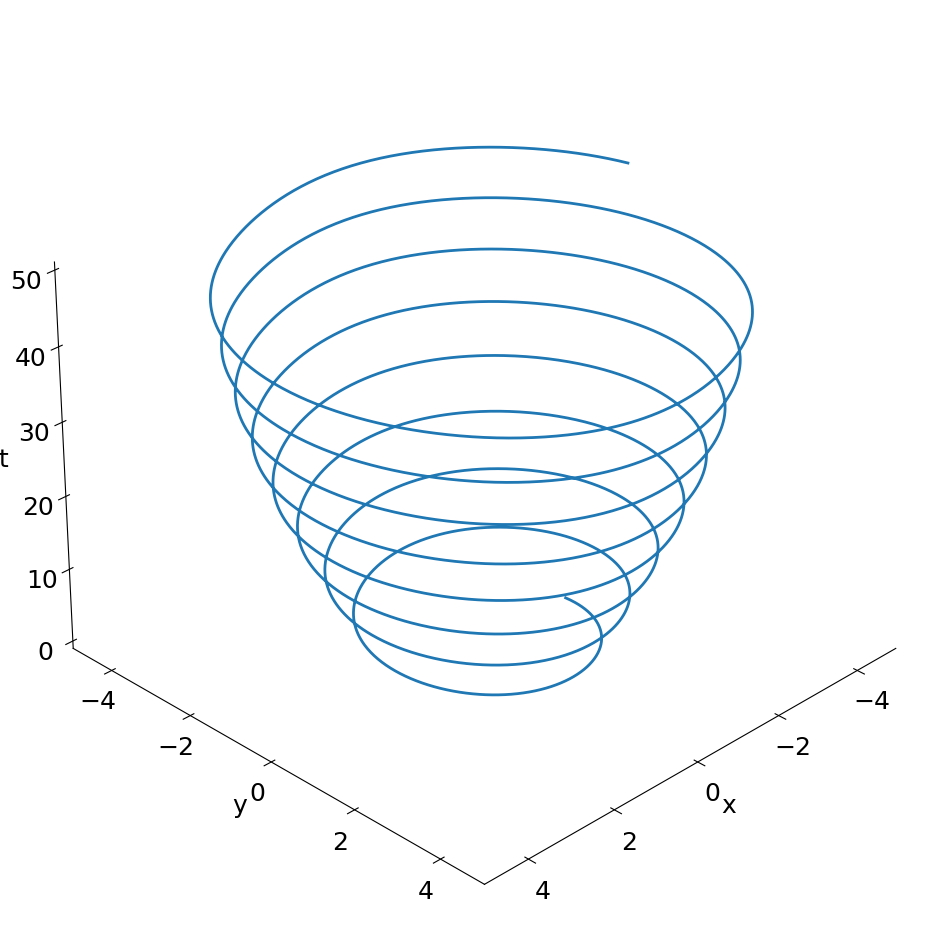

In [2]:
dt = 0.01
T = 50
t = np.arange(0,T+dt,dt)
a = -1.0
b =  0.1
c =  0.750


def oscillator_deriv(x_y, t0, a = a, b = b, c = c):
    x, y = x_y
    return [y, a*x +(b*y)*(np.cos(c*x))]

np.random.seed(123)
x0 = (-2, 0)
x_t = integrate.odeint(oscillator_deriv, x0, t, rtol=10**(-12),atol=10**(-12)*np.ones_like(x0))
x, y = x_t.T

# Create figure and 3D plot
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

# Plotting the data
ax.plot(x, y, t)

# Setting labels with Times New Roman font
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("t")

# Set limits for x and y axes
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)

# Remove background pane and borders
ax.xaxis.pane.fill = False  # Remove background pane for x-axis
ax.yaxis.pane.fill = False  # Remove background pane for y-axis
ax.zaxis.pane.fill = False  # Remove background pane for z-axis

# Turn off the pane borders
ax.xaxis.pane.set_edgecolor('none')  # No border for x-axis pane
ax.yaxis.pane.set_edgecolor('none')  # No border for y-axis pane
ax.zaxis.pane.set_edgecolor('none')  # No border for z-axis pane

# Remove grid
ax.grid(False)

ax.view_init(30, 45, 0)
# Save figure to a PDF file
plt.savefig('3d_plot.pdf', format='pdf', bbox_inches='tight')

# Display plot
plt.show()



In [3]:
# COMPUTING THE COMBINATIONS AMONG THE THREE CHOSEN TEMPORAL MODES

def POOL_DATA(yin, nVars, polyorder):
    n = yin.shape[0]
    yout = torch.zeros((n, 1)).to(processor)

    # poly order 0
    yout[:, 0] = torch.ones(n)

    # poly order 1
    for i in range(nVars):
        yout = torch.cat((yout, yin[:, i].reshape((yin.shape[0], 1))), dim=1).to(processor)

    # poly order 2
    if polyorder >= 2:
        for i in range(nVars):
            for j in range(i, nVars):
                yout = torch.cat((yout, (yin[:, i] * yin[:, j]).reshape((yin.shape[0], 1))), dim=1).to(processor)

    # poly order 3
    if polyorder >= 3:
        for i in range(nVars):
            for j in range(i, nVars):
                for k in range(j, nVars):
                    yout = torch.cat((yout, (yin[:, i] * yin[:, j] * yin[:, k]).reshape((yin.shape[0], 1))), dim=1).to(processor)

    return yout

def DERIVATIVE(x, y, a, b, c):
    dxdt = y
    dydt = a*x + b*y*torch.cos(c*x)    
    return torch.vstack((dxdt, dydt)).T


AVAILABLE PROCESSOR: cuda 



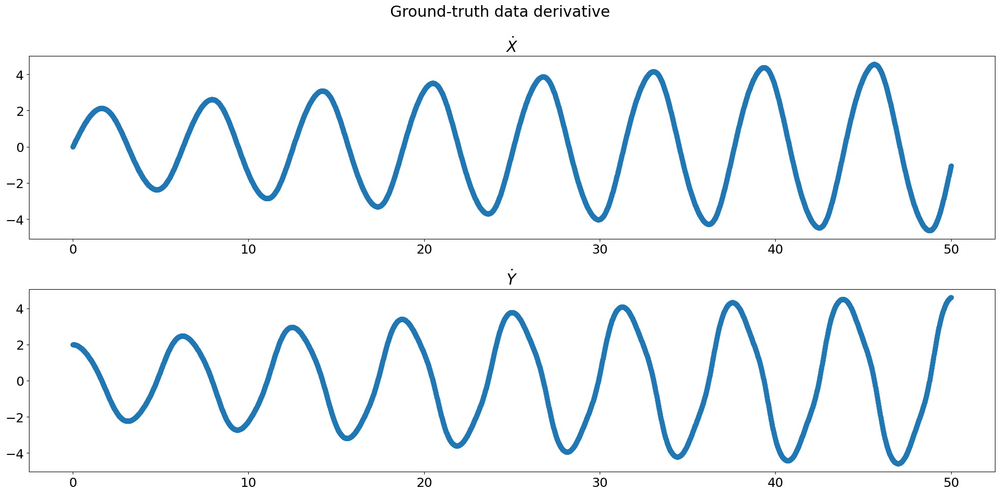

In [4]:
processor = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("AVAILABLE PROCESSOR:", processor, '\n')

N_modes  = 2
x_t      = torch.Tensor(x_t).to(processor)
x        = torch.Tensor(x).to(processor)
y        = torch.Tensor(y).to(processor)
t        = torch.Tensor(t).to(processor)

A_candidates    = POOL_DATA (x_t, 2, 1).to(processor)
A1A2_time_deriv = DERIVATIVE (x, y, a, b, c).to(processor)

# HYPERPARAMETERS FOR THE SINDy POD METHODOLOGY
Epochs        = 50000
learning_rate = 0.1
step_epoch    = 4000
decay_rate    = 0.50
tolerance     = 5e-3

fig, ax = plt.subplots(nrows = 2, ncols = 1, figsize =(20, 10))
fig.suptitle('Ground-truth data derivative')

ax[0].plot(t.detach().cpu().numpy(), A1A2_time_deriv[:, 0].detach().cpu().numpy(), '-o') 
ax[0].set_title('$\dot{X}$')

ax[1].plot(t.detach().cpu().numpy(), A1A2_time_deriv[:, 1].detach().cpu().numpy(), '-o') 
ax[1].set_title('$\dot{Y}$')

fig.tight_layout()
plt.show()


In [5]:
class SINE_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b
        
    def forward(self, x):
        output = torch.sin(self.b*x)
        return output
    
class COSINE_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b
        
    def forward(self, x):
        output = torch.cos(self.b*x)
        return output
    
class EXP_TERM (nn.Module):
    def __init__(self, b):
        super().__init__()
        self.b = b

    def forward(self, x):
        output = torch.exp(self.b*x)
        return output

In [6]:
class ADAM_SINDy_MODEL(nn.Module):
    def __init__(self, a, asine, acosine, aexp, axsine, axcosine, axexp):
        super().__init__()    
        self.a        = a
        self.asine    = asine
        self.acosine  = acosine
        self.aexp     = aexp
        self.axsine   = axsine
        self.axcosine = axcosine
        self.axexp    = axexp
        
        self.sine     = SINE_TERM   (self.asine)
        self.cosine   = COSINE_TERM (self.acosine)
        self.exp      = EXP_TERM    (self.aexp)
        self.xsine    = SINE_TERM   (self.axsine)
        self.xcosine  = COSINE_TERM (self.axcosine)
        self.xexp     = EXP_TERM    (self.axexp)
        
    def forward(self, x):
        x1             = x [:, 1:]
        output_sine    = self.sine   (x1)
        output_cosine  = self.cosine (x1)
        output_exp     = self.exp    (x1)
        output_xsine   = self.xsine   (x1)
        output_xcosine = self.xcosine (x1)
        output_xexp    = self.xexp    (x1)
 
        output_xsine   = (output_xsine  [:,None] * x1[...,None]).reshape(x1.shape[0], -1)
        output_xcosine = (output_xcosine[:,None] * x1[...,None]).reshape(x1.shape[0], -1)
        output_xexp    = (output_xexp   [:,None] * x1[...,None]).reshape(x1.shape[0], -1)
        
        output = torch.hstack((x, output_sine, output_cosine, output_exp, output_xsine, output_xcosine, output_xexp)) @ self.a
        return output


In [7]:
# AMPLITUDE COEFFICIENTS OF SINDy MODEL
COEFF_ADT   = torch.ones(21, N_modes, requires_grad= True, device= processor)

SINE_ADT    = torch.ones(A_candidates.shape[1]-1, N_modes, requires_grad= True, device= processor)
COSINE_ADT  = torch.ones(A_candidates.shape[1]-1, N_modes, requires_grad= True, device= processor)

XSINE_ADT   = torch.ones(A_candidates.shape[1]-1, N_modes, requires_grad= True, device= processor)
XCOSINE_ADT = torch.ones(A_candidates.shape[1]-1, N_modes, requires_grad= True, device= processor)

EXP_ADT     = torch.full((A_candidates.shape[1]-1, N_modes), -1.0, requires_grad= True, device= processor)
XEXP_ADT    = torch.full((A_candidates.shape[1]-1, N_modes), -1.0, requires_grad= True, device= processor)

In [8]:
# COEFFICIENTS OF SINDy MODEL
optim_COEFF_ADT = optim.Adam([COEFF_ADT, SINE_ADT, COSINE_ADT, EXP_ADT, XSINE_ADT, XCOSINE_ADT, XEXP_ADT], lr=learning_rate, betas = (0.9,0.99),eps = 10**-15)

# WEIGHT FUNCTION OF SINDy MODEL
torch.manual_seed(42)
WEIGHTS  = Parameter(torch.zeros_like(COEFF_ADT), requires_grad= True)
nn.init.normal_(WEIGHTS, mean=0, std=1.0)
Lambda   = Parameter(torch.tensor(1.0), requires_grad= True)

optim_weights = optim.Adam([WEIGHTS], lr = learning_rate*0.10, betas = (0.9,0.99),eps = 10**-15)
optim_Lambda  = optim.Adam([Lambda],  lr = learning_rate, betas = (0.9,0.99),eps = 10**-15)


# STEP DECAY DYNAMIC LEARNING RATE
scheduler_ADT     = torch.optim.lr_scheduler.StepLR(optim_COEFF_ADT, step_size=step_epoch, gamma=decay_rate)
scheduler_weights = torch.optim.lr_scheduler.StepLR(optim_weights,   step_size=step_epoch, gamma=decay_rate)
scheduler_LAMBDA  = torch.optim.lr_scheduler.StepLR(optim_Lambda,    step_size=step_epoch, gamma=decay_rate)


**Adaptive SINDy training**

In [9]:
# TEMPORAL MODE 1
A1_DT = ADAM_SINDy_MODEL(COEFF_ADT [:, 0], SINE_ADT [:, 0], COSINE_ADT[:, 0], EXP_ADT[:, 0], XSINE_ADT [:, 0], XCOSINE_ADT[:, 0], XEXP_ADT [:, 0]).to(processor)

# TEMPORAL MODE 2
A2_DT = ADAM_SINDy_MODEL(COEFF_ADT [:, 1], SINE_ADT [:, 1], COSINE_ADT[:, 1], EXP_ADT[:, 1], XSINE_ADT [:, 1], XCOSINE_ADT[:, 1], XEXP_ADT [:, 1]).to(processor)

Loss_data       = torch.empty(size=(Epochs, 1))
Gamma_correct   = torch.empty(size=(Epochs, 1))
Gamma_incorrect = torch.empty(size=(Epochs, 1))
loss_function   = nn.MSELoss()

for epoch in range(Epochs):
    A1_out, A2_out  = A1_DT (A_candidates), A2_DT (A_candidates)
    output_data  = torch.stack((A1_out , A2_out), dim = 1)
    loss_epoch   = loss_function (A1A2_time_deriv, output_data) + torch.linalg.matrix_norm(torch.abs(WEIGHTS)*COEFF_ADT, ord =1)
    
    optim_COEFF_ADT.zero_grad()
    optim_Lambda.zero_grad()
    optim_weights.zero_grad()
    loss_epoch.backward()

    with torch.no_grad():
        optim_COEFF_ADT.step()
        optim_Lambda.step()
        optim_weights.step()
        
        Loss_data       [epoch] = loss_epoch.detach()
        Gamma_incorrect [epoch] = WEIGHTS [0, 1].detach()
        Gamma_correct   [epoch] = WEIGHTS [1, 1].detach()
        
        COEFF_ADT   [torch.abs(COEFF_ADT)   <= tolerance] = 0.0
        SINE_ADT    [torch.abs(SINE_ADT)    <= tolerance] = 0.0
        COSINE_ADT  [torch.abs(COSINE_ADT)  <= tolerance] = 0.0
        XSINE_ADT   [torch.abs(XSINE_ADT)   <= tolerance] = 0.0
        XCOSINE_ADT [torch.abs(XCOSINE_ADT) <= tolerance] = 0.0
        EXP_ADT     [torch.abs(EXP_ADT)     <= tolerance] = 0.0
        XEXP_ADT    [torch.abs(XEXP_ADT)    <= tolerance] = 0.0
        
    print('LOSS DATA, [EPOCH =', epoch,  ']:',  Loss_data [epoch].item())
    print('LEARNING RATE:', optim_COEFF_ADT.param_groups[0]['lr'])
    print ("*"*85)
       
    scheduler_ADT.step()
    scheduler_LAMBDA.step()
    scheduler_weights.step()

LOSS DATA, [EPOCH = 0 ]: 14025.72265625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1 ]: 1925.355712890625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2 ]: 1115.04931640625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3 ]: 3199.041259765625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 4 ]: 2682.174560546875
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 5 ]: 1500.212890625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 6 ]: 684.1810302734375
LEARNING RATE: 0.1
*********************************************************

LOSS DATA, [EPOCH = 96 ]: 3.6152944564819336
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 97 ]: 3.5305023193359375
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 98 ]: 3.4710586071014404
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 99 ]: 3.393306255340576
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 100 ]: 3.3191628456115723
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 101 ]: 3.276700735092163
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 102 ]: 3.2139570713043213
LEARNING RATE: 0.1
***********************************

LOSS DATA, [EPOCH = 161 ]: 1.163252830505371
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 162 ]: 1.1424105167388916
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 163 ]: 1.1211433410644531
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 164 ]: 1.1024096012115479
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 165 ]: 1.0935806035995483
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 166 ]: 1.081747055053711
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 167 ]: 1.071016788482666
LEARNING RATE: 0.1
********************************

LOSS DATA, [EPOCH = 225 ]: 0.47876250743865967
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 226 ]: 0.4708157479763031
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 227 ]: 0.46356672048568726
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 228 ]: 0.45412513613700867
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 229 ]: 0.45632174611091614
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 230 ]: 0.43253737688064575
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 231 ]: 0.4241859018802643
LEARNING RATE: 0.1
************************

LOSS DATA, [EPOCH = 292 ]: 0.13847649097442627
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 293 ]: 0.13677071034908295
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 294 ]: 0.13928398489952087
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 295 ]: 0.1358737051486969
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 296 ]: 0.1296541541814804
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 297 ]: 0.13330668210983276
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 298 ]: 0.129048690199852
LEARNING RATE: 0.1
**************************

LOSS DATA, [EPOCH = 377 ]: 0.06077253073453903
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 378 ]: 0.06391706317663193
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 379 ]: 0.06755727529525757
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 380 ]: 0.0627904161810875
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 381 ]: 0.062305815517902374
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 382 ]: 0.0624542310833931
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 383 ]: 0.06578266620635986
LEARNING RATE: 0.1
***********************

LOSS DATA, [EPOCH = 437 ]: 0.049110978841781616
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 438 ]: 0.04799530282616615
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 439 ]: 0.044186752289533615
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 440 ]: 0.05066337808966637
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 441 ]: 0.04961378872394562
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 442 ]: 0.04779716208577156
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 443 ]: 0.050617169588804245
LEARNING RATE: 0.1
*******************

LOSS DATA, [EPOCH = 518 ]: 0.044174887239933014
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 519 ]: 0.06436406075954437
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 520 ]: 0.044138215482234955
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 521 ]: 0.045770272612571716
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 522 ]: 0.054031334817409515
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 523 ]: 0.042464204132556915
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 524 ]: 0.04597533121705055
LEARNING RATE: 0.1
*****************

LOSS DATA, [EPOCH = 592 ]: 0.045493997633457184
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 593 ]: 0.050517596304416656
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 594 ]: 0.04972901940345764
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 595 ]: 0.04420632869005203
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 596 ]: 0.04147611930966377
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 597 ]: 0.06341303884983063
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 598 ]: 0.057721950113773346
LEARNING RATE: 0.1
*******************

LOSS DATA, [EPOCH = 664 ]: 0.060728125274181366
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 665 ]: 0.0865987166762352
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 666 ]: 0.07877132296562195
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 667 ]: 0.08573031425476074
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 668 ]: 0.0814838632941246
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 669 ]: 0.08913763612508774
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 670 ]: 0.08492350578308105
LEARNING RATE: 0.1
***********************

LOSS DATA, [EPOCH = 747 ]: 0.02980198711156845
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 748 ]: 0.030987776815891266
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 749 ]: 0.03264342620968819
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 750 ]: 0.032103877514600754
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 751 ]: 0.02936103194952011
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 752 ]: 0.027419764548540115
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 753 ]: 0.024679146707057953
LEARNING RATE: 0.1
******************

LOSS DATA, [EPOCH = 816 ]: 0.05186597257852554
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 817 ]: 0.053741902112960815
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 818 ]: 0.04350551590323448
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 819 ]: 0.0361691415309906
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 820 ]: 0.05737442895770073
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 821 ]: 0.06115224212408066
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 822 ]: 0.04018203169107437
LEARNING RATE: 0.1
**********************

LOSS DATA, [EPOCH = 873 ]: 0.0537986122071743
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 874 ]: 0.04163765534758568
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 875 ]: 0.04352381452918053
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 876 ]: 0.044158872216939926
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 877 ]: 0.02194124273955822
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 878 ]: 0.04048784822225571
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 879 ]: 0.03559530898928642
LEARNING RATE: 0.1
**********************

LOSS DATA, [EPOCH = 933 ]: 0.019212763756513596
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 934 ]: 0.0173647403717041
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 935 ]: 0.02047853171825409
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 936 ]: 0.017473511397838593
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 937 ]: 0.01508193276822567
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 938 ]: 0.014860305935144424
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 939 ]: 0.016345452517271042
LEARNING RATE: 0.1
*******************

LOSS DATA, [EPOCH = 1000 ]: 0.010421381331980228
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1001 ]: 0.013478187844157219
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1002 ]: 0.01227792352437973
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1003 ]: 0.013693772256374359
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1004 ]: 0.012215559370815754
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1005 ]: 0.012223419733345509
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1006 ]: 0.011201968416571617
LEARNING RATE: 0.1
*********

LOSS DATA, [EPOCH = 1086 ]: 0.03757409006357193
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1087 ]: 0.03655519336462021
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1088 ]: 0.023320335894823074
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1089 ]: 0.03295283764600754
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1090 ]: 0.02602432668209076
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1091 ]: 0.04225148260593414
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1092 ]: 0.04004687815904617
LEARNING RATE: 0.1
**************

LOSS DATA, [EPOCH = 1173 ]: 0.037478670477867126
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1174 ]: 0.0564117431640625
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1175 ]: 0.07168439030647278
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1176 ]: 0.026289138942956924
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1177 ]: 0.046769879758358
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1178 ]: 0.03275803104043007
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1179 ]: 0.02927549183368683
LEARNING RATE: 0.1
****************

LOSS DATA, [EPOCH = 1236 ]: 0.012323347851634026
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1237 ]: 0.01782192662358284
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1238 ]: 0.017253143712878227
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1239 ]: 0.02294430509209633
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1240 ]: 0.023060841485857964
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1241 ]: 0.015882818028330803
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1242 ]: 0.011365256272256374
LEARNING RATE: 0.1
**********

LOSS DATA, [EPOCH = 1319 ]: 0.01129228062927723
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1320 ]: 0.016585100442171097
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1321 ]: 0.013285263441503048
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1322 ]: 0.011143174953758717
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1323 ]: 0.010461307130753994
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1324 ]: 0.013904347084462643
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1325 ]: 0.014578232541680336
LEARNING RATE: 0.1
*********

LOSS DATA, [EPOCH = 1402 ]: 0.012250388041138649
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1403 ]: 0.01222697552293539
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1404 ]: 0.01278283167630434
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1405 ]: 0.009370739571750164
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1406 ]: 0.011194704100489616
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1407 ]: 0.009791863150894642
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1408 ]: 0.011455569416284561
LEARNING RATE: 0.1
**********

LOSS DATA, [EPOCH = 1463 ]: 0.007648213766515255
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1464 ]: 0.008307515643537045
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1465 ]: 0.009255453012883663
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1466 ]: 0.007716518361121416
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1467 ]: 0.009544359520077705
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1468 ]: 0.009236861951649189
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1469 ]: 0.0059125954285264015
LEARNING RATE: 0.1
*******

LOSS DATA, [EPOCH = 1524 ]: 0.005563384387642145
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1525 ]: 0.004898057784885168
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1526 ]: 0.006726492196321487
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1527 ]: 0.00576478848233819
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1528 ]: 0.005438987165689468
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1529 ]: 0.004955153912305832
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1530 ]: 0.005281322635710239
LEARNING RATE: 0.1
*********

LOSS DATA, [EPOCH = 1586 ]: 0.007157260086387396
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1587 ]: 0.005532368086278439
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1588 ]: 0.0064588324166834354
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1589 ]: 0.007446950301527977
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1590 ]: 0.009325717575848103
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1591 ]: 0.008737345226109028
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1592 ]: 0.008268436416983604
LEARNING RATE: 0.1
*******

LOSS DATA, [EPOCH = 1645 ]: 0.009619586169719696
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1646 ]: 0.010040218010544777
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1647 ]: 0.008307266980409622
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1648 ]: 0.007626019883900881
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1649 ]: 0.006636474281549454
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1650 ]: 0.008230769075453281
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1651 ]: 0.008893740363419056
LEARNING RATE: 0.1
********

LOSS DATA, [EPOCH = 1704 ]: 0.005511149298399687
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1705 ]: 0.0037420790176838636
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1706 ]: 0.002887924900278449
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1707 ]: 0.00363505189307034
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1708 ]: 0.005003124475479126
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1709 ]: 0.006498198490589857
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1710 ]: 0.005636749789118767
LEARNING RATE: 0.1
********

LOSS DATA, [EPOCH = 1765 ]: 0.004700550809502602
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1766 ]: 0.004405950661748648
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1767 ]: 0.0039017382077872753
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1768 ]: 0.0022362847812473774
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1769 ]: 0.0032700062729418278
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1770 ]: 0.003555027535185218
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1771 ]: 0.0034207208082079887
LEARNING RATE: 0.1
****

LOSS DATA, [EPOCH = 1826 ]: 0.0040517039597034454
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1827 ]: 0.004150626249611378
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1828 ]: 0.0030734811443835497
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1829 ]: 0.002598934108391404
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1830 ]: 0.004335952457040548
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1831 ]: 0.004803902935236692
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1832 ]: 0.003787121269851923
LEARNING RATE: 0.1
******

LOSS DATA, [EPOCH = 1892 ]: 0.0018568701343610883
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1893 ]: 0.0033398831728845835
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1894 ]: 0.0035028785932809114
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1895 ]: 0.003174960147589445
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1896 ]: 0.0032417303882539272
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1897 ]: 0.0027769047301262617
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1898 ]: 0.0013634614879265428
LEARNING RATE: 0.1
**

LOSS DATA, [EPOCH = 1969 ]: 0.005991223733872175
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1970 ]: 0.005573078989982605
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1971 ]: 0.0060053118504583836
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1972 ]: 0.034298721700906754
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1973 ]: 0.19793018698692322
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1974 ]: 0.11498147249221802
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 1975 ]: 0.18522201478481293
LEARNING RATE: 0.1
**********

LOSS DATA, [EPOCH = 2031 ]: 0.003137714695185423
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2032 ]: 0.004154798574745655
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2033 ]: 0.003530477872118354
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2034 ]: 0.0016096727922558784
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2035 ]: 0.001676470972597599
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2036 ]: 0.0030844847206026316
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2037 ]: 0.0028489872347563505
LEARNING RATE: 0.1
*****

LOSS DATA, [EPOCH = 2096 ]: 0.0031824163161218166
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2097 ]: 0.0015624485677108169
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2098 ]: 0.0029687092173844576
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2099 ]: 0.0033158971928060055
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2100 ]: 0.0033235896844416857
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2101 ]: 0.0028611812740564346
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2102 ]: 0.001423378475010395
LEARNING RATE: 0.1
**

LOSS DATA, [EPOCH = 2179 ]: 0.0011980406707152724
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2180 ]: 0.0017076045041903853
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2181 ]: 0.0012773798080161214
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2182 ]: 0.0011546926107257605
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2183 ]: 0.002098474884405732
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2184 ]: 0.002123018028214574
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2185 ]: 0.0015912135131657124
LEARNING RATE: 0.1
***

LOSS DATA, [EPOCH = 2242 ]: 0.033384207636117935
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2243 ]: 0.01692458614706993
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2244 ]: 0.01808241382241249
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2245 ]: 0.030563151463866234
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2246 ]: 0.014976486563682556
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2247 ]: 0.016903214156627655
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2248 ]: 0.01699770800769329
LEARNING RATE: 0.1
***********

LOSS DATA, [EPOCH = 2304 ]: 0.000998656963929534
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2305 ]: 0.0025492901913821697
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2306 ]: 0.0026854053139686584
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2307 ]: 0.0025489688850939274
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2308 ]: 0.001739612896926701
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2309 ]: 0.0028673289343714714
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2310 ]: 0.011435608379542828
LEARNING RATE: 0.1
****

LOSS DATA, [EPOCH = 2361 ]: 0.0028627931606024504
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2362 ]: 0.0038911241572350264
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2363 ]: 0.003607304533943534
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2364 ]: 0.0035995016805827618
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2365 ]: 0.002209420083090663
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2366 ]: 0.0008799802744761109
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2367 ]: 0.0016903801588341594
LEARNING RATE: 0.1
***

LOSS DATA, [EPOCH = 2423 ]: 0.003599417395889759
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2424 ]: 0.0038959754165261984
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2425 ]: 0.0034606338012963533
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2426 ]: 0.0035478444769978523
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2427 ]: 0.002121369121596217
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2428 ]: 0.0009059409494511783
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2429 ]: 0.0017841923981904984
LEARNING RATE: 0.1
***

LOSS DATA, [EPOCH = 2485 ]: 0.0009745790157467127
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2486 ]: 0.001641196315176785
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2487 ]: 0.0030002484563738108
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2488 ]: 0.0031401284504681826
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2489 ]: 0.001745843794196844
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2490 ]: 0.0009084100602194667
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2491 ]: 0.0015741445822641253
LEARNING RATE: 0.1
***

LOSS DATA, [EPOCH = 2547 ]: 0.004711600951850414
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2548 ]: 0.005404455587267876
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2549 ]: 0.004464985337108374
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2550 ]: 0.0038257890846580267
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2551 ]: 0.002576890867203474
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2552 ]: 0.001968072960153222
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2553 ]: 0.002333375858142972
LEARNING RATE: 0.1
*******

LOSS DATA, [EPOCH = 2627 ]: 0.006779560819268227
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2628 ]: 0.008047976531088352
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2629 ]: 0.007008953485637903
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2630 ]: 0.0059991516172885895
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2631 ]: 0.0035364043433219194
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2632 ]: 0.0039042059797793627
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2633 ]: 0.005756472237408161
LEARNING RATE: 0.1
*****

LOSS DATA, [EPOCH = 2717 ]: 0.00292584509588778
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2718 ]: 0.0019924070220440626
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2719 ]: 0.0004777373105753213
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2720 ]: 0.001067895325832069
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2721 ]: 0.0007851089467294514
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2722 ]: 0.0005796216428279877
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2723 ]: 0.0016894055297598243
LEARNING RATE: 0.1
****

LOSS DATA, [EPOCH = 2792 ]: 0.003845146857202053
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2793 ]: 0.0038586980663239956
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2794 ]: 0.0032406754326075315
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2795 ]: 0.0021798890084028244
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2796 ]: 0.0005218620062805712
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2797 ]: 0.0013977003982290626
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2798 ]: 0.0020741946063935757
LEARNING RATE: 0.1
**

LOSS DATA, [EPOCH = 2867 ]: 0.0026291487738490105
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2868 ]: 0.001919649774208665
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2869 ]: 0.0019164171535521746
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2870 ]: 0.0009073447436094284
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2871 ]: 0.0015942355385050178
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2872 ]: 0.0009298754739575088
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2873 ]: 0.0009718894143588841
LEARNING RATE: 0.1
**

LOSS DATA, [EPOCH = 2950 ]: 0.0021859367843717337
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2951 ]: 0.0009171637939289212
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2952 ]: 0.002832255559042096
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2953 ]: 0.003370421938598156
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2954 ]: 0.0030985523480921984
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2955 ]: 0.00262821139767766
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 2956 ]: 0.0008382287342101336
LEARNING RATE: 0.1
*****

LOSS DATA, [EPOCH = 3009 ]: 0.003323232987895608
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3010 ]: 0.0027917753905057907
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3011 ]: 0.0012479861034080386
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3012 ]: 0.0008826617849990726
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3013 ]: 0.0010188923915848136
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3014 ]: 0.0011038430966436863
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3015 ]: 0.0006913184188306332
LEARNING RATE: 0.1
**

LOSS DATA, [EPOCH = 3085 ]: 0.001519691082648933
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3086 ]: 0.0024690546561032534
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3087 ]: 0.002671195426955819
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3088 ]: 0.003351410385221243
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3089 ]: 0.00323601346462965
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3090 ]: 0.0016972075682133436
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3091 ]: 0.0020934087224304676
LEARNING RATE: 0.1
******

LOSS DATA, [EPOCH = 3163 ]: 0.0025214417837560177
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3164 ]: 0.0021623438224196434
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3165 ]: 0.0015368369640782475
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3166 ]: 0.0029502774123102427
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3167 ]: 0.003172202268615365
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3168 ]: 0.002915676450356841
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3169 ]: 0.0025537286419421434
LEARNING RATE: 0.1
***

LOSS DATA, [EPOCH = 3235 ]: 0.003480796003714204
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3236 ]: 0.0028386996127665043
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3237 ]: 0.0023158027324825525
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3238 ]: 0.0031382394954562187
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3239 ]: 0.0044249738566577435
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3240 ]: 0.02211383730173111
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3241 ]: 0.13033823668956757
LEARNING RATE: 0.1
******

LOSS DATA, [EPOCH = 3298 ]: 0.002372379880398512
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3299 ]: 0.0027700515929609537
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3300 ]: 0.002379482612013817
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3301 ]: 0.00109375873580575
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3302 ]: 0.0015672047156840563
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3303 ]: 0.0021213290747255087
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3304 ]: 0.0016296242829412222
LEARNING RATE: 0.1
*****

LOSS DATA, [EPOCH = 3379 ]: 0.0024726316332817078
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3380 ]: 0.001653385115787387
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3381 ]: 0.0008205950143747032
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3382 ]: 0.0020751594565808773
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3383 ]: 0.002593414392322302
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3384 ]: 0.003416316118091345
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3385 ]: 0.0027548784855753183
LEARNING RATE: 0.1
****

LOSS DATA, [EPOCH = 3455 ]: 0.0008064396097324789
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3456 ]: 0.0013568939175456762
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3457 ]: 0.0011217001592740417
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3458 ]: 0.00041663763113319874
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3459 ]: 0.0010664151050150394
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3460 ]: 0.000487782119307667
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3461 ]: 0.0015241781948134303
LEARNING RATE: 0.1
*

LOSS DATA, [EPOCH = 3542 ]: 0.002781886840239167
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3543 ]: 0.003123976057395339
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3544 ]: 0.003187665482982993
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3545 ]: 0.0018561345059424639
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3546 ]: 0.0009855316020548344
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3547 ]: 0.002372876275330782
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3548 ]: 0.003481091232970357
LEARNING RATE: 0.1
******

LOSS DATA, [EPOCH = 3627 ]: 0.0016494417795911431
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3628 ]: 0.0012350379256531596
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3629 ]: 0.0011614550603553653
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3630 ]: 0.002587116090580821
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3631 ]: 0.002577638253569603
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3632 ]: 0.0016396564897149801
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3633 ]: 0.0008609461365267634
LEARNING RATE: 0.1
***

LOSS DATA, [EPOCH = 3688 ]: 0.0004892886499874294
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3689 ]: 0.001327413134276867
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3690 ]: 0.0017369536217302084
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3691 ]: 0.0008221941534429789
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3692 ]: 0.0013410355895757675
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3693 ]: 0.001974178943783045
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3694 ]: 0.0014018156798556447
LEARNING RATE: 0.1
***

LOSS DATA, [EPOCH = 3766 ]: 0.0022015334106981754
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3767 ]: 0.002093863906338811
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3768 ]: 0.00138613220769912
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3769 ]: 0.002044538501650095
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3770 ]: 0.001808759174309671
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3771 ]: 0.002100427635014057
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3772 ]: 0.0018478158162906766
LEARNING RATE: 0.1
*******

LOSS DATA, [EPOCH = 3827 ]: 0.021137436851859093
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3828 ]: 0.094789057970047
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3829 ]: 0.021670624613761902
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3830 ]: 0.08148560672998428
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3831 ]: 0.08302822709083557
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3832 ]: 0.09280218929052353
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3833 ]: 0.04194129258394241
LEARNING RATE: 0.1
***************

LOSS DATA, [EPOCH = 3886 ]: 0.001145465881563723
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3887 ]: 0.0008932872442528605
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3888 ]: 0.001189601607620716
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3889 ]: 0.0006357831880450249
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3890 ]: 0.0005865008570253849
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3891 ]: 0.0006167872343212366
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3892 ]: 0.0006430300418287516
LEARNING RATE: 0.1
***

LOSS DATA, [EPOCH = 3966 ]: 0.0010634380159899592
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3967 ]: 0.0008671914110891521
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3968 ]: 0.0006698760553263128
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3969 ]: 0.001390172285027802
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3970 ]: 0.0024355039931833744
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3971 ]: 0.00231383484788239
LEARNING RATE: 0.1
*************************************************************************************
LOSS DATA, [EPOCH = 3972 ]: 0.00169726915191859
LEARNING RATE: 0.1
******

LOSS DATA, [EPOCH = 4023 ]: 0.0010048785479739308
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4024 ]: 0.0008274706196971238
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4025 ]: 0.0003547047672327608
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4026 ]: 0.0005038926028646529
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4027 ]: 0.00010274980741087347
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4028 ]: 0.0006581837660633028
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4029 ]: 0.0007068555569276214
LEARNING RATE

LOSS DATA, [EPOCH = 4111 ]: 0.0006312120240181684
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4112 ]: 0.00027380380197428167
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4113 ]: 0.0006387467146851122
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4114 ]: 0.0007146241259761155
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4115 ]: 0.0007543996907770634
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4116 ]: 7.660876144655049e-05
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4117 ]: 0.0012815747177228332
LEARNING RATE

LOSS DATA, [EPOCH = 4183 ]: 0.0006193136796355247
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4184 ]: 0.0003861180739477277
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4185 ]: 0.0005217745783738792
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4186 ]: 0.0007444236543960869
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4187 ]: 0.0006461780285462737
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4188 ]: 2.7837300876853988e-05
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4189 ]: 0.00031049473909661174
LEARNING RAT

LOSS DATA, [EPOCH = 4241 ]: 0.0012342964764684439
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4242 ]: 0.0012535930145531893
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4243 ]: 0.0006872481317259371
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4244 ]: 0.00030132688698358834
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4245 ]: 0.0008251926628872752
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4246 ]: 0.0013021643972024322
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4247 ]: 0.0012817245442420244
LEARNING RATE

LOSS DATA, [EPOCH = 4332 ]: 0.0010084288660436869
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4333 ]: 0.0008728060056455433
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4334 ]: 0.0008710966794751585
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4335 ]: 0.0005388568388298154
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4336 ]: 0.0004283894377294928
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4337 ]: 0.0003012369270436466
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4338 ]: 0.0005448346491903067
LEARNING RATE:

LOSS DATA, [EPOCH = 4419 ]: 0.00049096520524472
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4420 ]: 0.0011309763649478555
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4421 ]: 0.0011063844431191683
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4422 ]: 0.0006124805076979101
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4423 ]: 0.0002292317512910813
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4424 ]: 0.0003901045711245388
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4425 ]: 1.542003701615613e-05
LEARNING RATE: 0

LOSS DATA, [EPOCH = 4513 ]: 0.0011526227463036776
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4514 ]: 0.001384997507557273
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4515 ]: 0.0012559035094454885
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4516 ]: 0.001028162892907858
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4517 ]: 0.0003279788070358336
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4518 ]: 0.0008926778682507575
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4519 ]: 0.00154648267198354
LEARNING RATE: 0.0

LOSS DATA, [EPOCH = 4616 ]: 0.001141407061368227
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4617 ]: 0.00033959426218643785
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4618 ]: 0.0007422016933560371
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4619 ]: 0.0015384294092655182
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4620 ]: 0.001631166785955429
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4621 ]: 0.0010628862073644996
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4622 ]: 0.000772680330555886
LEARNING RATE: 0

LOSS DATA, [EPOCH = 4712 ]: 0.0007495263707824051
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4713 ]: 0.0009040067670866847
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4714 ]: 0.0014279098249971867
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4715 ]: 0.0017348097171634436
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4716 ]: 0.0013124890392646194
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4717 ]: 0.0002973181544803083
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4718 ]: 0.0007403867784887552
LEARNING RATE:

LOSS DATA, [EPOCH = 4806 ]: 0.009184383787214756
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4807 ]: 0.010969454422593117
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4808 ]: 0.009948011487722397
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4809 ]: 0.007109103724360466
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4810 ]: 0.004456068389117718
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4811 ]: 0.005621064454317093
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4812 ]: 0.007319840602576733
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 4903 ]: 0.001297560054808855
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4904 ]: 0.001195494900457561
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4905 ]: 0.001064763288013637
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4906 ]: 0.0006564414943568408
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4907 ]: 0.0005243935738690197
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4908 ]: 0.0005281268386170268
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 4909 ]: 0.00044194559450261295
LEARNING RATE: 0

LOSS DATA, [EPOCH = 5004 ]: 0.015515344217419624
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5005 ]: 0.008052312768995762
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5006 ]: 0.005484200082719326
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5007 ]: 0.011017211712896824
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5008 ]: 0.007636547088623047
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5009 ]: 0.00789410900324583
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5010 ]: 0.00507936580106616
LEARNING RATE: 0.05
***

LOSS DATA, [EPOCH = 5096 ]: 0.0009854690870270133
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5097 ]: 0.0008970883209258318
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5098 ]: 0.00024961947929114103
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5099 ]: 0.0007627400336787105
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5100 ]: 0.0006762394914403558
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5101 ]: 0.000954759365413338
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5102 ]: 0.0009653586894273758
LEARNING RATE:

LOSS DATA, [EPOCH = 5199 ]: 0.0005708890967071056
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5200 ]: 0.00024670897983014584
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5201 ]: 0.0009719183435663581
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5202 ]: 0.0011465513380244374
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5203 ]: 0.0007589892484247684
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5204 ]: 0.0003276726638432592
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5205 ]: 0.0005570948123931885
LEARNING RATE

LOSS DATA, [EPOCH = 5298 ]: 0.0011470059398561716
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5299 ]: 0.0007394481799565256
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5300 ]: 0.00033461267594248056
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5301 ]: 0.0007017945172265172
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5302 ]: 0.000360138772521168
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5303 ]: 0.0009587277309037745
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5304 ]: 0.001143213245086372
LEARNING RATE: 

LOSS DATA, [EPOCH = 5401 ]: 0.000473531661555171
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5402 ]: 0.0006189374253153801
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5403 ]: 0.0012575163273140788
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5404 ]: 0.0012399874394759536
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5405 ]: 0.0008108887122943997
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5406 ]: 0.00041625977610237896
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5407 ]: 0.0008247254882007837
LEARNING RATE:

LOSS DATA, [EPOCH = 5504 ]: 0.0015870172064751387
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5505 ]: 0.0012972259428352118
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5506 ]: 0.000513722887262702
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5507 ]: 0.0008350094431079924
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5508 ]: 0.0008817774942144752
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5509 ]: 0.0006454724934883416
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5510 ]: 0.0006479636067524552
LEARNING RATE: 

LOSS DATA, [EPOCH = 5574 ]: 0.0013495434541255236
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5575 ]: 0.0015360830584540963
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5576 ]: 0.0015160725452005863
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5577 ]: 0.0012379986001178622
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5578 ]: 0.000507768418174237
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5579 ]: 0.0008010774618014693
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5580 ]: 0.0008454115595668554
LEARNING RATE: 

LOSS DATA, [EPOCH = 5630 ]: 0.0006881137378513813
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5631 ]: 0.0011991197243332863
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5632 ]: 0.0009378165705129504
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5633 ]: 0.0006147209787741303
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5634 ]: 0.0007542790845036507
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5635 ]: 0.0005315087619237602
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5636 ]: 0.0003714395861607045
LEARNING RATE:

LOSS DATA, [EPOCH = 5709 ]: 0.0008167577325366437
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5710 ]: 0.0008968593319877982
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5711 ]: 0.0012768858578056097
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5712 ]: 0.0015571166295558214
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5713 ]: 0.001070648548193276
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5714 ]: 0.0006077213329263031
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5715 ]: 0.0009403220028616488
LEARNING RATE: 

LOSS DATA, [EPOCH = 5765 ]: 0.000500208348967135
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5766 ]: 0.001193693489767611
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5767 ]: 0.0011796306353062391
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5768 ]: 0.0012464859755709767
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5769 ]: 0.0008426079293712974
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5770 ]: 0.0008538764086551964
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5771 ]: 0.001263856771402061
LEARNING RATE: 0.

LOSS DATA, [EPOCH = 5821 ]: 0.00047893848386593163
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5822 ]: 0.000990397878922522
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5823 ]: 0.0015446022152900696
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5824 ]: 0.0012798061361536384
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5825 ]: 0.0014314218424260616
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5826 ]: 0.0009075427078641951
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5827 ]: 0.0014020659727975726
LEARNING RATE:

LOSS DATA, [EPOCH = 5877 ]: 0.0010941126383841038
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5878 ]: 0.0017201005248352885
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5879 ]: 0.001452733064070344
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5880 ]: 0.0007615034119226038
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5881 ]: 0.0007416969747282565
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5882 ]: 0.0007753903628326952
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5883 ]: 0.0003450440417509526
LEARNING RATE: 

LOSS DATA, [EPOCH = 5933 ]: 0.00029835416353307664
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5934 ]: 0.0005383469397202134
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5935 ]: 0.001160107203759253
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5936 ]: 0.0009281754028052092
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5937 ]: 0.00036744654062204063
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5938 ]: 0.001060638576745987
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5939 ]: 0.0010643542045727372
LEARNING RATE:

LOSS DATA, [EPOCH = 5991 ]: 0.014714455232024193
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5992 ]: 0.007348816376179457
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5993 ]: 0.005760852713137865
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5994 ]: 0.008774185553193092
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5995 ]: 0.01359148882329464
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5996 ]: 0.010351067408919334
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 5997 ]: 0.0062031131237745285
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 6045 ]: 0.001662706257775426
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6046 ]: 0.0010445063235238194
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6047 ]: 0.0016783184837549925
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6048 ]: 0.0018796531949192286
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6049 ]: 0.0022300714626908302
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6050 ]: 0.0017578378319740295
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6051 ]: 0.001301608164794743
LEARNING RATE: 0

LOSS DATA, [EPOCH = 6108 ]: 0.000565765134524554
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6109 ]: 0.0003863792517222464
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6110 ]: 0.0002306636597495526
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6111 ]: 0.0004810608515981585
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6112 ]: 0.00030261033680289984
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6113 ]: 0.0009522315231151879
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6114 ]: 0.001085772062651813
LEARNING RATE: 

LOSS DATA, [EPOCH = 6162 ]: 0.000931685499381274
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6163 ]: 0.0008563844603486359
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6164 ]: 0.0006557932938449085
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6165 ]: 0.0002803594106808305
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6166 ]: 0.0009651404689066112
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6167 ]: 0.0016740591963753104
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6168 ]: 0.001679835026152432
LEARNING RATE: 0

LOSS DATA, [EPOCH = 6241 ]: 0.00124250294174999
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6242 ]: 0.001534282579086721
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6243 ]: 0.0019646112341433764
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6244 ]: 0.001709562842734158
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6245 ]: 0.0007555884658358991
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6246 ]: 0.0006309280870482326
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6247 ]: 0.0009924552869051695
LEARNING RATE: 0.0

LOSS DATA, [EPOCH = 6295 ]: 0.0010288290213793516
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6296 ]: 0.001405131770297885
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6297 ]: 0.0013167466968297958
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6298 ]: 0.000647040200419724
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6299 ]: 0.00034657370997592807
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6300 ]: 0.0008994307718239725
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6301 ]: 0.0015902910381555557
LEARNING RATE: 

LOSS DATA, [EPOCH = 6354 ]: 0.020275326445698738
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6355 ]: 0.025072423741221428
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6356 ]: 0.010891830548644066
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6357 ]: 0.007114457432180643
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6358 ]: 0.016283683478832245
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6359 ]: 0.014746250584721565
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6360 ]: 0.009400254115462303
LEARNING RATE: 0.05
*

LOSS DATA, [EPOCH = 6407 ]: 0.002873630030080676
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6408 ]: 0.002532405313104391
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6409 ]: 0.0014282333431765437
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6410 ]: 0.0010489182313904166
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6411 ]: 0.0019571015145629644
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6412 ]: 0.0026019373908638954
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6413 ]: 0.0023959693498909473
LEARNING RATE: 0

LOSS DATA, [EPOCH = 6463 ]: 0.0019942079670727253
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6464 ]: 0.0019523486262187362
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6465 ]: 0.0012569964164867997
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6466 ]: 0.0007564190309494734
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6467 ]: 0.0016676111845299602
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6468 ]: 0.001915175118483603
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6469 ]: 0.0017084898427128792
LEARNING RATE: 

LOSS DATA, [EPOCH = 6524 ]: 0.0016668625175952911
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6525 ]: 0.00167262542527169
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6526 ]: 0.001555286580696702
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6527 ]: 0.000736922665964812
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6528 ]: 0.0007054289453662932
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6529 ]: 0.0012909341603517532
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6530 ]: 0.0011126563185825944
LEARNING RATE: 0.0

LOSS DATA, [EPOCH = 6617 ]: 0.00039229568210430443
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6618 ]: 0.000635895470622927
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6619 ]: 0.0002632054383866489
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6620 ]: 0.0005752763245254755
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6621 ]: 0.0005857126088812947
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6622 ]: 0.0003493485855869949
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6623 ]: 0.0006053352844901383
LEARNING RATE:

LOSS DATA, [EPOCH = 6698 ]: 0.0005600177100859582
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6699 ]: 0.0014327664393931627
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6700 ]: 0.0017254379345104098
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6701 ]: 0.0017062469851225615
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6702 ]: 0.0015845332527533174
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6703 ]: 0.0007567497086711228
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6704 ]: 0.000709905696567148
LEARNING RATE: 

LOSS DATA, [EPOCH = 6780 ]: 0.0015147485537454486
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6781 ]: 0.0007396669243462384
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6782 ]: 0.0006405311869457364
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6783 ]: 0.0011961967684328556
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6784 ]: 0.0010274414671584964
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6785 ]: 0.0009997024899348617
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6786 ]: 0.0005408416036516428
LEARNING RATE:

LOSS DATA, [EPOCH = 6840 ]: 0.009765836410224438
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6841 ]: 0.00874604843556881
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6842 ]: 0.012886100448668003
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6843 ]: 0.005786719266325235
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6844 ]: 0.005424067378044128
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6845 ]: 0.005432584788650274
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6846 ]: 0.008239133283495903
LEARNING RATE: 0.05
**

LOSS DATA, [EPOCH = 6894 ]: 0.0036039771512150764
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6895 ]: 0.002585724461823702
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6896 ]: 0.0021496734116226435
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6897 ]: 0.0031879558227956295
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6898 ]: 0.004314223304390907
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6899 ]: 0.0035078581422567368
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6900 ]: 0.0026500499807298183
LEARNING RATE: 0

LOSS DATA, [EPOCH = 6980 ]: 0.0004948702990077436
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6981 ]: 0.0006733940681442618
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6982 ]: 0.001099859713576734
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6983 ]: 0.0011776892933994532
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6984 ]: 0.0006112596020102501
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6985 ]: 0.0007867712411098182
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 6986 ]: 0.0011898064985871315
LEARNING RATE: 

LOSS DATA, [EPOCH = 7071 ]: 0.0010717813856899738
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7072 ]: 0.00038662878796458244
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7073 ]: 0.000949501118157059
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7074 ]: 0.0014262665063142776
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7075 ]: 0.0011263758642598987
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7076 ]: 0.0009685056284070015
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7077 ]: 0.0007494040764868259
LEARNING RATE:

LOSS DATA, [EPOCH = 7128 ]: 0.0019395286217331886
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7129 ]: 0.0019005239009857178
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7130 ]: 0.0013295364333316684
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7131 ]: 0.000752169347833842
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7132 ]: 0.0006449142238125205
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7133 ]: 0.0010533292079344392
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7134 ]: 0.001185067230835557
LEARNING RATE: 0

LOSS DATA, [EPOCH = 7184 ]: 0.000609623035416007
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7185 ]: 0.0010085756657645106
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7186 ]: 0.0014315365115180612
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7187 ]: 0.0011279197642579675
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7188 ]: 0.0002325177629245445
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7189 ]: 0.0007312746602110565
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7190 ]: 0.0008612835663370788
LEARNING RATE: 

LOSS DATA, [EPOCH = 7254 ]: 0.0011460159439593554
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7255 ]: 0.0011963103897869587
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7256 ]: 0.0009120117756538093
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7257 ]: 0.00030432743369601667
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7258 ]: 0.0009890578221529722
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7259 ]: 0.001050471910275519
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7260 ]: 0.000649576832074672
LEARNING RATE: 

LOSS DATA, [EPOCH = 7312 ]: 0.0013096930924803019
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7313 ]: 0.001140099368058145
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7314 ]: 0.0008685241336934268
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7315 ]: 0.0002521178685128689
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7316 ]: 0.0010304355528205633
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7317 ]: 0.0010871756821870804
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7318 ]: 0.0006747606676071882
LEARNING RATE: 

LOSS DATA, [EPOCH = 7388 ]: 0.004463435150682926
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7389 ]: 0.005794530734419823
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7390 ]: 0.07517843693494797
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7391 ]: 0.026219993829727173
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7392 ]: 0.12356196343898773
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7393 ]: 0.018654193729162216
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7394 ]: 0.08386211097240448
LEARNING RATE: 0.05
****

LOSS DATA, [EPOCH = 7465 ]: 0.0016282686265185475
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7466 ]: 0.0005898828967474401
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7467 ]: 0.0010364226764068007
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7468 ]: 0.0018003301229327917
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7469 ]: 0.0018002743599936366
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7470 ]: 0.0011169828940182924
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7471 ]: 0.0009007490007206798
LEARNING RATE:

LOSS DATA, [EPOCH = 7519 ]: 0.0018399409018456936
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7520 ]: 0.0018089953809976578
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7521 ]: 0.001089367549866438
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7522 ]: 0.0008029215969145298
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7523 ]: 0.0016824655467644334
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7524 ]: 0.0020160421263426542
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7525 ]: 0.0016330699436366558
LEARNING RATE: 

LOSS DATA, [EPOCH = 7602 ]: 0.0008141855360008776
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7603 ]: 0.0004560792294796556
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7604 ]: 0.0008014082559384406
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7605 ]: 0.0009693203028291464
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7606 ]: 0.0006216565961949527
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7607 ]: 0.0007421502377837896
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7608 ]: 0.0005942825810052454
LEARNING RATE:

LOSS DATA, [EPOCH = 7658 ]: 0.0008717672317288816
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7659 ]: 0.0008302130154334009
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7660 ]: 0.0003098028537351638
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7661 ]: 0.0006602636422030628
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7662 ]: 0.0009050926892086864
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7663 ]: 0.0009293357725255191
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7664 ]: 0.00034124424564652145
LEARNING RATE

LOSS DATA, [EPOCH = 7739 ]: 0.001372575992718339
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7740 ]: 0.0007093966705724597
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7741 ]: 0.0006076219724491239
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7742 ]: 0.001067871693521738
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7743 ]: 0.0007640614057891071
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7744 ]: 0.0008047496667131782
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7745 ]: 0.0011096539674326777
LEARNING RATE: 0

LOSS DATA, [EPOCH = 7833 ]: 0.0017257117433473468
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7834 ]: 0.001738951657898724
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7835 ]: 0.0013610429596155882
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7836 ]: 0.0009641439537517726
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7837 ]: 0.0007297078846022487
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7838 ]: 0.0015014021191745996
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7839 ]: 0.0015526468632742763
LEARNING RATE: 

LOSS DATA, [EPOCH = 7927 ]: 0.0016795577248558402
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7928 ]: 0.0013317388948053122
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7929 ]: 0.0006370990304276347
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7930 ]: 0.0007710344507358968
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7931 ]: 0.0012513119727373123
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7932 ]: 0.0011016560019925237
LEARNING RATE: 0.05
*************************************************************************************
LOSS DATA, [EPOCH = 7933 ]: 0.0007667966419830918
LEARNING RATE:

LOSS DATA, [EPOCH = 8020 ]: 0.0004405522486194968
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8021 ]: 0.0006928792572580278
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8022 ]: 0.0006360280676744878
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8023 ]: 0.0004773091641254723
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8024 ]: 0.00028029640088789165
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8025 ]: 0.000678529089782387
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8026 ]: 0.0006739774253219366
LEARNING

LOSS DATA, [EPOCH = 8111 ]: 0.0005795405595563352
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8112 ]: 0.0006569131510332227
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8113 ]: 0.0007390760001726449
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8114 ]: 0.0005792716983705759
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8115 ]: 0.0003963496128562838
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8116 ]: 0.00038069559377618134
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8117 ]: 0.0004207441525068134
LEARNIN

LOSS DATA, [EPOCH = 8207 ]: 0.0018427822506055236
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8208 ]: 0.0014817998744547367
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8209 ]: 0.0010222026612609625
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8210 ]: 0.001039943308569491
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8211 ]: 0.000979443546384573
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8212 ]: 0.0007857227465137839
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8213 ]: 0.0008408324210904539
LEARNING R

LOSS DATA, [EPOCH = 8303 ]: 0.0004819905152544379
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8304 ]: 0.0006553686689585447
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8305 ]: 0.00047619311953894794
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8306 ]: 0.0003323606215417385
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8307 ]: 0.00047991343308240175
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8308 ]: 0.0005261462065391243
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8309 ]: 0.0005896565853618085
LEARNI

LOSS DATA, [EPOCH = 8403 ]: 0.0006869047647342086
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8404 ]: 0.0006942327599972486
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8405 ]: 0.00047707301564514637
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8406 ]: 0.00033839931711554527
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8407 ]: 0.000290511641651392
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8408 ]: 0.0006812763167545199
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8409 ]: 0.0007087019039317966
LEARNIN

LOSS DATA, [EPOCH = 8503 ]: 0.0004957817145623267
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8504 ]: 0.0004355981945991516
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8505 ]: 0.0004988444270566106
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8506 ]: 0.0005695505533367395
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8507 ]: 0.0005437908112071455
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8508 ]: 0.00040693991468288004
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8509 ]: 0.00021499654394574463
LEARNI

LOSS DATA, [EPOCH = 8605 ]: 0.0002319824998266995
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8606 ]: 0.00045452063204720616
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8607 ]: 0.0004848318931180984
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8608 ]: 0.00033005731529556215
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8609 ]: 0.00017015324556268752
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8610 ]: 0.00032239724532701075
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8611 ]: 0.00013309024507179856
LEA

LOSS DATA, [EPOCH = 8700 ]: 0.0006966369692236185
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8701 ]: 0.000552166486158967
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8702 ]: 0.0005537825054489076
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8703 ]: 0.0003693411126732826
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8704 ]: 0.0004059142083860934
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8705 ]: 0.00031257723458111286
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8706 ]: 0.00020522336126305163
LEARNIN

LOSS DATA, [EPOCH = 8793 ]: 0.0003462033928371966
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8794 ]: 0.00038165177102200687
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8795 ]: 0.0003492910764180124
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8796 ]: 0.000213552251807414
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8797 ]: 0.0001226737367687747
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8798 ]: 0.0003038932627532631
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8799 ]: 0.0003422482986934483
LEARNING

LOSS DATA, [EPOCH = 8893 ]: 0.00024250232672784477
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8894 ]: 0.00042011012556031346
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8895 ]: 0.0005098150577396154
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8896 ]: 0.0002712921123020351
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8897 ]: 0.0005986106116324663
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8898 ]: 0.0007758591673336923
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8899 ]: 0.0005412030150182545
LEARNI

LOSS DATA, [EPOCH = 8994 ]: 0.0003399740962777287
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8995 ]: 0.00028419343288987875
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8996 ]: 0.000130921951495111
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8997 ]: 0.0004961109370924532
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8998 ]: 0.0005309578264132142
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 8999 ]: 0.0007243023137561977
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9000 ]: 0.0005648117512464523
LEARNING

LOSS DATA, [EPOCH = 9094 ]: 0.0007436107844114304
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9095 ]: 0.00043251816532574594
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9096 ]: 0.0006508016376756132
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9097 ]: 0.0009142509079538286
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9098 ]: 0.0010200043907389045
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9099 ]: 0.0008553351508453488
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9100 ]: 0.0003418652922846377
LEARNIN

LOSS DATA, [EPOCH = 9191 ]: 7.11257234797813e-05
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9192 ]: 0.0002501359849702567
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9193 ]: 0.00021060011931695044
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9194 ]: 0.00016434697317890823
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9195 ]: 0.00042749819112941623
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9196 ]: 0.0005025238497182727
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9197 ]: 0.0003330338222440332
LEARNI

LOSS DATA, [EPOCH = 9265 ]: 0.00036469893530011177
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9266 ]: 0.00042960597784258425
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9267 ]: 0.000291925563942641
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9268 ]: 0.0003081063914578408
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9269 ]: 0.0006635246681980789
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9270 ]: 0.0006915770354680717
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9271 ]: 0.0005399484070949256
LEARNIN

LOSS DATA, [EPOCH = 9342 ]: 0.0004625490109901875
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9343 ]: 0.0005463530542328954
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9344 ]: 0.0005830872105434537
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9345 ]: 0.0009310701861977577
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9346 ]: 0.000924770487472415
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9347 ]: 0.0006162109784781933
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9348 ]: 0.0005786954425275326
LEARNING 

LOSS DATA, [EPOCH = 9417 ]: 0.000594272802118212
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9418 ]: 0.0003534449788276106
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9419 ]: 0.00017516408115625381
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9420 ]: 0.00032159051625058055
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9421 ]: 0.0001966693380381912
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9422 ]: 0.00029778829775750637
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9423 ]: 0.0007163837435655296
LEARNI

LOSS DATA, [EPOCH = 9499 ]: 0.0003931670798920095
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9500 ]: 0.0008067232556641102
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9501 ]: 0.0008200765587389469
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9502 ]: 0.0004775187699124217
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9503 ]: 0.00019235035870224237
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9504 ]: 0.000389464054023847
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9505 ]: 0.0002682208432815969
LEARNING

LOSS DATA, [EPOCH = 9576 ]: 0.0008103327127173543
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9577 ]: 0.0008932430064305663
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9578 ]: 0.0005857173819094896
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9579 ]: 0.0005391568993218243
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9580 ]: 0.000854529847856611
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9581 ]: 0.000946525891777128
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9582 ]: 0.0007495622849091887
LEARNING R

LOSS DATA, [EPOCH = 9653 ]: 0.0009202767396345735
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9654 ]: 0.0010301878210157156
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9655 ]: 0.0008063353016041219
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9656 ]: 0.0005908121820539236
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9657 ]: 0.0004969543660990894
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9658 ]: 0.0002939771511591971
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9659 ]: 0.00036700651980936527
LEARNIN

LOSS DATA, [EPOCH = 9731 ]: 0.0007442465284839272
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9732 ]: 0.00044170956243760884
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9733 ]: 0.00035307748476043344
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9734 ]: 0.0007542242528870702
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9735 ]: 0.0009085749043151736
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9736 ]: 0.000691471213940531
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9737 ]: 0.0008613837417215109
LEARNIN

LOSS DATA, [EPOCH = 9808 ]: 0.0009051824454218149
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9809 ]: 0.0010710814967751503
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9810 ]: 0.0008268688688986003
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9811 ]: 0.00047980359522625804
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9812 ]: 0.000326598237734288
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9813 ]: 0.00042947722249664366
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9814 ]: 0.00013515280443243682
LEARNI

LOSS DATA, [EPOCH = 9885 ]: 0.00011663397162919864
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9886 ]: 0.00014743924839422107
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9887 ]: 0.00031020952155813575
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9888 ]: 0.00032334873685613275
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9889 ]: 0.00017096148803830147
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9890 ]: 0.00031644164118915796
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9891 ]: 0.00040903277113102376
L

LOSS DATA, [EPOCH = 9961 ]: 0.0012827611062675714
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9962 ]: 0.0013362424215301871
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9963 ]: 0.0009988710517063737
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9964 ]: 0.0003135385341010988
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9965 ]: 0.000809192773886025
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9966 ]: 0.0012622671201825142
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 9967 ]: 0.0014042544644325972
LEARNING 

LOSS DATA, [EPOCH = 10039 ]: 0.000799714878667146
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10040 ]: 0.0006206821417436004
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10041 ]: 0.0007470404962077737
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10042 ]: 0.000550385972019285
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10043 ]: 0.0006010997458361089
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10044 ]: 0.00032557296799495816
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10045 ]: 0.00030409437022171915
L

LOSS DATA, [EPOCH = 10092 ]: 0.0005388493882492185
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10093 ]: 0.0005450634052976966
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10094 ]: 0.0003538438759278506
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10095 ]: 0.00028407800709828734
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10096 ]: 0.000724231475032866
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10097 ]: 0.0007867538370192051
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10098 ]: 0.00044923488167114556


LOSS DATA, [EPOCH = 10145 ]: 0.0006113647832535207
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10146 ]: 9.643301018513739e-05
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10147 ]: 0.000635561824310571
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10148 ]: 0.000809294288046658
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10149 ]: 0.0006089172093197703
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10150 ]: 0.0005413931212387979
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10151 ]: 0.0004056962497998029
LEA

LOSS DATA, [EPOCH = 10198 ]: 0.000561848224606365
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10199 ]: 0.0006243163952603936
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10200 ]: 0.00032597099198028445
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10201 ]: 0.00041982883703894913
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10202 ]: 0.0008562714792788029
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10203 ]: 0.00100490462500602
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10204 ]: 0.000788300356362015
LEA

LOSS DATA, [EPOCH = 10278 ]: 0.0007561545935459435
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10279 ]: 0.0004771478706970811
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10280 ]: 0.00022999996144790202
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10281 ]: 0.0003998699248768389
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10282 ]: 0.00041225802851840854
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10283 ]: 0.00024968228535726666
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10284 ]: 0.000256602361332625

LOSS DATA, [EPOCH = 10330 ]: 5.313725341693498e-05
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10331 ]: 0.0008220765157602727
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10332 ]: 0.0012289691949263215
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10333 ]: 0.0012200535275042057
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10334 ]: 0.0009421739960089326
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10335 ]: 0.0004924179520457983
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10336 ]: 0.00038940904778428376


LOSS DATA, [EPOCH = 10406 ]: 0.0007458761683665216
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10407 ]: 0.0005418699001893401
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10408 ]: 0.0003641977964434773
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10409 ]: 0.0001931973674800247
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10410 ]: 0.00036020332481712103
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10411 ]: 0.00039058271795511246
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10412 ]: 0.0002215148124378174

LOSS DATA, [EPOCH = 10482 ]: 0.007353659253567457
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10483 ]: 0.0026853233575820923
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10484 ]: 0.0012429929338395596
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10485 ]: 0.0031435168348252773
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10486 ]: 0.003932793624699116
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10487 ]: 0.0028887197840958834
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10488 ]: 0.001658330438658595
LEAR

LOSS DATA, [EPOCH = 10559 ]: 0.0008054178906604648
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10560 ]: 0.0008771370048634708
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10561 ]: 0.0005661308532580733
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10562 ]: 0.000623183383140713
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10563 ]: 0.0006765477592125535
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10564 ]: 0.0008312863647006452
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10565 ]: 0.0005977094988338649
LE

LOSS DATA, [EPOCH = 10640 ]: 0.0007737007108516991
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10641 ]: 0.0004556180792860687
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10642 ]: 0.0001922816300066188
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10643 ]: 0.0004079769132658839
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10644 ]: 0.00032657862175256014
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10645 ]: 0.00014353801088873297
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10646 ]: 0.0004053161246702075

LOSS DATA, [EPOCH = 10695 ]: 0.0004151389002799988
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10696 ]: 0.00028347395709715784
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10697 ]: 0.0006144943181425333
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10698 ]: 0.001062980736605823
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10699 ]: 0.0011059219250455499
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10700 ]: 0.0007963316165842116
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10701 ]: 0.0004778547154273838
L

LOSS DATA, [EPOCH = 10749 ]: 0.0003781367850024253
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10750 ]: 0.000521713518537581
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10751 ]: 0.000336363009409979
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10752 ]: 0.00023760182375553995
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10753 ]: 0.0006892723613418639
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10754 ]: 0.0007531586452387273
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10755 ]: 0.00048799722571857274
L

LOSS DATA, [EPOCH = 10830 ]: 0.0007099859649315476
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10831 ]: 0.0004897791659459472
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10832 ]: 8.446227730019018e-05
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10833 ]: 0.0005922173731960356
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10834 ]: 0.0008849970763549209
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10835 ]: 0.0009233970195055008
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10836 ]: 0.0008374610915780067
L

LOSS DATA, [EPOCH = 10888 ]: 0.0001724980102153495
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10889 ]: 0.0006746738799847662
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10890 ]: 0.0009385814773850143
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10891 ]: 0.0009869093773886561
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10892 ]: 0.0008540723356418312
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10893 ]: 0.0005148737691342831
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10894 ]: 0.0001772133691702038
L

LOSS DATA, [EPOCH = 10965 ]: 0.0006185765960253775
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10966 ]: 0.0004209891485515982
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10967 ]: 0.00015188574616331607
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10968 ]: 0.0006668734713457525
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10969 ]: 0.0007352542015723884
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10970 ]: 0.0004078465572092682
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 10971 ]: 0.0003996731247752905


LOSS DATA, [EPOCH = 11019 ]: 0.0002448107406962663
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11020 ]: 0.0003676505002658814
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11021 ]: 0.0008615172700956464
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11022 ]: 0.0009703732212074101
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11023 ]: 0.0007206183508969843
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11024 ]: 0.00020837370539084077
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11025 ]: 0.0007130310987122357


LOSS DATA, [EPOCH = 11071 ]: 0.0007163248374126852
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11072 ]: 0.0007659448310732841
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11073 ]: 0.0011937026865780354
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11074 ]: 0.0012241180520504713
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11075 ]: 0.0008770063286647201
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11076 ]: 0.00033555165282450616
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11077 ]: 0.00042627344373613596

LOSS DATA, [EPOCH = 11123 ]: 0.005772720091044903
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11124 ]: 0.012426494620740414
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11125 ]: 0.0066595603711903095
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11126 ]: 0.004564729053527117
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11127 ]: 0.006889629177749157
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11128 ]: 0.004637486767023802
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11129 ]: 0.003910507541149855
LEARNIN

LOSS DATA, [EPOCH = 11206 ]: 0.0007025031372904778
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11207 ]: 0.0004952956805936992
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11208 ]: 0.0003019216819666326
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11209 ]: 0.0002857944054994732
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11210 ]: 0.00041704915929585695
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11211 ]: 0.0005010238382965326
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11212 ]: 0.00030641118064522743

LOSS DATA, [EPOCH = 11258 ]: 0.032144203782081604
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11259 ]: 0.01609131135046482
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11260 ]: 0.023833034560084343
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11261 ]: 0.018165841698646545
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11262 ]: 0.011372736655175686
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11263 ]: 0.01344195008277893
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11264 ]: 0.010808272287249565
LEARNING R

LOSS DATA, [EPOCH = 11310 ]: 0.00036068964982405305
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11311 ]: 0.00043909146916121244
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11312 ]: 0.00026850090944208205
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11313 ]: 0.0004805718781426549
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11314 ]: 0.0006115945288911462
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11315 ]: 0.00043453683611005545
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11316 ]: 0.00017561846470925

LOSS DATA, [EPOCH = 11364 ]: 0.0004776259884238243
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11365 ]: 0.00032296834979206324
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11366 ]: 0.0005495816003531218
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11367 ]: 0.0005854982882738113
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11368 ]: 0.00026102576521225274
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11369 ]: 0.0003835513780359179
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11370 ]: 0.0006100773462094367

LOSS DATA, [EPOCH = 11416 ]: 0.00019407183572184294
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11417 ]: 0.00011822138185380027
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11418 ]: 0.00016132085875142366
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11419 ]: 0.00015323635307140648
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11420 ]: 0.0003068466321565211
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11421 ]: 0.00041806191438809037
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11422 ]: 0.0003545376530382

LOSS DATA, [EPOCH = 11493 ]: 0.0007358974544331431
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11494 ]: 0.00021362195548135787
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11495 ]: 0.000794059713371098
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11496 ]: 0.001083472976461053
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11497 ]: 0.0011737421154975891
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11498 ]: 0.0009384978911839426
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11499 ]: 0.0004505894030444324
LE

LOSS DATA, [EPOCH = 11545 ]: 0.001010064734145999
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11546 ]: 0.0007669422775506973
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11547 ]: 0.0005050603067502379
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11548 ]: 0.0005260159377939999
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11549 ]: 0.0006695971242152154
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11550 ]: 0.0004509480204433203
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11551 ]: 0.0006667421548627317
LE

LOSS DATA, [EPOCH = 11597 ]: 0.00047378786257468164
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11598 ]: 0.00027492543449625373
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11599 ]: 0.00042524022865109146
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11600 ]: 0.00047187358723022044
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11601 ]: 0.0007253226940520108
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11602 ]: 0.000539241184014827
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11603 ]: 0.000351023918483406

LOSS DATA, [EPOCH = 11651 ]: 0.0003067075158469379
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11652 ]: 0.00022793507378082722
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11653 ]: 0.00019112235167995095
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11654 ]: 0.0001817422016756609
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11655 ]: 0.00024946138728410006
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11656 ]: 0.00025673091295175254
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11657 ]: 0.00036857894156128

LOSS DATA, [EPOCH = 11705 ]: 0.000542575609870255
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11706 ]: 0.0005837432108819485
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11707 ]: 0.0004148353764321655
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11708 ]: 0.00014230093802325428
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11709 ]: 0.00023599794076289982
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11710 ]: 0.0003108938690274954
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11711 ]: 0.00035222448059357703

LOSS DATA, [EPOCH = 11781 ]: 0.001701977220363915
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11782 ]: 0.0018123288173228502
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11783 ]: 0.0010640836553648114
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11784 ]: 0.0009071778040379286
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11785 ]: 0.001206778222694993
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11786 ]: 0.0011711198603734374
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11787 ]: 0.0007084113312885165
LEA

LOSS DATA, [EPOCH = 11835 ]: 6.715406198054552e-05
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11836 ]: 0.00017970192129723728
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11837 ]: 0.00016093548038043082
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11838 ]: 0.00021162851771805435
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11839 ]: 0.000449585379101336
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11840 ]: 0.0002932304050773382
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11841 ]: 0.0004223757132422179

LOSS DATA, [EPOCH = 11910 ]: 0.0003654784813988954
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11911 ]: 0.00015859123959671706
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11912 ]: 0.0005116437678225338
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11913 ]: 0.0006278505316004157
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11914 ]: 0.0007612915942445397
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11915 ]: 0.0005563348531723022
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11916 ]: 0.00016167493595276028

LOSS DATA, [EPOCH = 11962 ]: 0.0003105425857938826
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11963 ]: 0.0004235670203343034
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11964 ]: 0.0006997380987741053
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11965 ]: 0.000779681489802897
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11966 ]: 0.000513602455612272
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11967 ]: 9.323244739789516e-05
LEARNING RATE: 0.025
*************************************************************************************
LOSS DATA, [EPOCH = 11968 ]: 0.0002711706329137087
LEA

LOSS DATA, [EPOCH = 12015 ]: 0.0003260467201471329
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12016 ]: 0.0004690484784077853
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12017 ]: 0.0004531696322374046
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12018 ]: 0.0002447167644277215
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12019 ]: 0.00021302209643181413
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12020 ]: 0.00047867358080111444
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12021 ]: 0.0005927435704

LOSS DATA, [EPOCH = 12067 ]: 0.00018963735783472657
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12068 ]: 8.753357542445883e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12069 ]: 9.054991824086756e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12070 ]: 2.0818790289922617e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12071 ]: 0.00011659970186883584
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12072 ]: 4.983790495316498e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12073 ]: 0.000223915747

LOSS DATA, [EPOCH = 12119 ]: 0.0002024833665927872
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12120 ]: 0.00010760242730611935
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12121 ]: 0.0001683418231550604
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12122 ]: 0.0002254674182040617
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12123 ]: 0.00011116667883470654
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12124 ]: 5.168171992409043e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12125 ]: 0.0001500923826

LOSS DATA, [EPOCH = 12171 ]: 0.00024140588357113302
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12172 ]: 9.632005821913481e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12173 ]: 0.00020448262512218207
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12174 ]: 0.00010933337762253359
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12175 ]: 0.00016723127919249237
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12176 ]: 0.00022432205150835216
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12177 ]: 0.0001115500

LOSS DATA, [EPOCH = 12248 ]: 0.00022039079340174794
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12249 ]: 0.0001432691642548889
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12250 ]: 0.00011614646064117551
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12251 ]: 0.0001018419861793518
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12252 ]: 3.791580456891097e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12253 ]: 0.00018088752403855324
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12254 ]: 0.000192724968

LOSS DATA, [EPOCH = 12332 ]: 0.0001853588764788583
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12333 ]: 0.00020757009042426944
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12334 ]: 0.00014357692271005362
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12335 ]: 9.928186045726761e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12336 ]: 0.0001802715560188517
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12337 ]: 0.00032359559554606676
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12338 ]: 0.000320786784

LOSS DATA, [EPOCH = 12384 ]: 0.00012845557648688555
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12385 ]: 8.598866406828165e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12386 ]: 0.00018834418733604252
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12387 ]: 0.0003390235360711813
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12388 ]: 0.000334694457706064
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12389 ]: 0.0001476660108892247
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12390 ]: 0.00020267814397

LOSS DATA, [EPOCH = 12461 ]: 0.00024053934612311423
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12462 ]: 8.981276914710179e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12463 ]: 0.00019675589282996953
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12464 ]: 0.00010476480383658782
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12465 ]: 0.00016593803593423218
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12466 ]: 0.0002214063424617052
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12467 ]: 0.00011888983

LOSS DATA, [EPOCH = 12523 ]: 0.0003371179918758571
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12524 ]: 0.00033023543073795736
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12525 ]: 0.00021761648531537503
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12526 ]: 0.00015119861927814782
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12527 ]: 0.0002322632062714547
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12528 ]: 0.00024012925860006362
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12529 ]: 0.00021390705

LOSS DATA, [EPOCH = 12581 ]: 0.000162775773787871
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12582 ]: 0.00021814093634020537
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12583 ]: 0.00012142972263973206
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12584 ]: 4.724532118416391e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12585 ]: 0.00018942308088298887
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12586 ]: 0.0001417760067852214
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12587 ]: 0.0001665685413

LOSS DATA, [EPOCH = 12652 ]: 0.00027456405223347247
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12653 ]: 0.00029145352891646326
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12654 ]: 0.00018302547687198967
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12655 ]: 0.00019422838522586972
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12656 ]: 0.00011481530964374542
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12657 ]: 0.0001337886496912688
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12658 ]: 8.9657616626

LOSS DATA, [EPOCH = 12727 ]: 0.0001515172334620729
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12728 ]: 0.00012907895143143833
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12729 ]: 8.729648834560066e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12730 ]: 4.4057986087864265e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12731 ]: 0.00018728605937212706
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12732 ]: 0.0002001247921725735
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12733 ]: 0.000180222603

LOSS DATA, [EPOCH = 12779 ]: 0.00021544448100030422
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12780 ]: 0.0002764338278211653
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12781 ]: 0.0001712910452624783
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12782 ]: 0.0002185695484513417
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12783 ]: 0.00029179538250900805
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12784 ]: 0.000178437156137079
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12785 ]: 0.00015003308362

LOSS DATA, [EPOCH = 12854 ]: 0.00032001949148252606
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12855 ]: 0.0003164728987030685
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12856 ]: 0.00031371862860396504
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12857 ]: 0.0002101980207953602
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12858 ]: 0.0001694000093266368
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12859 ]: 0.0003460303123574704
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12860 ]: 0.0003858445561

LOSS DATA, [EPOCH = 12906 ]: 6.922537431819364e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12907 ]: 0.00024137995205819607
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12908 ]: 0.0002538217813707888
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12909 ]: 0.00015779142268002033
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12910 ]: 0.0002177442511310801
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12911 ]: 0.00030609016539528966
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12912 ]: 0.000207549077

LOSS DATA, [EPOCH = 12966 ]: 0.000208378754905425
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12967 ]: 0.0003984672366641462
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12968 ]: 0.0004298439889680594
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12969 ]: 0.00027397077064961195
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12970 ]: 6.910342926857993e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12971 ]: 0.0002024350396823138
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 12972 ]: 0.000143942437716

LOSS DATA, [EPOCH = 13035 ]: 0.00032413084409199655
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13036 ]: 0.0003080613096244633
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13037 ]: 0.00020756908634211868
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13038 ]: 0.00017844594549387693
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13039 ]: 0.0003326807345729321
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13040 ]: 0.0004013066063635051
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13041 ]: 0.000277521088

LOSS DATA, [EPOCH = 13108 ]: 0.00033712873118929565
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13109 ]: 0.00034805896575562656
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13110 ]: 0.00031155699980445206
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13111 ]: 0.0002492836501915008
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13112 ]: 0.00011102531425422058
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13113 ]: 0.0002257523883599788
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13114 ]: 0.00023403220

LOSS DATA, [EPOCH = 13182 ]: 0.00038529897574335337
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13183 ]: 0.0005740044871345162
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13184 ]: 0.0005620283191092312
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13185 ]: 0.0004299326101318002
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13186 ]: 0.00014274920977186412
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13187 ]: 0.0003804631996899843
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13188 ]: 0.0005898332456

LOSS DATA, [EPOCH = 13234 ]: 7.994617044460028e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13235 ]: 0.00018254673341289163
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13236 ]: 0.00011619045108091086
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13237 ]: 0.00024335787747986615
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13238 ]: 0.0002630797098390758
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13239 ]: 0.00010914546874118969
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13240 ]: 0.00019976998

LOSS DATA, [EPOCH = 13286 ]: 0.00029603042639791965
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13287 ]: 0.0002966148022096604
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13288 ]: 0.0002511190250515938
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13289 ]: 0.00018044523312710226
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13290 ]: 0.0002460437244735658
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13291 ]: 0.00035829097032546997
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13292 ]: 0.000294077064

LOSS DATA, [EPOCH = 13342 ]: 0.00015080583398230374
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13343 ]: 0.00010469457629369572
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13344 ]: 0.00015138016897253692
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13345 ]: 0.0003326187143102288
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13346 ]: 0.0003302835684735328
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13347 ]: 0.00014137657126411796
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13348 ]: 0.00021323416

LOSS DATA, [EPOCH = 13400 ]: 0.0006562680355273187
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13401 ]: 0.0005607531638815999
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13402 ]: 0.0007643549470230937
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13403 ]: 0.000768757367040962
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13404 ]: 0.0005843398394063115
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13405 ]: 0.0003612001019064337
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13406 ]: 0.0003560641198419

LOSS DATA, [EPOCH = 13452 ]: 0.00010761938756331801
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13453 ]: 0.00010102587839355692
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13454 ]: 2.82170221908018e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13455 ]: 0.00018619507318362594
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13456 ]: 0.0001983967813430354
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13457 ]: 0.00023651101219002157
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13458 ]: 0.000123082631

LOSS DATA, [EPOCH = 13504 ]: 0.0003465146874077618
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13505 ]: 0.00028293486684560776
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13506 ]: 0.00046090944670140743
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13507 ]: 0.00047935862676240504
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13508 ]: 0.0003491451789159328
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13509 ]: 0.00034295590012334287
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13510 ]: 0.00016191098

LOSS DATA, [EPOCH = 13556 ]: 0.0002223711198894307
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13557 ]: 0.0004275502869859338
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13558 ]: 0.0004456409369595349
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13559 ]: 0.0002940563717857003
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13560 ]: 0.00024020910495892167
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13561 ]: 0.00033569426159374416
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13562 ]: 0.0004084827669

LOSS DATA, [EPOCH = 13621 ]: 0.0002844344999175519
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13622 ]: 0.00026516453363001347
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13623 ]: 0.00034506976953707635
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13624 ]: 0.00024337782815564424
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13625 ]: 9.467906784266233e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13626 ]: 0.0002910644107032567
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13627 ]: 0.000323535787

LOSS DATA, [EPOCH = 13673 ]: 0.0005817909259349108
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13674 ]: 0.0005950093036517501
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13675 ]: 0.00042676395969465375
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13676 ]: 0.0003992864512838423
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13677 ]: 0.0002430548775009811
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13678 ]: 0.0002916217199526727
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13679 ]: 0.00026919593801

LOSS DATA, [EPOCH = 13725 ]: 0.00024012563517317176
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13726 ]: 0.00036618663580156863
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13727 ]: 0.00030070458888076246
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13728 ]: 0.0003032889508176595
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13729 ]: 0.0002179024158976972
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13730 ]: 0.0003441619628574699
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13731 ]: 0.000338653830

LOSS DATA, [EPOCH = 13778 ]: 0.000126989689306356
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13779 ]: 0.00037548496038652956
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13780 ]: 0.0004363574262242764
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13781 ]: 0.0005055334186181426
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13782 ]: 0.00048592459643259645
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13783 ]: 0.0002807388373184949
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13784 ]: 8.88513968675397

LOSS DATA, [EPOCH = 13834 ]: 0.00018878398986998945
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13835 ]: 0.00029874921892769635
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13836 ]: 0.0002182342141168192
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13837 ]: 0.00012382703425828367
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13838 ]: 0.00016383542970288545
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13839 ]: 0.00012009318743366748
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13840 ]: 0.0001070609

LOSS DATA, [EPOCH = 13913 ]: 0.00028263061540201306
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13914 ]: 2.544721974118147e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13915 ]: 0.0003017248527612537
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13916 ]: 0.00039918554830364883
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13917 ]: 0.0004264427989255637
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13918 ]: 0.0003829729394055903
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13919 ]: 0.0002256318111

LOSS DATA, [EPOCH = 13985 ]: 0.0002548056945670396
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13986 ]: 0.00031520394259132445
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13987 ]: 0.00019018705643247813
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13988 ]: 0.0001880730560515076
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13989 ]: 0.00023195231915451586
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13990 ]: 0.00017375255993101746
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 13991 ]: 0.00017523513

LOSS DATA, [EPOCH = 14055 ]: 0.0003651992592494935
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14056 ]: 0.0005328715196810663
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14057 ]: 0.0005115921376273036
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14058 ]: 0.000306127592921257
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14059 ]: 0.00022604600235354155
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14060 ]: 0.00040228382567875087
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14061 ]: 0.00051504472503

LOSS DATA, [EPOCH = 14110 ]: 0.0005454818601720035
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14111 ]: 0.0005773365846835077
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14112 ]: 0.00041913927998393774
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14113 ]: 0.0005452118930406868
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14114 ]: 0.0005236183642409742
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14115 ]: 0.00048134042299352586
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14116 ]: 0.0005558805423

LOSS DATA, [EPOCH = 14166 ]: 0.00043068212107755244
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14167 ]: 0.0002927821478806436
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14168 ]: 1.909185630211141e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14169 ]: 0.0002836126950569451
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14170 ]: 0.00041989085730165243
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14171 ]: 0.00041207295726053417
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14172 ]: 0.000464438606

LOSS DATA, [EPOCH = 14221 ]: 0.00026251160306856036
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14222 ]: 0.0001520734076621011
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14223 ]: 0.00012838449038099498
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14224 ]: 0.0001989939482882619
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14225 ]: 0.0001662912400206551
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14226 ]: 6.086931171012111e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14227 ]: 0.0001710645447

LOSS DATA, [EPOCH = 14290 ]: 0.00022237033408600837
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14291 ]: 0.00032748893136158586
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14292 ]: 0.00030243623768910766
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14293 ]: 0.00020115860388614237
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14294 ]: 7.42967240512371e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14295 ]: 0.00028166090487502515
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14296 ]: 0.00044982865

LOSS DATA, [EPOCH = 14342 ]: 0.00014914621715433896
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14343 ]: 0.00021312572062015533
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14344 ]: 0.00016075692838057876
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14345 ]: 7.289914356078953e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14346 ]: 0.00021726000704802573
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14347 ]: 0.0003452504170127213
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14348 ]: 0.00029055468

LOSS DATA, [EPOCH = 14415 ]: 0.0001537349889986217
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14416 ]: 0.00018755938799586147
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14417 ]: 0.00023240590235218406
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14418 ]: 0.00015860206622164696
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14419 ]: 0.00010664775618351996
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14420 ]: 0.00031175583717413247
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14421 ]: 0.0003468361

LOSS DATA, [EPOCH = 14505 ]: 0.00019856296421494335
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14506 ]: 5.940647315583192e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14507 ]: 0.00031795346876606345
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14508 ]: 0.00043384506716392934
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14509 ]: 0.0004525688709691167
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14510 ]: 0.00040979302139021456
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14511 ]: 0.00021642439

LOSS DATA, [EPOCH = 14575 ]: 0.00018245050159748644
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14576 ]: 0.00017651767120696604
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14577 ]: 0.0002784015377983451
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14578 ]: 0.000281879969406873
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14579 ]: 0.00010368543735239655
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14580 ]: 7.589424058096483e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14581 ]: 0.0001185149158

LOSS DATA, [EPOCH = 14662 ]: 0.00035146306618116796
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14663 ]: 0.0002237585576949641
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14664 ]: 9.087721264222637e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14665 ]: 0.0003315224894322455
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14666 ]: 0.00039125047624111176
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14667 ]: 0.0005695485160686076
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14668 ]: 0.0005449568852

LOSS DATA, [EPOCH = 14743 ]: 0.0002526155731175095
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14744 ]: 0.00037700514076277614
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14745 ]: 0.0003090506652370095
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14746 ]: 0.0005312435096129775
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14747 ]: 0.0005607035127468407
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14748 ]: 0.00041122292168438435
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14749 ]: 0.0005853521288

LOSS DATA, [EPOCH = 14809 ]: 0.0003466663765721023
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14810 ]: 0.00030742865055799484
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14811 ]: 0.00022120951325632632
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14812 ]: 6.82003446854651e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14813 ]: 0.0002489272446837276
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14814 ]: 0.000468876794911921
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14815 ]: 0.000518412794917

LOSS DATA, [EPOCH = 14882 ]: 0.00011019723024219275
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14883 ]: 0.00025667864247225225
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14884 ]: 0.0002009414747590199
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14885 ]: 0.0001522667589597404
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14886 ]: 0.0002564386813901365
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14887 ]: 0.0002613868855405599
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14888 ]: 0.0001686530449

LOSS DATA, [EPOCH = 14960 ]: 0.00019903125939890742
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14961 ]: 0.00020674105326179415
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14962 ]: 0.00017638863937463611
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14963 ]: 0.00013129184662830085
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14964 ]: 8.932398486649618e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14965 ]: 0.00013475981540977955
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 14966 ]: 0.0001840177

LOSS DATA, [EPOCH = 15038 ]: 0.0005148708005435765
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15039 ]: 0.0003082285984419286
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15040 ]: 5.893340130569413e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15041 ]: 0.00020544607832562178
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15042 ]: 0.00019173928012605757
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15043 ]: 0.0001111575766117312
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15044 ]: 0.0001346031058

LOSS DATA, [EPOCH = 15111 ]: 0.00015364555292762816
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15112 ]: 0.000371991511201486
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15113 ]: 0.00038827030221000314
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15114 ]: 0.0004633108910638839
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15115 ]: 0.00044575153151527047
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15116 ]: 0.0002482272975612432
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15117 ]: 0.0002110431669

LOSS DATA, [EPOCH = 15177 ]: 0.00032440488575957716
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15178 ]: 8.307649113703519e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15179 ]: 0.00031354400562122464
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15180 ]: 0.0004888116964139044
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15181 ]: 0.00046854649554006755
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15182 ]: 0.00040797697147354484
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15183 ]: 0.00030705408

LOSS DATA, [EPOCH = 15258 ]: 8.153090311679989e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15259 ]: 0.0001594177883816883
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15260 ]: 0.00021778645168524235
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15261 ]: 0.00029494735645130277
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15262 ]: 0.0002089571498800069
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15263 ]: 0.00033106774208135903
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15264 ]: 0.000354817369

LOSS DATA, [EPOCH = 15343 ]: 0.00026937155053019524
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15344 ]: 0.00029506682767532766
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15345 ]: 0.0001342093455605209
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15346 ]: 0.0002028994495049119
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15347 ]: 0.0003391826758161187
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15348 ]: 0.00028739398112520576
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15349 ]: 0.000202153081

LOSS DATA, [EPOCH = 15426 ]: 0.00021993269911035895
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15427 ]: 0.0003522795741446316
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15428 ]: 0.0002877598744817078
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15429 ]: 0.0003324566059745848
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15430 ]: 0.00019127795530948788
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15431 ]: 0.0003670363512355834
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15432 ]: 0.0004072049632

LOSS DATA, [EPOCH = 15518 ]: 0.0003221775114070624
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15519 ]: 7.881782221375033e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15520 ]: 0.0003210438881069422
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15521 ]: 0.0004982524551451206
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15522 ]: 0.0004778261645697057
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15523 ]: 0.0003070638340432197
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15524 ]: 0.000167209102073

LOSS DATA, [EPOCH = 15600 ]: 0.00048344634706154466
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15601 ]: 0.00033189772511832416
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15602 ]: 0.00039854837814345956
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15603 ]: 0.0002830114681273699
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15604 ]: 0.0004824344359803945
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15605 ]: 0.0004658791876863688
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15606 ]: 0.000476596003

LOSS DATA, [EPOCH = 15674 ]: 0.00038742957985959947
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15675 ]: 0.0002618173894006759
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15676 ]: 7.038415787974373e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15677 ]: 0.00015561486361548305
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15678 ]: 5.8357258239993826e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15679 ]: 0.00017977682000491768
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15680 ]: 0.00022605797

LOSS DATA, [EPOCH = 15745 ]: 0.00018815819930750877
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15746 ]: 0.00015854933008085936
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15747 ]: 0.00014045294665265828
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15748 ]: 9.824226435739547e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15749 ]: 0.0001238292024936527
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15750 ]: 0.00031800620490685105
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15751 ]: 0.00031454229

LOSS DATA, [EPOCH = 15817 ]: 0.00016617610526736826
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15818 ]: 0.0003313091292511672
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15819 ]: 0.0003502469335217029
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15820 ]: 0.00032900337828323245
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15821 ]: 0.0002646772190928459
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15822 ]: 2.6988860554411076e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15823 ]: 0.000216779997

LOSS DATA, [EPOCH = 15897 ]: 0.00010321193258278072
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15898 ]: 0.00011689386883517727
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15899 ]: 0.00024107698118314147
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15900 ]: 0.00018677243497222662
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15901 ]: 0.00014494179049506783
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15902 ]: 0.0002483174321241677
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15903 ]: 0.0002511176

LOSS DATA, [EPOCH = 15981 ]: 0.00021524258772842586
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15982 ]: 0.0002228575322078541
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15983 ]: 0.0002460876712575555
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15984 ]: 0.0001271422952413559
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15985 ]: 0.00011895689385710284
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15986 ]: 4.766292840940878e-05
LEARNING RATE: 0.0125
*************************************************************************************
LOSS DATA, [EPOCH = 15987 ]: 9.8419222922530

LOSS DATA, [EPOCH = 16070 ]: 8.543745934730396e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16071 ]: 0.00012176630843896419
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16072 ]: 0.0001841285265982151
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16073 ]: 0.00020629282516893
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16074 ]: 0.00014089245814830065
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16075 ]: 6.152401965664467e-06
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16076 ]: 4.559703666

LOSS DATA, [EPOCH = 16152 ]: 0.00011030575115000829
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16153 ]: 0.00013390579260885715
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16154 ]: 7.759006257401779e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16155 ]: 0.00011578826524782926
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16156 ]: 0.00019032543059438467
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16157 ]: 0.00021406926680356264
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16158 ]: 0.0001

LOSS DATA, [EPOCH = 16225 ]: 0.0001693257363513112
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16226 ]: 0.00019654934294521809
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16227 ]: 0.00013723775919061154
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16228 ]: 9.496357051830273e-06
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16229 ]: 0.00013508772826753557
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16230 ]: 0.00022187242575455457
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16231 ]: 0.00022

LOSS DATA, [EPOCH = 16291 ]: 8.222898031817749e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16292 ]: 0.00017487119475845248
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16293 ]: 0.00018070357327815145
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16294 ]: 8.795343455858529e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16295 ]: 0.0001024090961436741
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16296 ]: 0.00025683402782306075
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16297 ]: 0.000305

LOSS DATA, [EPOCH = 16366 ]: 0.00016032092389650643
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16367 ]: 0.0002054020151263103
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16368 ]: 0.00016132053860928863
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16369 ]: 0.0002472964988555759
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16370 ]: 0.000265044451225549
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16371 ]: 0.00021072253002785146
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16372 ]: 0.0002129

LOSS DATA, [EPOCH = 16428 ]: 0.00018551203538663685
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16429 ]: 0.00021930471120867878
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16430 ]: 0.000280726671917364
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16431 ]: 0.00027567168581299484
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16432 ]: 0.00017897658108267933
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16433 ]: 5.2953568228986114e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16434 ]: 0.00016

LOSS DATA, [EPOCH = 16512 ]: 7.857559103285894e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16513 ]: 2.9946633731015027e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16514 ]: 0.00011260529572609812
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16515 ]: 0.0001521514350315556
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16516 ]: 0.00010287711484124884
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16517 ]: 7.001201447565109e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16518 ]: 0.000177

LOSS DATA, [EPOCH = 16588 ]: 0.0002530065248720348
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16589 ]: 0.00025798959541134536
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16590 ]: 0.00019841118773911148
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16591 ]: 0.00015436290414072573
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16592 ]: 8.3306927990634e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16593 ]: 0.00011750156409107149
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16594 ]: 8.6267704

LOSS DATA, [EPOCH = 16651 ]: 0.00011878479563165456
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16652 ]: 6.436320109060034e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16653 ]: 5.233346746535972e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16654 ]: 0.00011115582310594618
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16655 ]: 7.718012784607708e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16656 ]: 0.00011634500697255135
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16657 ]: 0.000162

LOSS DATA, [EPOCH = 16726 ]: 9.353808127343655e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16727 ]: 0.00013089706772007048
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16728 ]: 0.00022980035282671452
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16729 ]: 0.00025895051658153534
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16730 ]: 0.00020037028298247606
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16731 ]: 0.00015347143926192075
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16732 ]: 9.0633

LOSS DATA, [EPOCH = 16803 ]: 0.00016964225505944341
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16804 ]: 0.0001754408876877278
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16805 ]: 9.90872285910882e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16806 ]: 0.0001274922542506829
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16807 ]: 8.720192272448912e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16808 ]: 5.441846224130131e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16809 ]: 7.890404231

LOSS DATA, [EPOCH = 16881 ]: 8.920848631532863e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16882 ]: 5.686461736331694e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16883 ]: 5.460107422550209e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16884 ]: 5.735946979257278e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16885 ]: 7.448663382092491e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16886 ]: 0.00010106360423378646
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16887 ]: 7.78899120

LOSS DATA, [EPOCH = 16942 ]: 7.761208689771593e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16943 ]: 0.00010685522283893079
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16944 ]: 0.00010540385119384155
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16945 ]: 1.4934664250176866e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16946 ]: 0.0001698672422207892
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16947 ]: 0.00023155460075940937
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 16948 ]: 0.00018

LOSS DATA, [EPOCH = 17019 ]: 7.698613626416773e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17020 ]: 6.863299495307729e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17021 ]: 0.00017428063438273966
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17022 ]: 0.00018065221956931055
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17023 ]: 8.655095734866336e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17024 ]: 0.00012730195885524154
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17025 ]: 0.000261

LOSS DATA, [EPOCH = 17077 ]: 4.124950282857753e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17078 ]: 0.00016203064296860248
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17079 ]: 0.0001933145831571892
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17080 ]: 0.00028418682632036507
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17081 ]: 0.000277996325166896
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17082 ]: 0.00017987487080972642
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17083 ]: 3.1118946

LOSS DATA, [EPOCH = 17147 ]: 8.881258690962568e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17148 ]: 2.6827479814528488e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17149 ]: 0.00012326025171205401
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17150 ]: 0.00016369462537113577
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17151 ]: 0.00010620707325870171
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17152 ]: 7.50233739381656e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17153 ]: 0.000169

LOSS DATA, [EPOCH = 17209 ]: 9.504067566012964e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17210 ]: 6.178554031066597e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17211 ]: 6.832464714534581e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17212 ]: 8.940468251239508e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17213 ]: 9.989680984290317e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17214 ]: 4.5932400098536164e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17215 ]: 6.33903473

LOSS DATA, [EPOCH = 17287 ]: 0.00014057559019420296
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17288 ]: 0.00021688670676667243
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17289 ]: 0.00023350694391410798
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17290 ]: 0.0001657430548220873
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17291 ]: 0.00011738931061699986
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17292 ]: 3.6107448977418244e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17293 ]: 8.8196

LOSS DATA, [EPOCH = 17372 ]: 6.0693379055010155e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17373 ]: 7.50630788388662e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17374 ]: 0.00011212979006813839
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17375 ]: 9.989205136662349e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17376 ]: 1.4726590961799957e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17377 ]: 0.0001140186723205261
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17378 ]: 0.0001560

LOSS DATA, [EPOCH = 17468 ]: 6.647797272307798e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17469 ]: 7.462648500222713e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17470 ]: 3.4758824767777696e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17471 ]: 0.00010806936188600957
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17472 ]: 0.00012637770851142704
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17473 ]: 9.068858344107866e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17474 ]: 8.221199

LOSS DATA, [EPOCH = 17558 ]: 0.0003020127769559622
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17559 ]: 0.0002336746547371149
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17560 ]: 9.608535765437409e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17561 ]: 0.00011732798884622753
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17562 ]: 0.000226881486014463
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17563 ]: 0.0002446274447720498
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17564 ]: 0.000174737

LOSS DATA, [EPOCH = 17653 ]: 0.0001528062712168321
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17654 ]: 0.00010003477655118331
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17655 ]: 0.00012104880443075672
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17656 ]: 0.00014936098887119442
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17657 ]: 0.00014524333528243005
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17658 ]: 0.00010141477832803503
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17659 ]: 7.3209

LOSS DATA, [EPOCH = 17751 ]: 0.00027593137929216027
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17752 ]: 0.00017275688878726214
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17753 ]: 0.0001838976750150323
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17754 ]: 0.0001890107523649931
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17755 ]: 0.0002451567561365664
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17756 ]: 0.00019868537492584437
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17757 ]: 6.088621

LOSS DATA, [EPOCH = 17843 ]: 8.199653530027717e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17844 ]: 7.242569699883461e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17845 ]: 0.000177246198290959
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17846 ]: 0.0002003523550229147
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17847 ]: 0.00015869643539190292
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17848 ]: 0.00011959371477132663
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17849 ]: 3.45165681

LOSS DATA, [EPOCH = 17941 ]: 0.00014173185627441853
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17942 ]: 0.00020252475223969668
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17943 ]: 0.00023337082529906183
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17944 ]: 0.0001814598945202306
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17945 ]: 0.00017719606694299728
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17946 ]: 0.00011231871758354828
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 17947 ]: 0.0001

LOSS DATA, [EPOCH = 18037 ]: 0.00029713939875364304
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18038 ]: 0.0002999869466293603
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18039 ]: 0.0002406176645308733
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18040 ]: 0.00010626634320942685
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18041 ]: 0.00012878236884716898
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18042 ]: 0.0002229521342087537
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18043 ]: 0.000250

LOSS DATA, [EPOCH = 18121 ]: 8.086924935923889e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18122 ]: 0.00011327318497933447
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18123 ]: 0.00012578209862113
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18124 ]: 9.002166916616261e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18125 ]: 5.0623162678675726e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18126 ]: 0.00017564075824338943
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18127 ]: 0.00018112

LOSS DATA, [EPOCH = 18178 ]: 0.00021946955530438572
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18179 ]: 0.000274232414085418
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18180 ]: 0.0002256478910567239
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18181 ]: 0.00018791866023093462
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18182 ]: 0.00012711975432466716
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18183 ]: 0.0001573460322106257
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18184 ]: 0.0001861

LOSS DATA, [EPOCH = 18254 ]: 0.00014088269381318241
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18255 ]: 0.0001147249058703892
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18256 ]: 5.964883166598156e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18257 ]: 0.00012057539424858987
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18258 ]: 0.00016283252625726163
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18259 ]: 0.0001802055921871215
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18260 ]: 0.000130

LOSS DATA, [EPOCH = 18324 ]: 0.0002664730418473482
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18325 ]: 0.0002604330366011709
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18326 ]: 0.00016212115588132292
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18327 ]: 6.509153899969533e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18328 ]: 0.0001835138100432232
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18329 ]: 0.00023738405434414744
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18330 ]: 0.0001937

LOSS DATA, [EPOCH = 18376 ]: 8.424407133134082e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18377 ]: 6.410331843653694e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18378 ]: 0.0001616619119886309
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18379 ]: 0.0001887002872535959
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18380 ]: 0.0001681865396676585
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18381 ]: 0.00012953925761394203
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18382 ]: 2.73446876

LOSS DATA, [EPOCH = 18429 ]: 0.00012795758084394038
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18430 ]: 4.04465536121279e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18431 ]: 0.00016874198627192527
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18432 ]: 0.00020905528799630702
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18433 ]: 0.00031261114054359496
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18434 ]: 0.00030356712522916496
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18435 ]: 0.00019

LOSS DATA, [EPOCH = 18507 ]: 0.00019022276683244854
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18508 ]: 0.00024445634335279465
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18509 ]: 0.00020038278307765722
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18510 ]: 0.00013271656644064933
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18511 ]: 8.410368172917515e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18512 ]: 0.00016020987823139876
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18513 ]: 0.0001

LOSS DATA, [EPOCH = 18560 ]: 6.405513704521582e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18561 ]: 0.00016324729949701577
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18562 ]: 0.00019153434550389647
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18563 ]: 0.00026256023556925356
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18564 ]: 0.000256078114034608
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18565 ]: 0.0001578166411491111
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18566 ]: 4.1398841

LOSS DATA, [EPOCH = 18612 ]: 0.00012803106801584363
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18613 ]: 0.00013540629879571497
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18614 ]: 9.123727068072185e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18615 ]: 3.2668744097463787e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18616 ]: 0.0001131079116021283
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18617 ]: 0.0001613572530914098
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18618 ]: 0.000185

LOSS DATA, [EPOCH = 18664 ]: 0.00021672518050763756
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18665 ]: 0.00016927758406382054
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18666 ]: 0.00011565799650270492
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18667 ]: 7.383905904134735e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18668 ]: 0.00010640943219186738
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18669 ]: 0.00013816928549204022
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18670 ]: 0.0001

LOSS DATA, [EPOCH = 18724 ]: 0.00021923430904280394
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18725 ]: 0.00016967700503300875
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18726 ]: 0.00011729368270607665
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18727 ]: 7.187740266090259e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18728 ]: 0.00010448206739965826
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18729 ]: 0.0001368426310364157
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18730 ]: 0.00010

LOSS DATA, [EPOCH = 18803 ]: 0.0002611564996186644
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18804 ]: 0.0002553542435634881
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18805 ]: 0.00015877949772402644
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18806 ]: 4.77462490380276e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18807 ]: 0.00018179342441726476
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18808 ]: 0.00023482335382141173
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18809 ]: 0.0001917

LOSS DATA, [EPOCH = 18896 ]: 2.4819028112688102e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18897 ]: 0.00011748557881219313
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18898 ]: 0.00015036655531730503
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18899 ]: 0.000200986658455804
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18900 ]: 0.00016086979303508997
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18901 ]: 3.4381653676973656e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18902 ]: 0.00016

LOSS DATA, [EPOCH = 18989 ]: 5.206623245612718e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18990 ]: 0.00010667031892808154
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18991 ]: 0.0001347034703940153
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18992 ]: 9.013146336656064e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18993 ]: 7.476914470316842e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18994 ]: 0.00010196214134339243
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 18995 ]: 9.8847209

LOSS DATA, [EPOCH = 19083 ]: 3.6556670238496736e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19084 ]: 0.00010351995297241956
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19085 ]: 0.00010241302516078576
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19086 ]: 4.5498134568333626e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19087 ]: 7.013235153863207e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19088 ]: 8.309392433147877e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19089 ]: 0.00010

LOSS DATA, [EPOCH = 19159 ]: 0.00011388563871150836
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19160 ]: 0.00012054666876792908
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19161 ]: 9.266939014196396e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19162 ]: 6.0244266933295876e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19163 ]: 0.00010188548912992701
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19164 ]: 9.245578257832676e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19165 ]: 4.42916

LOSS DATA, [EPOCH = 19225 ]: 9.184355440083891e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19226 ]: 6.109166861278936e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19227 ]: 6.193026638356969e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19228 ]: 9.374013461638242e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19229 ]: 9.081984171643853e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19230 ]: 6.376508827088401e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19231 ]: 6.805249722

LOSS DATA, [EPOCH = 19285 ]: 8.174850518116727e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19286 ]: 7.342195021919906e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19287 ]: 8.794907625997439e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19288 ]: 2.8293548893998377e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19289 ]: 0.00011823512613773346
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19290 ]: 0.0001694878446869552
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19291 ]: 0.0001305

LOSS DATA, [EPOCH = 19347 ]: 4.913741577183828e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19348 ]: 0.00016670828335918486
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19349 ]: 0.00017183097952511162
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19350 ]: 9.54927018028684e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19351 ]: 3.837851545540616e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19352 ]: 9.263614629162475e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19353 ]: 0.00020047

LOSS DATA, [EPOCH = 19427 ]: 0.00016284301818814129
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19428 ]: 0.00016743379819672555
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19429 ]: 7.541613013017923e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19430 ]: 0.00011496783554321155
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19431 ]: 0.00026281262398697436
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19432 ]: 0.0003113336570095271
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19433 ]: 0.00026

LOSS DATA, [EPOCH = 19517 ]: 7.63950010878034e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19518 ]: 4.802086186828092e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19519 ]: 7.70614788052626e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19520 ]: 7.793584518367425e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19521 ]: 3.681503949337639e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19522 ]: 7.82459756010212e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19523 ]: 6.624123489018

LOSS DATA, [EPOCH = 19596 ]: 5.437075742520392e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19597 ]: 9.018983109854162e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19598 ]: 0.00012999627506360412
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19599 ]: 7.932866719784215e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19600 ]: 7.593873306177557e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19601 ]: 0.0001007488026516512
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19602 ]: 8.80473016

LOSS DATA, [EPOCH = 19674 ]: 0.00011576198448892683
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19675 ]: 0.00015238771447911859
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19676 ]: 0.00010548748832661659
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19677 ]: 7.180867396527901e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19678 ]: 6.511100218631327e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19679 ]: 8.114333468256518e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19680 ]: 0.000101

LOSS DATA, [EPOCH = 19745 ]: 0.00012180775229353458
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19746 ]: 0.00013899843906983733
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19747 ]: 8.43880043248646e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19748 ]: 5.965891250525601e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19749 ]: 0.0001763861655490473
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19750 ]: 0.0001980432862183079
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19751 ]: 0.00019123

LOSS DATA, [EPOCH = 19809 ]: 0.00013065923121757805
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19810 ]: 7.866782834753394e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19811 ]: 0.00010525599645916373
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19812 ]: 0.00019326091569382697
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19813 ]: 0.00020813330775126815
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19814 ]: 0.0001578850788064301
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19815 ]: 2.93678

LOSS DATA, [EPOCH = 19876 ]: 3.1848529033595696e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19877 ]: 0.0001138438456109725
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19878 ]: 0.00018607197853270918
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19879 ]: 0.0001666877797106281
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19880 ]: 0.00011788889241870493
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19881 ]: 7.288250344572589e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19882 ]: 0.000148

LOSS DATA, [EPOCH = 19963 ]: 4.644080399884842e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19964 ]: 9.006071195472032e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19965 ]: 7.630380423506722e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19966 ]: 3.4261705877725035e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19967 ]: 9.855652024270967e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19968 ]: 6.684305117232725e-05
LEARNING RATE: 0.00625
*************************************************************************************
LOSS DATA, [EPOCH = 19969 ]: 9.75045841

LOSS DATA, [EPOCH = 20030 ]: 5.351643267204054e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20031 ]: 2.9279490263434127e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20032 ]: 5.660115130012855e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20033 ]: 5.7486020523356274e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20034 ]: 1.772287578205578e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20035 ]: 2.7792433684226125e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20036 ]: 5.

LOSS DATA, [EPOCH = 20104 ]: 3.819121411652304e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20105 ]: 1.7142916476586834e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20106 ]: 5.210041854297742e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20107 ]: 3.72059948858805e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20108 ]: 3.190304778399877e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20109 ]: 3.945875141653232e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20110 ]: 3.654

LOSS DATA, [EPOCH = 20178 ]: 7.17425427865237e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20179 ]: 2.366080298088491e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20180 ]: 6.688090797979385e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20181 ]: 0.00010060678323497996
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20182 ]: 9.673452586866915e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20183 ]: 7.744308095425367e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20184 ]: 5.553

LOSS DATA, [EPOCH = 20236 ]: 6.803333235438913e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20237 ]: 6.808681064285338e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20238 ]: 3.0445484298979864e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20239 ]: 2.619450242491439e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20240 ]: 6.489355291705579e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20241 ]: 5.1569797506090254e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20242 ]: 4.3

LOSS DATA, [EPOCH = 20288 ]: 8.506314043188468e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20289 ]: 3.6190645914757624e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20290 ]: 7.648213795619085e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20291 ]: 9.52216942096129e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20292 ]: 9.502123430138454e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20293 ]: 7.815416756784543e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20294 ]: 6.163

LOSS DATA, [EPOCH = 20342 ]: 9.540747123537585e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20343 ]: 7.663093856535852e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20344 ]: 1.6873535059858114e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20345 ]: 8.441460522590205e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20346 ]: 0.0001312391395913437
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20347 ]: 0.00013510024291463196
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20348 ]: 9.6

LOSS DATA, [EPOCH = 20394 ]: 8.64823887241073e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20395 ]: 8.797588088782504e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20396 ]: 6.981131446082145e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20397 ]: 5.798475831397809e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20398 ]: 6.289482553256676e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20399 ]: 5.8215893659507856e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20400 ]: 3.239

LOSS DATA, [EPOCH = 20450 ]: 4.3482406908879057e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20451 ]: 3.202694279025309e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20452 ]: 4.050579809700139e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20453 ]: 8.808061829768121e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20454 ]: 8.641301974421367e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20455 ]: 8.512764179613441e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20456 ]: 6.71

LOSS DATA, [EPOCH = 20513 ]: 8.804071694612503e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20514 ]: 8.633502875454724e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20515 ]: 8.226131467381492e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20516 ]: 6.42291342956014e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20517 ]: 6.0275317082414404e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20518 ]: 6.550847319886088e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20519 ]: 6.084

LOSS DATA, [EPOCH = 20566 ]: 6.280154047999531e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20567 ]: 4.99780653626658e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20568 ]: 1.7586700778338127e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20569 ]: 6.530014070449397e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20570 ]: 6.526474317070097e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20571 ]: 8.079745020950213e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20572 ]: 6.253

LOSS DATA, [EPOCH = 20619 ]: 3.961256516049616e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20620 ]: 5.523571962839924e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20621 ]: 3.90196219086647e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20622 ]: 2.2228803572943434e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20623 ]: 3.0602685001213104e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20624 ]: 8.278594577859621e-06
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20625 ]: 7.55

LOSS DATA, [EPOCH = 20703 ]: 1.725012953102123e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20704 ]: 2.4703042072360404e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20705 ]: 1.625032746233046e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20706 ]: 3.7011686799814925e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20707 ]: 3.9221438782988116e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20708 ]: 3.741075852303766e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20709 ]: 4.

LOSS DATA, [EPOCH = 20762 ]: 3.393895167391747e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20763 ]: 5.010587119613774e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20764 ]: 5.6396445870632306e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20765 ]: 6.607272371184081e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20766 ]: 3.384422234375961e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20767 ]: 6.380185368470848e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20768 ]: 8.30

LOSS DATA, [EPOCH = 20834 ]: 4.7173030907288194e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20835 ]: 7.639014074811712e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20836 ]: 6.029093128745444e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20837 ]: 6.0087291785748675e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20838 ]: 2.6384515876998194e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20839 ]: 3.764576467801817e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20840 ]: 6.

LOSS DATA, [EPOCH = 20918 ]: 5.475045691127889e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20919 ]: 3.069865488214418e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20920 ]: 5.9258669352857396e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20921 ]: 5.943674477748573e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20922 ]: 3.532862683641724e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20923 ]: 3.130448021693155e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20924 ]: 4.56

LOSS DATA, [EPOCH = 20994 ]: 6.622516957577318e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20995 ]: 6.961648614378646e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20996 ]: 3.658953937701881e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20997 ]: 1.1559086487977766e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20998 ]: 4.034183803014457e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 20999 ]: 2.629136542964261e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21000 ]: 3.68

LOSS DATA, [EPOCH = 21047 ]: 3.5472676245262846e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21048 ]: 3.354213549755514e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21049 ]: 4.1085859265876934e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21050 ]: 3.7727626477135345e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21051 ]: 4.015798185719177e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21052 ]: 4.874106161878444e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21053 ]: 3.

LOSS DATA, [EPOCH = 21133 ]: 8.234306005761027e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21134 ]: 5.022321784053929e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21135 ]: 3.1409403163706884e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21136 ]: 5.195195626583882e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21137 ]: 5.1996063120896e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21138 ]: 3.9629485399927944e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21139 ]: 3.034

LOSS DATA, [EPOCH = 21187 ]: 7.958641072036698e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21188 ]: 8.691814582562074e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21189 ]: 7.994556654011831e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21190 ]: 0.00010054741142084822
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21191 ]: 7.975341577548534e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21192 ]: 3.698701402754523e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21193 ]: 4.21

LOSS DATA, [EPOCH = 21246 ]: 2.643977313709911e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21247 ]: 3.3588647056603804e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21248 ]: 3.9372622268274426e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21249 ]: 2.553148806327954e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21250 ]: 5.9185429563513026e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21251 ]: 5.5682634410914034e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21252 ]: 2

LOSS DATA, [EPOCH = 21317 ]: 3.8284251786535606e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21318 ]: 6.824816227890551e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21319 ]: 6.252597813727334e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21320 ]: 4.4285348849371076e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21321 ]: 3.7463338230736554e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21322 ]: 6.541412585647777e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21323 ]: 6.

LOSS DATA, [EPOCH = 21375 ]: 6.273296457948163e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21376 ]: 8.31771976663731e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21377 ]: 6.482395838247612e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21378 ]: 1.0682116226234939e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21379 ]: 9.917499119183049e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21380 ]: 0.0001371768448734656
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21381 ]: 0.000

LOSS DATA, [EPOCH = 21445 ]: 6.664097600150853e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21446 ]: 7.107004057615995e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21447 ]: 6.995377043494955e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21448 ]: 2.148283238057047e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21449 ]: 6.933880649739876e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21450 ]: 0.00010332066449336708
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21451 ]: 8.73

LOSS DATA, [EPOCH = 21503 ]: 6.426641630241647e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21504 ]: 4.652639836422168e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21505 ]: 8.05788513389416e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21506 ]: 7.336623821174726e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21507 ]: 7.731195364613086e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21508 ]: 4.364344567875378e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21509 ]: 1.2104

LOSS DATA, [EPOCH = 21560 ]: 9.939141455106437e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21561 ]: 8.409839210798964e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21562 ]: 3.482998363324441e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21563 ]: 2.6181838620686904e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21564 ]: 4.273026934242807e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21565 ]: 3.140010448987596e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21566 ]: 1.34

LOSS DATA, [EPOCH = 21619 ]: 8.944980072556064e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21620 ]: 8.630988304503262e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21621 ]: 0.00011887774599017575
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21622 ]: 0.00011771046411013231
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21623 ]: 7.899740739958361e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21624 ]: 8.903162233764306e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21625 ]: 7.6

LOSS DATA, [EPOCH = 21681 ]: 1.2082611647201702e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21682 ]: 2.5760757125681266e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21683 ]: 1.195948789245449e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21684 ]: 4.696104224422015e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21685 ]: 5.341401629266329e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21686 ]: 1.5660802091588266e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21687 ]: 2.

LOSS DATA, [EPOCH = 21735 ]: 5.0368056690786034e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21736 ]: 1.555028029542882e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21737 ]: 2.722700810409151e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21738 ]: 2.2149648430058733e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21739 ]: 5.1872826588805765e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21740 ]: 6.553979619638994e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21741 ]: 5.

LOSS DATA, [EPOCH = 21787 ]: 5.142459849594161e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21788 ]: 3.5696037230081856e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21789 ]: 3.561385165085085e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21790 ]: 4.5070697524352e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21791 ]: 3.411762008909136e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21792 ]: 3.953613850171678e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21793 ]: 4.6811

LOSS DATA, [EPOCH = 21846 ]: 1.8558912415755913e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21847 ]: 9.916087037709076e-06
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21848 ]: 3.499351078062318e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21849 ]: 2.672995651664678e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21850 ]: 1.7160049537778832e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21851 ]: 4.375418575364165e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21852 ]: 9.1

LOSS DATA, [EPOCH = 21898 ]: 8.913796773413196e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21899 ]: 8.280079782707617e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21900 ]: 7.897384057287127e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21901 ]: 2.894248245866038e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21902 ]: 6.384171138051897e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21903 ]: 9.90959961200133e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21904 ]: 0.0001

LOSS DATA, [EPOCH = 21955 ]: 7.160494715208188e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21956 ]: 8.87615533429198e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21957 ]: 8.570892532588914e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21958 ]: 7.890784036135301e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21959 ]: 4.1999603126896545e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21960 ]: 5.4343141528079286e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 21961 ]: 0.00

LOSS DATA, [EPOCH = 22032 ]: 3.0933697416912764e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22033 ]: 3.707295763888396e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22034 ]: 3.6598175938706845e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22035 ]: 3.2830237614689395e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22036 ]: 5.9740028518717736e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22037 ]: 4.74081389256753e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22038 ]: 1.

LOSS DATA, [EPOCH = 22119 ]: 6.696688069496304e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22120 ]: 9.344734280603006e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22121 ]: 9.04041007743217e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22122 ]: 7.42656338843517e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22123 ]: 3.721135726664215e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22124 ]: 5.547487307921983e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22125 ]: 0.00010

LOSS DATA, [EPOCH = 22186 ]: 0.00012474958202801645
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22187 ]: 0.00010265193850500509
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22188 ]: 4.650533082894981e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22189 ]: 5.14475759700872e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22190 ]: 9.198177576763555e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22191 ]: 9.172072896035388e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22192 ]: 5.69

LOSS DATA, [EPOCH = 22245 ]: 0.00010690903582144529
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22246 ]: 0.0001252543879672885
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22247 ]: 0.00010321585432393476
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22248 ]: 4.731472654384561e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22249 ]: 4.987326610716991e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22250 ]: 9.028165368363261e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22251 ]: 9.0

LOSS DATA, [EPOCH = 22326 ]: 5.741720451624133e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22327 ]: 4.2361902160337195e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22328 ]: 1.7589502022019587e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22329 ]: 6.3987827161327e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22330 ]: 0.00010014696454163641
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22331 ]: 9.70562468864955e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22332 ]: 7.209

LOSS DATA, [EPOCH = 22380 ]: 7.021704368526116e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22381 ]: 5.535132368095219e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22382 ]: 5.3518488130066544e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22383 ]: 5.466863512992859e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22384 ]: 1.4500772522296757e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22385 ]: 4.9669539293972775e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22386 ]: 8.

LOSS DATA, [EPOCH = 22432 ]: 3.2332540286006406e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22433 ]: 2.6671406885725446e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22434 ]: 4.4175383663969114e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22435 ]: 4.907753464067355e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22436 ]: 1.918303496495355e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22437 ]: 2.785155811579898e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22438 ]: 6.

LOSS DATA, [EPOCH = 22494 ]: 3.3247499231947586e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22495 ]: 6.428307824535295e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22496 ]: 5.2468392823357135e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22497 ]: 4.1523846448399127e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22498 ]: 2.1124058548593894e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22499 ]: 6.654456228716299e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22500 ]: 8

LOSS DATA, [EPOCH = 22548 ]: 2.9461421945597976e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22549 ]: 5.6739681895123795e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22550 ]: 7.831093535060063e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22551 ]: 6.082060281187296e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22552 ]: 5.634471381199546e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22553 ]: 7.863241626182571e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22554 ]: 7.2

LOSS DATA, [EPOCH = 22600 ]: 2.3631691874470562e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22601 ]: 2.642814979481045e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22602 ]: 4.906195681542158e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22603 ]: 3.484393528196961e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22604 ]: 5.264335050014779e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22605 ]: 4.8916183004621416e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22606 ]: 1.5

LOSS DATA, [EPOCH = 22656 ]: 0.0001290613872697577
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22657 ]: 0.00013029338151682168
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22658 ]: 0.00011108029138995335
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22659 ]: 4.253410588717088e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22660 ]: 6.964848580537364e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22661 ]: 0.00011921073019038886
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22662 ]: 0.

LOSS DATA, [EPOCH = 22707 ]: 6.696682976325974e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22708 ]: 6.594053411390632e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22709 ]: 8.29195705591701e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22710 ]: 5.995461833663285e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22711 ]: 7.01287790434435e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22712 ]: 5.696262451237999e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22713 ]: 0.00010

LOSS DATA, [EPOCH = 22760 ]: 3.3355139748891816e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22761 ]: 3.979416214860976e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22762 ]: 9.671350198914297e-06
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22763 ]: 1.1912889021914452e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22764 ]: 3.1579598726239055e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22765 ]: 4.0334816731046885e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22766 ]: 3

LOSS DATA, [EPOCH = 22813 ]: 9.47022344917059e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22814 ]: 0.00010425581422168761
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22815 ]: 8.78419159562327e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22816 ]: 5.8760222600540146e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22817 ]: 3.515986827551387e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22818 ]: 8.226485806517303e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22819 ]: 8.301

LOSS DATA, [EPOCH = 22869 ]: 3.667364580905996e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22870 ]: 5.150857396074571e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22871 ]: 0.00011700007598847151
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22872 ]: 0.00013383162149693817
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22873 ]: 0.00011098636605311185
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22874 ]: 5.2623454394051805e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22875 ]: 5

LOSS DATA, [EPOCH = 22933 ]: 1.7391717847203836e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22934 ]: 3.259853838244453e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22935 ]: 2.237168519059196e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22936 ]: 4.539540532277897e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22937 ]: 5.0805294449673966e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22938 ]: 1.3128424143360462e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22939 ]: 3.

LOSS DATA, [EPOCH = 22991 ]: 3.042851312784478e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22992 ]: 6.224391108844429e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22993 ]: 6.579326145583764e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22994 ]: 2.4600107281003147e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22995 ]: 3.178730912622996e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22996 ]: 6.129623943706974e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 22997 ]: 4.93

LOSS DATA, [EPOCH = 23045 ]: 6.132261478342116e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23046 ]: 8.9810106146615e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23047 ]: 7.128435390768573e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23048 ]: 1.0667001333786175e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23049 ]: 9.00716258911416e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23050 ]: 0.0001398945605615154
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23051 ]: 0.00014

LOSS DATA, [EPOCH = 23100 ]: 4.895196616416797e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23101 ]: 5.0290349463466555e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23102 ]: 1.6563571989536285e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23103 ]: 4.586278009810485e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23104 ]: 5.078040703665465e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23105 ]: 3.62848695658613e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23106 ]: 1.97

LOSS DATA, [EPOCH = 23180 ]: 6.283490802161396e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23181 ]: 6.212082371348515e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23182 ]: 1.97597128135385e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23183 ]: 2.9279837690410204e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23184 ]: 5.362720912671648e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23185 ]: 3.898307113558985e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23186 ]: 2.585

LOSS DATA, [EPOCH = 23259 ]: 6.489799125120044e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23260 ]: 3.750134419533424e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23261 ]: 2.0374651285237633e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23262 ]: 4.818248999072239e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23263 ]: 3.3468400943093e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23264 ]: 3.015761831193231e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23265 ]: 7.7222

LOSS DATA, [EPOCH = 23336 ]: 2.40569297602633e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23337 ]: 3.912004467565566e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23338 ]: 1.662475369812455e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23339 ]: 1.6980613509076647e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23340 ]: 3.345661025377922e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23341 ]: 1.784529013093561e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23342 ]: 2.588

LOSS DATA, [EPOCH = 23401 ]: 7.297378033399582e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23402 ]: 4.189733590465039e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23403 ]: 6.0122343711555004e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23404 ]: 8.888951560948044e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23405 ]: 7.011288835201412e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23406 ]: 1.1598834134929348e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23407 ]: 1.1

LOSS DATA, [EPOCH = 23456 ]: 6.739298260072246e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23457 ]: 0.0001066322874976322
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23458 ]: 9.017388947540894e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23459 ]: 4.4639928091783077e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23460 ]: 3.55649390257895e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23461 ]: 3.7665369745809585e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23462 ]: 1.11

LOSS DATA, [EPOCH = 23512 ]: 2.4644336008350365e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23513 ]: 2.677545853657648e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23514 ]: 1.1992899999313522e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23515 ]: 4.9721520554157905e-06
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23516 ]: 3.228353671147488e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23517 ]: 2.0041692550876178e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23518 ]: 3

LOSS DATA, [EPOCH = 23568 ]: 5.942289863014594e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23569 ]: 5.414006955106743e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23570 ]: 5.406419586506672e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23571 ]: 7.623578858328983e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23572 ]: 6.0003832913935184e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23573 ]: 7.804009510437027e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23574 ]: 7.49

LOSS DATA, [EPOCH = 23644 ]: 4.4023559894412756e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23645 ]: 4.4658954720944166e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23646 ]: 2.934397525677923e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23647 ]: 4.214431100990623e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23648 ]: 4.555012856144458e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23649 ]: 3.080609531025402e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23650 ]: 2.9

LOSS DATA, [EPOCH = 23699 ]: 0.00010794403351610526
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23700 ]: 9.152355050900951e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23701 ]: 7.729763456154615e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23702 ]: 5.46419651072938e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23703 ]: 3.755660873139277e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23704 ]: 5.915752626606263e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23705 ]: 6.214

LOSS DATA, [EPOCH = 23759 ]: 3.720025415532291e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23760 ]: 3.68445944332052e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23761 ]: 5.051914558862336e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23762 ]: 4.062853622599505e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23763 ]: 7.012175774434581e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23764 ]: 6.544260395457968e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23765 ]: 6.3724

LOSS DATA, [EPOCH = 23816 ]: 3.6562461900757626e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23817 ]: 2.2863358026370406e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23818 ]: 4.159634409006685e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23819 ]: 4.955855547450483e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23820 ]: 2.4352706532226875e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23821 ]: 3.804481457336806e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23822 ]: 6.

LOSS DATA, [EPOCH = 23879 ]: 0.00010796353308251128
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23880 ]: 0.00010739888239186257
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23881 ]: 9.750561002874747e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23882 ]: 9.240669896826148e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23883 ]: 4.1232338844565675e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23884 ]: 5.3614981879945844e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23885 ]: 0

LOSS DATA, [EPOCH = 23934 ]: 0.00011230503878323361
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23935 ]: 9.059081639861688e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23936 ]: 5.411361780716106e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23937 ]: 3.5850316635333e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23938 ]: 5.1656468713190407e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23939 ]: 5.0693502998910844e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23940 ]: 5.45

LOSS DATA, [EPOCH = 23985 ]: 1.1004281077475753e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23986 ]: 3.086605647695251e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23987 ]: 2.2796586563345045e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23988 ]: 4.652059215004556e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23989 ]: 5.190994852455333e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23990 ]: 2.265190596517641e-05
LEARNING RATE: 0.003125
*************************************************************************************
LOSS DATA, [EPOCH = 23991 ]: 2.6

LOSS DATA, [EPOCH = 24037 ]: 3.124935392406769e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24038 ]: 2.3490702005801722e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24039 ]: 2.1201303752604872e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24040 ]: 3.872641173074953e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24041 ]: 1.2025519026792608e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24042 ]: 4.31887929153163e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24043 

LOSS DATA, [EPOCH = 24109 ]: 4.016822458652314e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24110 ]: 8.560823516745586e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24111 ]: 9.105733056458121e-07
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24112 ]: 3.10960786009673e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24113 ]: 2.7944115572609007e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24114 ]: 2.017880069615785e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24115 ]:

LOSS DATA, [EPOCH = 24175 ]: 2.747833786997944e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24176 ]: 3.518064477248117e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24177 ]: 2.4325492631760426e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24178 ]: 6.452125944633735e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24179 ]: 1.3104739082336891e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24180 ]: 2.0498503090493614e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24181

LOSS DATA, [EPOCH = 24234 ]: 3.716367791639641e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24235 ]: 2.6844072635867633e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24236 ]: 2.1373218714870745e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24237 ]: 1.138692459790036e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24238 ]: 6.683627816528315e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24239 ]: 7.749261385470163e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24240 

LOSS DATA, [EPOCH = 24288 ]: 1.6406593204010278e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24289 ]: 1.51086878759088e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24290 ]: 2.2188163711689413e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24291 ]: 1.5838100807741284e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24292 ]: 1.5163430362008512e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24293 ]: 1.995970160351135e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24294

LOSS DATA, [EPOCH = 24349 ]: 8.850005542626604e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24350 ]: 8.464412530884147e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24351 ]: 6.865389423182933e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24352 ]: 9.681654773885384e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24353 ]: 8.666818303026957e-07
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24354 ]: 2.4400182155659422e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24355 ]

LOSS DATA, [EPOCH = 24404 ]: 2.5326335162390023e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24405 ]: 1.674523991823662e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24406 ]: 1.3249999028630555e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24407 ]: 1.6846523067215458e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24408 ]: 6.914253845025087e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24409 ]: 2.251219848403707e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24410

LOSS DATA, [EPOCH = 24473 ]: 1.8994636775460094e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24474 ]: 5.7487991398375016e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24475 ]: 2.35041825362714e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24476 ]: 3.250029476475902e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24477 ]: 2.3269531084224582e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24478 ]: 7.086986443027854e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24479 

LOSS DATA, [EPOCH = 24538 ]: 5.235761364019709e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24539 ]: 1.0660785846994258e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24540 ]: 1.7283234683418414e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24541 ]: 7.858185199438594e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24542 ]: 4.237238044879632e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24543 ]: 5.3121357268537395e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24544

LOSS DATA, [EPOCH = 24592 ]: 1.1078793249907903e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24593 ]: 1.58972052304307e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24594 ]: 6.201125870575197e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24595 ]: 2.2708942196913995e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24596 ]: 2.8613911126740277e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24597 ]: 2.1948244466329925e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24598

LOSS DATA, [EPOCH = 24667 ]: 2.7342401153873652e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24668 ]: 1.389620047120843e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24669 ]: 1.5524195987381972e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24670 ]: 2.470689287292771e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24671 ]: 1.580759635544382e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24672 ]: 1.1295479453110602e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24673

LOSS DATA, [EPOCH = 24742 ]: 7.89447221904993e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24743 ]: 5.633489763567923e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24744 ]: 8.210206033254508e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24745 ]: 2.7995286018267507e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24746 ]: 2.5632138203945942e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24747 ]: 2.9520595489884727e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24748 

LOSS DATA, [EPOCH = 24825 ]: 9.879723847916466e-07
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24826 ]: 2.2241751139517874e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24827 ]: 2.593364661152009e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24828 ]: 1.5041154256323352e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24829 ]: 1.4499293683911674e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24830 ]: 2.1198633476160467e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2483

LOSS DATA, [EPOCH = 24893 ]: 1.6289526683976874e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24894 ]: 6.508448677777778e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24895 ]: 2.268411117256619e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24896 ]: 2.8814572942792438e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24897 ]: 2.0017898350488394e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24898 ]: 5.092754690849688e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24899

LOSS DATA, [EPOCH = 24956 ]: 2.853827754734084e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24957 ]: 2.2217940568225458e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24958 ]: 8.186015293176752e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24959 ]: 1.3255097655928694e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24960 ]: 1.3846256479155272e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24961 ]: 8.338965017173905e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 24962

LOSS DATA, [EPOCH = 25034 ]: 8.579911082051694e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25035 ]: 2.506560122128576e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25036 ]: 3.068534715566784e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25037 ]: 2.027692062256392e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25038 ]: 6.425808805943234e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25039 ]: 1.1712386367435101e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25040 ]

LOSS DATA, [EPOCH = 25088 ]: 1.756289384502452e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25089 ]: 1.691030411166139e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25090 ]: 2.3386546672554687e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25091 ]: 1.3714352462557144e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25092 ]: 1.2390837582643144e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25093 ]: 1.709178468445316e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25094

LOSS DATA, [EPOCH = 25159 ]: 1.2638128282560501e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25160 ]: 4.440577413333813e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25161 ]: 9.827657777350396e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25162 ]: 6.427279458876001e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25163 ]: 3.2683872177585727e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25164 ]: 9.30108035390731e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25165 ]

LOSS DATA, [EPOCH = 25216 ]: 3.074905544053763e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25217 ]: 2.0313364075263962e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25218 ]: 6.327100891212467e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25219 ]: 1.1607687156356405e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25220 ]: 8.99326494163688e-07
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25221 ]: 6.447602572734468e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25222 ]

LOSS DATA, [EPOCH = 25281 ]: 8.36856725072721e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25282 ]: 8.225270903494675e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25283 ]: 5.357512691261945e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25284 ]: 8.52266930451151e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25285 ]: 3.1526731163467048e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25286 ]: 2.533674160076771e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25287 ]: 

LOSS DATA, [EPOCH = 25336 ]: 3.2631181966280565e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25337 ]: 2.2977461412665434e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25338 ]: 5.046942533226684e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25339 ]: 1.216822329297429e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25340 ]: 4.762153821502579e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25341 ]: 9.344928912469186e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25342 

LOSS DATA, [EPOCH = 25409 ]: 1.654956940910779e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25410 ]: 2.2563295715372078e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25411 ]: 1.559298107167706e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25412 ]: 1.3870351722289342e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25413 ]: 1.8877173715736717e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25414 ]: 6.1971950344741344e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2541

LOSS DATA, [EPOCH = 25481 ]: 8.685536158736795e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25482 ]: 5.7005190683412366e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25483 ]: 4.394361440063221e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25484 ]: 1.1646555321931373e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25485 ]: 4.596255166688934e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25486 ]: 2.3188917111838236e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25487

LOSS DATA, [EPOCH = 25537 ]: 2.103025690303184e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25538 ]: 4.305607490096008e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25539 ]: 9.813622455112636e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25540 ]: 2.1165230918995803e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25541 ]: 6.346912414301187e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25542 ]: 5.636712103296304e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25543 ]

LOSS DATA, [EPOCH = 25589 ]: 1.4274420209403615e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25590 ]: 2.2576610717806034e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25591 ]: 1.4450000890064985e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25592 ]: 1.0073770681628957e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25593 ]: 1.5024640561023261e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25594 ]: 5.261029855319066e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 255

LOSS DATA, [EPOCH = 25645 ]: 1.4328043107525446e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25646 ]: 2.1837029635207728e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25647 ]: 2.5548983103362843e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25648 ]: 1.4438411199080292e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25649 ]: 1.491333114245208e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25650 ]: 2.1578731320914812e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 256

LOSS DATA, [EPOCH = 25697 ]: 2.3896263883216307e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25698 ]: 6.124096216808539e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25699 ]: 1.0455849405843765e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25700 ]: 2.986986601172248e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25701 ]: 6.9744341999467e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25702 ]: 5.071484793006675e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25703 ]:

LOSS DATA, [EPOCH = 25774 ]: 4.801598606718471e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25775 ]: 2.2186590285855345e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25776 ]: 3.026633021363523e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25777 ]: 2.1364698113757186e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25778 ]: 3.845277205982711e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25779 ]: 9.761206456460059e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25780 

LOSS DATA, [EPOCH = 25826 ]: 2.300655614817515e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25827 ]: 2.5845822165138088e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25828 ]: 1.5059299585118424e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25829 ]: 1.5236506442306563e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25830 ]: 2.1982845282764174e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25831 ]: 1.392336253047688e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2583

LOSS DATA, [EPOCH = 25886 ]: 2.1702482627006248e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25887 ]: 2.7465874154586345e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25888 ]: 1.7026950445142575e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25889 ]: 1.7582928194315173e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25890 ]: 2.4014952941797674e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25891 ]: 1.4291415936895646e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25

LOSS DATA, [EPOCH = 25963 ]: 2.5901899789460003e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25964 ]: 9.0159555838909e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25965 ]: 2.2548551896761637e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25966 ]: 2.103884435200598e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25967 ]: 2.4828976165736094e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25968 ]: 1.4115468729869463e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 25969 

LOSS DATA, [EPOCH = 26030 ]: 2.215219137724489e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26031 ]: 1.3597871657111682e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26032 ]: 1.1315966730762739e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26033 ]: 1.652237551752478e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26034 ]: 4.0339946281164885e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26035 ]: 2.4417757231276482e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2603

LOSS DATA, [EPOCH = 26083 ]: 1.5982715240170364e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26084 ]: 9.420075002708472e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26085 ]: 2.1339278646337334e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26086 ]: 2.1621803171001375e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26087 ]: 2.5800420189625584e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26088 ]: 1.2946653441758826e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 260

LOSS DATA, [EPOCH = 26143 ]: 3.4247525491082342e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26144 ]: 8.533455911674537e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26145 ]: 3.811124315689085e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26146 ]: 2.420078635623213e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26147 ]: 2.7621475965133868e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26148 ]: 1.3509608834283426e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26149

LOSS DATA, [EPOCH = 26209 ]: 1.4500534234684892e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26210 ]: 2.2983880626270548e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26211 ]: 1.4373329577210825e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26212 ]: 1.0575365195109043e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26213 ]: 1.583586708875373e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26214 ]: 3.410216777410824e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2621

LOSS DATA, [EPOCH = 26274 ]: 5.135854280524654e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26275 ]: 2.4020102500799112e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26276 ]: 2.985960600199178e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26277 ]: 2.3067239453666843e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26278 ]: 6.875500275782542e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26279 ]: 1.2013476407446433e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26280

LOSS DATA, [EPOCH = 26339 ]: 1.0604649105516728e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26340 ]: 1.8751006791717373e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26341 ]: 5.209052233112743e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26342 ]: 6.242032213776838e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26343 ]: 1.765282149790437e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26344 ]: 9.805290574149694e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26345 

LOSS DATA, [EPOCH = 26391 ]: 1.5227519725158345e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26392 ]: 9.341360055259429e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26393 ]: 1.4230935448722448e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26394 ]: 5.033283287048107e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26395 ]: 2.4201788619393483e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26396 ]: 3.0002651328686625e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2639

LOSS DATA, [EPOCH = 26456 ]: 3.093460327363573e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26457 ]: 2.1534029656322673e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26458 ]: 4.144032118347241e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26459 ]: 1.0024049515777733e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26460 ]: 1.8795564074025606e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26461 ]: 4.657882527681068e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26462

LOSS DATA, [EPOCH = 26533 ]: 1.6872536434675567e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26534 ]: 6.940434104762971e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26535 ]: 2.5311870558653027e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26536 ]: 3.054070839425549e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26537 ]: 2.3099655663827434e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26538 ]: 7.247390840348089e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26539

LOSS DATA, [EPOCH = 26592 ]: 1.0313996426702943e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26593 ]: 1.509799767518416e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26594 ]: 4.161787273915252e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26595 ]: 2.346101973671466e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26596 ]: 3.0008422982064076e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26597 ]: 2.0719673557323404e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26598

LOSS DATA, [EPOCH = 26669 ]: 1.464055367250694e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26670 ]: 2.329253766220063e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26671 ]: 1.4684051166113932e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26672 ]: 1.0262023351970129e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26673 ]: 1.551380591990892e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26674 ]: 3.281443014202523e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26675 

LOSS DATA, [EPOCH = 26747 ]: 2.8049960747011937e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26748 ]: 1.4338102118927054e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26749 ]: 1.519659417681396e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26750 ]: 2.458297967677936e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26751 ]: 1.5842953871469945e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26752 ]: 9.215427780873142e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26753

LOSS DATA, [EPOCH = 26812 ]: 1.0222563105344307e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26813 ]: 1.5478575733141042e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26814 ]: 3.26840381603688e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26815 ]: 2.252490412502084e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26816 ]: 3.096034561167471e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26817 ]: 2.158720963052474e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26818 ]

LOSS DATA, [EPOCH = 26869 ]: 1.560465716465842e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26870 ]: 2.2557496777153574e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26871 ]: 1.4254967027227394e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26872 ]: 1.0180089702771511e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26873 ]: 1.4971938981034327e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26874 ]: 4.117500338907121e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2687

LOSS DATA, [EPOCH = 26923 ]: 1.7614390799280955e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26924 ]: 9.80387721938314e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26925 ]: 3.0036821954126935e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26926 ]: 2.032425436482299e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26927 ]: 2.426336141070351e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26928 ]: 1.3454646250465885e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26929 

LOSS DATA, [EPOCH = 26982 ]: 5.7717616073205136e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26983 ]: 1.1014460596925346e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26984 ]: 9.97723236650927e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26985 ]: 2.729249217736651e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26986 ]: 2.1045185349066742e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26987 ]: 2.519524969102349e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 26988 

LOSS DATA, [EPOCH = 27058 ]: 5.240924110694323e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27059 ]: 1.0552354979154188e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27060 ]: 1.9464901015453506e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27061 ]: 4.7639159674872644e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27062 ]: 6.6648399297264405e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27063 ]: 1.7252551742785727e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 270

LOSS DATA, [EPOCH = 27117 ]: 2.0871859305771068e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27118 ]: 4.677568540500943e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27119 ]: 1.0453619324835017e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27120 ]: 2.0598902210622327e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27121 ]: 7.107499186531641e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27122 ]: 9.370650332130026e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27123

LOSS DATA, [EPOCH = 27197 ]: 2.278711872349959e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27198 ]: 3.1213405691232765e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27199 ]: 9.058658179128543e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27200 ]: 2.9302757411642233e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27201 ]: 5.180379957892001e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27202 ]: 6.768722869310295e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27203 

LOSS DATA, [EPOCH = 27260 ]: 5.511317795026116e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27261 ]: 7.617443770868704e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27262 ]: 6.64680283080088e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27263 ]: 3.408426437090384e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27264 ]: 1.2601964954228606e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27265 ]: 5.530288035515696e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27266 ]:

LOSS DATA, [EPOCH = 27322 ]: 7.3866103775799274e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27323 ]: 2.7610788038145984e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27324 ]: 9.014604984258767e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27325 ]: 4.560962679533986e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27326 ]: 2.380418845859822e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27327 ]: 2.7230329578742385e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27328

LOSS DATA, [EPOCH = 27394 ]: 3.9340256989817135e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27395 ]: 2.505525480955839e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27396 ]: 3.393549923202954e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27397 ]: 2.4748929718043655e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27398 ]: 4.741571501654107e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27399 ]: 9.587815839040559e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27400 

LOSS DATA, [EPOCH = 27469 ]: 1.499725112807937e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27470 ]: 2.4041873984970152e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27471 ]: 1.544400947750546e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27472 ]: 9.530915122013539e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27473 ]: 1.4771349924558308e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27474 ]: 2.9466937121469527e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27475

LOSS DATA, [EPOCH = 27521 ]: 4.664632342610275e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27522 ]: 6.799460606998764e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27523 ]: 1.1057591109420173e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27524 ]: 1.0407457921246532e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27525 ]: 3.575616574380547e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27526 ]: 1.9768944184761494e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27527

LOSS DATA, [EPOCH = 27574 ]: 6.542054507008288e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27575 ]: 2.6251227609463967e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27576 ]: 3.1476047297474e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27577 ]: 2.347055124118924e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27578 ]: 6.292681973718572e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27579 ]: 1.1870118214574177e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27580 ]:

LOSS DATA, [EPOCH = 27625 ]: 2.703461632336257e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27626 ]: 2.1511305021704175e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27627 ]: 2.516854328860063e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27628 ]: 1.2187566426291596e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27629 ]: 1.5352652553701773e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27630 ]: 2.3694939955021255e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2763

LOSS DATA, [EPOCH = 27681 ]: 6.8399804149521515e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27682 ]: 9.972764928534161e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27683 ]: 3.880990334437229e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27684 ]: 1.0350885531806853e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27685 ]: 4.490650098887272e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27686 ]: 2.3416987460223027e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27687

LOSS DATA, [EPOCH = 27752 ]: 8.49273146741325e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27753 ]: 1.6351081285392866e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27754 ]: 6.446950919780647e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27755 ]: 2.634365955600515e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27756 ]: 3.162655048072338e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27757 ]: 2.3682361643295735e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27758 ]

LOSS DATA, [EPOCH = 27805 ]: 2.7880030302185332e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27806 ]: 2.147376289940439e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27807 ]: 2.5116394681390375e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27808 ]: 1.208640151162399e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27809 ]: 1.5379853721242398e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27810 ]: 2.3759510440868326e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2781

LOSS DATA, [EPOCH = 27857 ]: 2.1476729671121575e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27858 ]: 4.066092515131459e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27859 ]: 9.868126653600484e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27860 ]: 2.469284254402737e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27861 ]: 6.693509021715727e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27862 ]: 9.967539881472476e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27863 ]

LOSS DATA, [EPOCH = 27928 ]: 1.5389659893116914e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27929 ]: 1.8127513612853363e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27930 ]: 2.418562326056417e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27931 ]: 1.708764466457069e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27932 ]: 1.2223953490320127e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27933 ]: 1.7206193660967983e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 2793

LOSS DATA, [EPOCH = 27982 ]: 6.129248959041433e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27983 ]: 3.8223406590987e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27984 ]: 1.3945071259513497e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27985 ]: 6.7723462962021586e-06
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27986 ]: 2.2241521946853027e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27987 ]: 2.4133421902661212e-05
LEARNING RATE: 0.0015625
*************************************************************************************
LOSS DATA, [EPOCH = 27988 

LOSS DATA, [EPOCH = 28053 ]: 3.3858034385048086e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28054 ]: 2.8136721539340215e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28055 ]: 2.0679121917055454e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28056 ]: 4.116889158467529e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28057 ]: 1.8736697029453353e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28058 ]: 1.1859207006637007e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 28106 ]: 7.243670552270487e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28107 ]: 3.384790034033358e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28108 ]: 2.814827212205273e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28109 ]: 2.0657355435105274e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28110 ]: 4.118444394407561e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28111 ]: 1.87625118996948e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28

LOSS DATA, [EPOCH = 28160 ]: 7.213829462671129e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28161 ]: 3.3825017453636974e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28162 ]: 2.8220067633810686e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28163 ]: 2.0694603790616384e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28164 ]: 4.137058567721397e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28165 ]: 1.902925419017265e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28214 ]: 7.243560844472086e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28215 ]: 3.3835169688245514e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28216 ]: 2.8189463137096027e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28217 ]: 2.069213905997458e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28218 ]: 4.121267011214513e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28219 ]: 1.8749146875052247e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28267 ]: 1.18040570669109e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28268 ]: 7.015607934590662e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28269 ]: 3.3626399726927048e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28270 ]: 2.837749207174056e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28271 ]: 2.056989842458279e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28272 ]: 4.1424141272727866e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 28323 ]: 3.359209131303942e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28324 ]: 2.8424606171029154e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28325 ]: 2.0497686818998773e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28326 ]: 4.1479979699943215e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28327 ]: 1.8945116835311637e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28328 ]: 1.1831650226667989e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 28376 ]: 7.064907663334452e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28377 ]: 3.366844566699001e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28378 ]: 2.8342137738945894e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28379 ]: 2.044025677605532e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28380 ]: 4.137338237342192e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28381 ]: 1.8980646245836397e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 28428 ]: 1.615266410226468e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28429 ]: 1.1808408089564182e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28430 ]: 7.264276860041718e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28431 ]: 3.382409204277792e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28432 ]: 2.828758852047031e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28433 ]: 2.0338363810878946e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 28481 ]: 1.274880014534574e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28482 ]: 1.613915264897514e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28483 ]: 1.179332048195647e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28484 ]: 7.172653226916736e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28485 ]: 3.377765096956864e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28486 ]: 2.8292290608078474e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 28554 ]: 1.6149151633726433e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28555 ]: 1.1804543646576349e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28556 ]: 7.090628741934779e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28557 ]: 3.3732571864675265e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28558 ]: 2.8459751320042415e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28559 ]: 2.0466343357838923e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 28636 ]: 6.166312232380733e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28637 ]: 8.925692782213446e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28638 ]: 1.3905058949603699e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28639 ]: 9.778234016266651e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28640 ]: 5.067554411652964e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28641 ]: 6.5771632762334775e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 28693 ]: 9.787931958271656e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28694 ]: 5.055629117123317e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28695 ]: 6.550320449605351e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28696 ]: 1.5910501360849594e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28697 ]: 1.2752512702718377e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28698 ]: 1.618687565496657e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 28751 ]: 1.2770553439622745e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28752 ]: 1.6182995750568807e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28753 ]: 1.183993572340114e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28754 ]: 6.693196041851479e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28755 ]: 3.328112370581948e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28756 ]: 2.873581479434506e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 28812 ]: 4.193483164272038e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28813 ]: 1.9255298866482917e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28814 ]: 1.1796647413575556e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28815 ]: 1.3338576536625624e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28816 ]: 6.134096565801883e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28817 ]: 8.942141903389711e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28866 ]: 4.209432063362328e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28867 ]: 1.920167733260314e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28868 ]: 1.1772757716244087e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28869 ]: 1.3325366126082372e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28870 ]: 6.13146858086111e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28871 ]: 8.989478374132887e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 28919 ]: 2.0241161564626964e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28920 ]: 4.183746113994857e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28921 ]: 1.918692305480363e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28922 ]: 1.1793628800660372e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28923 ]: 1.3340670193429105e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28924 ]: 6.140667210274842e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 28975 ]: 1.914773747557774e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28976 ]: 1.1802647350123152e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28977 ]: 1.3353664144233335e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28978 ]: 6.160119937703712e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28979 ]: 8.953817996371072e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 28980 ]: 1.3920114724896848e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29027 ]: 2.032244310612441e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29028 ]: 4.20080459662131e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29029 ]: 1.910513219627319e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29030 ]: 1.1775672646763269e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29031 ]: 1.3323804523679428e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29032 ]: 6.123121693235589e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 29079 ]: 3.2975074191199383e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29080 ]: 2.904838993345038e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29081 ]: 2.0256920834071934e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29082 ]: 4.20971491621458e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29083 ]: 1.917754616442835e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29084 ]: 1.1768395779654384e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29131 ]: 1.1877937140525319e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29132 ]: 6.307308240138809e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29133 ]: 3.2931964142335346e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29134 ]: 2.914575588874868e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29135 ]: 2.030886889770045e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29136 ]: 4.215024091536179e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29187 ]: 3.3146238820336293e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29188 ]: 2.9102836833772017e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29189 ]: 2.0446650523808785e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29190 ]: 4.204134711471852e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29191 ]: 1.908638296299614e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29192 ]: 1.1780271961470135e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 29272 ]: 1.576552335791348e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29273 ]: 1.2757206604874227e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29274 ]: 1.621081719349604e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29275 ]: 1.1867859939229675e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29276 ]: 6.582723699466442e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29277 ]: 3.3192768569278996e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29349 ]: 3.2954919788608095e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29350 ]: 2.919415692304028e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29351 ]: 2.0455115645745536e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29352 ]: 4.222103143547429e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29353 ]: 1.9079302546742838e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29354 ]: 1.1764385817514267e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 29406 ]: 4.213949068798684e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29407 ]: 1.896519620459003e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29408 ]: 1.1767653631977737e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29409 ]: 1.331889143330045e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29410 ]: 6.117168140917784e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29411 ]: 8.964567314251326e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 29464 ]: 6.107273293309845e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29465 ]: 8.974585398391355e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29466 ]: 1.394780701957643e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29467 ]: 9.830112503550481e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29468 ]: 5.047383638157044e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29469 ]: 6.507356374640949e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29

LOSS DATA, [EPOCH = 29538 ]: 1.3959368516225368e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29539 ]: 9.843915904639289e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29540 ]: 5.0581420509843156e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29541 ]: 6.500552899524337e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29542 ]: 1.5395879700008663e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29543 ]: 1.2757078366121277e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 29604 ]: 4.260957211954519e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29605 ]: 1.93102573575743e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29606 ]: 1.1725591321010143e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29607 ]: 1.3274283446662594e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29608 ]: 6.072350061003817e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29609 ]: 9.018550372275058e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 29662 ]: 6.0598445088544395e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29663 ]: 9.016313924803399e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29664 ]: 1.3991501873533707e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29665 ]: 9.875120667857118e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29666 ]: 5.05365551362047e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29667 ]: 6.4702935560490005e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 29720 ]: 5.062038326286711e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29721 ]: 6.468514129664982e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29722 ]: 1.5103564692253713e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29723 ]: 1.274720943911234e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29724 ]: 1.6270889318548143e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29725 ]: 1.1924821592401713e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 29773 ]: 9.872636837826576e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29774 ]: 5.069312464911491e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29775 ]: 6.47587467028643e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29776 ]: 1.5130799511098303e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29777 ]: 1.2744754712912254e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29778 ]: 1.627187702979427e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 2

LOSS DATA, [EPOCH = 29854 ]: 2.9394266221061116e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29855 ]: 2.0367331217130413e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29856 ]: 4.242891009198502e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29857 ]: 1.9105509636574425e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29858 ]: 1.1742396964109503e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29859 ]: 1.3297382793098222e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 29916 ]: 1.3970619875181e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29917 ]: 9.853384653979447e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29918 ]: 5.061723641119897e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29919 ]: 6.487605787697248e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29920 ]: 1.5282066669897176e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29921 ]: 1.2747612345265225e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29

LOSS DATA, [EPOCH = 29973 ]: 6.489605311799096e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29974 ]: 1.5653562286388478e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29975 ]: 1.277340834349161e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29976 ]: 1.6250376575044356e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29977 ]: 1.192977015307406e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 29978 ]: 6.095966114116891e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30032 ]: 6.290433134381601e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30033 ]: 3.290927679699962e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30034 ]: 2.9144207474018913e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30035 ]: 2.0394609236973338e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30036 ]: 4.219631591695361e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30037 ]: 1.9110054836346535e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30086 ]: 6.31273110229813e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30087 ]: 3.291911525593605e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30088 ]: 2.9080265449010767e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30089 ]: 2.030890527748852e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30090 ]: 4.212378826196073e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30091 ]: 1.913162350319908e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30

LOSS DATA, [EPOCH = 30149 ]: 8.971367606136482e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30150 ]: 1.3945063983555883e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30151 ]: 9.828914699028246e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30152 ]: 5.052151664131088e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30153 ]: 6.510780622193124e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30154 ]: 1.552524395265209e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30204 ]: 1.3956248039903585e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30205 ]: 9.83952031674562e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30206 ]: 5.061585397925228e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30207 ]: 6.524137916130712e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30208 ]: 1.571387542753655e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30209 ]: 1.2780633369402494e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30265 ]: 1.1893657756445464e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30266 ]: 6.126058451627614e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30267 ]: 3.273821903349017e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30268 ]: 2.9278371584950946e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30269 ]: 2.00787667381519e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30270 ]: 4.233601430314593e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30319 ]: 1.1908484339073766e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30320 ]: 6.00767009473202e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30321 ]: 3.2613916118862107e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30322 ]: 2.9439049740176415e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30323 ]: 2.01514330910868e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30324 ]: 4.2463161662453786e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30385 ]: 9.874781426333357e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30386 ]: 5.028629402659135e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30387 ]: 6.478981504187686e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30388 ]: 1.5125161780815688e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30389 ]: 1.2786817023879848e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30390 ]: 1.6281479474855587e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30445 ]: 1.1931783774343785e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30446 ]: 5.73622742194857e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30447 ]: 3.2348518743674504e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30448 ]: 2.9655875550815836e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30449 ]: 2.0129596123297233e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30450 ]: 4.269496912456816e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30502 ]: 2.951907845272217e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30503 ]: 2.014692881857627e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30504 ]: 4.257879027136369e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30505 ]: 1.9352212348167086e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30506 ]: 1.1728315257641952e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30507 ]: 1.327930931438459e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30567 ]: 6.479356216004817e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30568 ]: 1.5172992107181926e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30569 ]: 1.2782700650859624e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30570 ]: 1.626692210265901e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30571 ]: 1.192202944366727e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30572 ]: 5.87229180837312e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30635 ]: 9.045808837981895e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30636 ]: 1.4026380085851997e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30637 ]: 9.90801436273614e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30638 ]: 5.013340341974981e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30639 ]: 6.448750355048105e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30640 ]: 1.4959764484956395e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 30709 ]: 9.91547312878538e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30710 ]: 5.0177650336991064e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30711 ]: 6.424440925911767e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30712 ]: 1.4657733800049755e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30713 ]: 1.2794680515071377e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30714 ]: 1.6318917914759368e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 30772 ]: 3.3088447253248887e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30773 ]: 1.2984379509362043e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30774 ]: 4.971701855538413e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30775 ]: 1.4586714769393438e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30776 ]: 1.0299219866283238e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30777 ]: 1.2286120181670412e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 30825 ]: 5.331118700269144e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30826 ]: 3.41325426234107e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30827 ]: 1.2035798135912046e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30828 ]: 4.906175490759779e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30829 ]: 1.4020303069628426e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30830 ]: 1.0352919161960017e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 30892 ]: 2.2836788957647514e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30893 ]: 1.358850386168342e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30894 ]: 1.6247748135356233e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30895 ]: 1.2948386029165704e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30896 ]: 2.5752840429049684e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30897 ]: 5.334717116056709e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 30956 ]: 1.0457005373609718e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30957 ]: 1.2119835446355864e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30958 ]: 6.3342686189571396e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30959 ]: 8.39943913888419e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30960 ]: 1.1880935744557064e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 30961 ]: 9.167441021418199e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31021 ]: 1.2448679626686499e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31022 ]: 5.80633809477149e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31023 ]: 4.36584377894178e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31024 ]: 3.800141712417826e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31025 ]: 2.3599986889166757e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31026 ]: 4.380994596431265e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31

LOSS DATA, [EPOCH = 31090 ]: 1.24902067000221e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31091 ]: 1.296925256610848e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31092 ]: 1.5996380170690827e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31093 ]: 1.287432405661093e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31094 ]: 2.1952344013698166e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31095 ]: 4.684215127781499e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31144 ]: 1.8263576748722699e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31145 ]: 1.2531638276414014e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31146 ]: 1.685614734014962e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31147 ]: 1.2154631804150995e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31148 ]: 6.727729555677797e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31149 ]: 3.6215424188412726e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 31198 ]: 8.338532779816887e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31199 ]: 1.342358700640034e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31200 ]: 1.765964952937793e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31201 ]: 1.2878772395197302e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31202 ]: 5.873821464774664e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31203 ]: 4.596660801325925e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31255 ]: 1.2081773093086667e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31256 ]: 4.2413748246872274e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31257 ]: 3.1624870189261856e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31258 ]: 2.7347944069333607e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31259 ]: 1.307087586610578e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31260 ]: 4.7292774070228916e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 31307 ]: 1.4339299013954587e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31308 ]: 1.7235322957276367e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31309 ]: 1.1813996934506577e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31310 ]: 1.1716649623849662e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31311 ]: 3.7555764720309526e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31312 ]: 2.5134652332781116e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 31360 ]: 8.194484735213337e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31361 ]: 1.3755596228293143e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31362 ]: 1.8282315068063326e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31363 ]: 1.3759598914475646e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31364 ]: 1.6416876178482198e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31365 ]: 3.2935979561443673e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 31416 ]: 1.788957160897553e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31417 ]: 1.3086063518130686e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31418 ]: 7.480199997189629e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31419 ]: 4.437634743226226e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31420 ]: 4.27712711825734e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31421 ]: 2.9976156383781927e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 3

LOSS DATA, [EPOCH = 31500 ]: 1.2583879652083851e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31501 ]: 8.62640081322752e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31502 ]: 3.677560698633897e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31503 ]: 7.442815331160091e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31504 ]: 2.3697011783951893e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31505 ]: 1.3791650417260826e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31565 ]: 3.0846140361973085e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31566 ]: 5.515263637789758e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31567 ]: 1.0802588121805456e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31568 ]: 1.0659238796506543e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31569 ]: 1.228961718879873e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31570 ]: 6.039754225639626e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31646 ]: 4.018771051050862e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31647 ]: 6.628183655266184e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31648 ]: 6.585114533663727e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31649 ]: 1.2339058230281807e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31650 ]: 1.6630880054435693e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31651 ]: 1.1958895811403636e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31710 ]: 4.522888957581017e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31711 ]: 1.3750423022429459e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31712 ]: 1.0066029062727466e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31713 ]: 1.1758889741031453e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31714 ]: 6.527331152028637e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31715 ]: 8.723791324882768e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31765 ]: 1.4572694908565609e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31766 ]: 1.029991381074069e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31767 ]: 1.228085602633655e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31768 ]: 5.707277978217462e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31769 ]: 7.801227184245363e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31770 ]: 1.2505291124398354e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 

LOSS DATA, [EPOCH = 31825 ]: 8.686622095410712e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31826 ]: 3.6467820336838486e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31827 ]: 7.397341505566146e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31828 ]: 2.3155942017183406e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31829 ]: 1.3822853361489251e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31830 ]: 1.6461906852782704e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 31884 ]: 1.6467292880406603e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31885 ]: 1.212882580148289e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31886 ]: 3.7654655216101673e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31887 ]: 3.027598040716839e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31888 ]: 3.181673491781112e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31889 ]: 1.8401478882879019e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 31936 ]: 5.425405902315106e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31937 ]: 1.3699744158657268e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31938 ]: 1.7914997442858294e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31939 ]: 1.3113922250340693e-05
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31940 ]: 5.877981834601087e-07
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH = 31941 ]: 4.401936166686937e-06
LEARNING RATE: 0.00078125
*************************************************************************************
LOSS DATA, [EPOCH =

LOSS DATA, [EPOCH = 32002 ]: 7.974512300279457e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32003 ]: 1.405853822689096e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32004 ]: 9.55774521571584e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32005 ]: 1.4383503184944857e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32006 ]: 1.4595956599805504e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32007 ]: 1.1326758794893976e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 32060 ]: 1.2575195796671323e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32061 ]: 1.3341000340005849e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32062 ]: 9.733480510476511e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32063 ]: 2.859819460354629e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32064 ]: 8.115258424368221e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32065 ]: 1.3092805602354929e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 32120 ]: 1.2578598216350656e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32121 ]: 1.3344071703613736e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32122 ]: 9.736129868542776e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32123 ]: 2.8630809083551867e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32124 ]: 8.113073818094563e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32125 ]: 1.3090875654597767e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 32180 ]: 1.257746680494165e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32181 ]: 1.3343107639229856e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32182 ]: 9.73517762759002e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32183 ]: 2.8649471914832247e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32184 ]: 8.11547306511784e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32185 ]: 1.309334493271308e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 32237 ]: 1.155235804617405e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32238 ]: 4.0777003960101865e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32239 ]: 6.946629127924098e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32240 ]: 1.257152598554967e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32241 ]: 1.3336813026398886e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32242 ]: 9.728849363455083e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 32300 ]: 1.2571108527481556e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32301 ]: 1.3336601114133373e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32302 ]: 9.728813893161714e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32303 ]: 2.8654876587097533e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32304 ]: 8.120488928398117e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32305 ]: 1.3098424460622482e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 32383 ]: 2.6186944523942657e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32384 ]: 8.511525265930686e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32385 ]: 1.4231083696358837e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32386 ]: 1.5081678611750249e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32387 ]: 1.15508964881883e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32388 ]: 4.076249751960859e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 32441 ]: 1.387365409755148e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32442 ]: 1.0212404049525503e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32443 ]: 2.6210782380076125e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32444 ]: 8.509735380357597e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32445 ]: 1.4229346561478451e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32446 ]: 1.508069908595644e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 32519 ]: 6.777088401577203e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32520 ]: 1.2147130291850772e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32521 ]: 1.2737849829136394e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32522 ]: 9.753682206792291e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32523 ]: 2.988628239108948e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32524 ]: 7.662049029022455e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 32593 ]: 2.6122102099179756e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32594 ]: 8.517686183040496e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32595 ]: 1.4237613868317567e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32596 ]: 1.508871719124727e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32597 ]: 1.1557853213162161e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32598 ]: 4.083136900590034e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 32680 ]: 1.3158924048184417e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32681 ]: 1.3865288565284573e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32682 ]: 1.0204163118032739e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32683 ]: 2.6122495455638273e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32684 ]: 8.517533387930598e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32685 ]: 1.4237295545171946e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 32775 ]: 1.4241704775486141e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32776 ]: 1.5092669855221175e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32777 ]: 1.1561516657820903e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32778 ]: 4.086558419658104e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32779 ]: 6.938375463505508e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32780 ]: 1.2562789379444439e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 32868 ]: 4.088316927663982e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32869 ]: 6.937521447980544e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32870 ]: 1.256393898074748e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32871 ]: 1.332846386503661e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32872 ]: 9.720672096591443e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32873 ]: 2.8800036488974e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH 

LOSS DATA, [EPOCH = 32957 ]: 1.1560365237528458e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32958 ]: 4.085557975486154e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32959 ]: 6.9389157033583615e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32960 ]: 1.2563722521008458e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32961 ]: 1.3329257853911258e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 32962 ]: 9.721488822833635e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 33049 ]: 6.934291377547197e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33050 ]: 1.255891675100429e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33051 ]: 1.3324362953426316e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33052 ]: 9.716384738567285e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33053 ]: 2.8794668196496787e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33054 ]: 8.133437404467259e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33136 ]: 1.5101833014341537e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33137 ]: 1.1571103641472291e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33138 ]: 4.09625681641046e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33139 ]: 6.929024948476581e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33140 ]: 1.2553667147585656e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33141 ]: 1.3319084246177226e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 33208 ]: 3.4190636597486446e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33209 ]: 6.756467428203905e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33210 ]: 1.2165521184215322e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33211 ]: 1.2756042451655958e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33212 ]: 9.733878869155888e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33213 ]: 2.9686627840419533e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 33302 ]: 9.731678801472299e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33303 ]: 2.9665902729902882e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33304 ]: 7.638795068487525e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33305 ]: 1.3250620213511866e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33306 ]: 1.4202038073563017e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33307 ]: 1.0761551493487787e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 33396 ]: 1.4204910257831216e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33397 ]: 1.0764085345726926e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33398 ]: 3.370437070771004e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33399 ]: 7.58088617658359e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33400 ]: 1.314004748564912e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33401 ]: 1.3846363799530081e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33468 ]: 4.101934337086277e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33469 ]: 6.922259217390092e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33470 ]: 1.2547025107778609e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33471 ]: 1.3312474948179442e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33472 ]: 9.704564945423044e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33473 ]: 2.893629016398336e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 33548 ]: 3.368784746271558e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33549 ]: 7.582731086586136e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33550 ]: 1.3141883755452e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33551 ]: 1.3848413800587878e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33552 ]: 1.0187221050728112e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33553 ]: 2.59522221313091e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH

LOSS DATA, [EPOCH = 33625 ]: 1.312288804911077e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33626 ]: 1.3496094652509782e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33627 ]: 1.0339769687561784e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33628 ]: 3.4241336379636778e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33629 ]: 6.752169610990677e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33630 ]: 1.2170682566647884e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 33701 ]: 1.3845303328707814e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33702 ]: 1.0184116945310961e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33703 ]: 2.5922056465788046e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33704 ]: 8.53749952511862e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33705 ]: 1.4257287148211617e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33706 ]: 1.5108258594409563e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 33777 ]: 1.0338544598198496e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33778 ]: 3.4230740766361123e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33779 ]: 6.752112312824465e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33780 ]: 1.2170619811513461e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33781 ]: 1.276163038710365e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33782 ]: 9.731347745400853e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 33858 ]: 4.105259449715959e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33859 ]: 6.919111456227256e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33860 ]: 1.2544177479867358e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33861 ]: 1.3309636415215209e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33862 ]: 9.701426279207226e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33863 ]: 2.8950221349077765e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 33944 ]: 8.545402124582324e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33945 ]: 1.4265545360103715e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33946 ]: 1.5116404028958641e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33947 ]: 1.1585049833229277e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33948 ]: 4.11000019084895e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 33949 ]: 6.915216999914264e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 34030 ]: 1.2250785403011832e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34031 ]: 1.3045065315964166e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34032 ]: 9.463230526307598e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34033 ]: 3.108304781562765e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34034 ]: 8.345999049197417e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34035 ]: 1.3307038898346946e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 34115 ]: 1.2846664503740612e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34116 ]: 1.4050811842025723e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34117 ]: 1.0837640729732811e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34118 ]: 3.6484286738414085e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34119 ]: 7.118972462194506e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34120 ]: 1.2512623470684048e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 34181 ]: 1.3477001630235463e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34182 ]: 1.0632539670041297e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34183 ]: 3.775698132812977e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34184 ]: 8.374886419915128e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34185 ]: 1.2760550816892646e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34186 ]: 1.4397930499399081e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 34263 ]: 2.896611022151774e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34264 ]: 8.151235306286253e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34265 ]: 1.3130075785738882e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34266 ]: 1.3491793652065098e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34267 ]: 1.0334529179090168e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34268 ]: 3.4347615383012453e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 34347 ]: 1.0699808626668528e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34348 ]: 3.524421799738775e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34349 ]: 7.2312236625293735e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34350 ]: 1.2613587387022562e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34351 ]: 1.3161289643903729e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34352 ]: 9.360612239106558e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 34422 ]: 1.0215369002253283e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34423 ]: 2.6186605737166246e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34424 ]: 8.519276889273897e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34425 ]: 1.4242644283513073e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34426 ]: 1.5096887182153296e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34427 ]: 1.1569133675948251e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 34488 ]: 3.655463160612271e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34489 ]: 7.1141726039058995e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34490 ]: 1.2508885447459761e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34491 ]: 1.3067231520835776e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34492 ]: 9.446047442907002e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34493 ]: 2.7072646844317205e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 34557 ]: 1.0705648492148612e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34558 ]: 3.320484665891854e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34559 ]: 7.6232086030358914e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34560 ]: 1.3175425010558683e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34561 ]: 1.387573684041854e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34562 ]: 1.0209195352217648e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 34630 ]: 1.251786216016626e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34631 ]: 1.3076340110274032e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34632 ]: 9.442012924409937e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34633 ]: 2.7028513613913674e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34634 ]: 7.659484253963456e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34635 ]: 1.2688568858720828e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 34691 ]: 1.2634791346499696e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34692 ]: 9.845343811321072e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34693 ]: 3.0669491479784483e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34694 ]: 7.725848263362423e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34695 ]: 1.318108661507722e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34696 ]: 1.4141876818030141e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 34743 ]: 2.9951952456030995e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34744 ]: 7.607814495713683e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34745 ]: 1.2849942322645802e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34746 ]: 1.3535989637603052e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34747 ]: 1.0163256774831098e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34748 ]: 3.7894415072514676e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 34797 ]: 1.0527381164138205e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34798 ]: 3.941833256249083e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34799 ]: 7.214178367576096e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34800 ]: 1.1968503713433165e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34801 ]: 1.2788796084350906e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34802 ]: 9.499305633653421e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 34862 ]: 9.55440555117093e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34863 ]: 3.037800297533977e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34864 ]: 8.273748790088575e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34865 ]: 1.3242203749541659e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34866 ]: 1.3416997717285994e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34867 ]: 1.1013799849024508e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 34932 ]: 1.016840815282194e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34933 ]: 2.694498562050285e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34934 ]: 8.165563485817984e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34935 ]: 1.3349551409191918e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34936 ]: 1.3718624359171372e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 34937 ]: 1.0532875421631616e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 34999 ]: 6.779803243261995e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35000 ]: 1.2364069334580563e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35001 ]: 1.3145153388904873e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35002 ]: 9.55033192440169e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35003 ]: 3.049922952413908e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35004 ]: 8.278374480141792e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 35067 ]: 1.021004754875321e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35068 ]: 4.316985723562539e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35069 ]: 8.337407052749768e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35070 ]: 1.3613061128125992e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35071 ]: 1.4064306014915928e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35072 ]: 1.0173440387006849e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35133 ]: 2.926822162407916e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35134 ]: 8.169020475179423e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35135 ]: 1.3148156540410127e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35136 ]: 1.3458982721203938e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35137 ]: 1.0300813301000744e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35138 ]: 3.453051476753899e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35200 ]: 1.2650159078475554e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35201 ]: 1.3197715816204436e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35202 ]: 9.393786967848428e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35203 ]: 3.389519861229928e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35204 ]: 8.792139851721004e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35205 ]: 1.3913052498537581e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35269 ]: 6.901458618813194e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35270 ]: 1.2523752047854941e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35271 ]: 1.3287562069308478e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35272 ]: 9.678108654043172e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35273 ]: 2.93421635433333e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35274 ]: 8.175644325092435e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPO

LOSS DATA, [EPOCH = 35334 ]: 7.681624992983416e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35335 ]: 1.2710508599411696e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35336 ]: 1.3850155482941773e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35337 ]: 1.0651508091541473e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35338 ]: 3.475891844573198e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35339 ]: 7.2791472121025436e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 35402 ]: 1.0188432497670874e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35403 ]: 2.5915012429322815e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35404 ]: 8.542763680452481e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35405 ]: 1.4266606740420684e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35406 ]: 1.5121177966648247e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35407 ]: 1.1593469935178291e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 35468 ]: 3.6103026559430873e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35469 ]: 7.15861824573949e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35470 ]: 1.255362803931348e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35471 ]: 1.3112351552990731e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35472 ]: 9.423811206943356e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35473 ]: 2.6846919354284182e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 35536 ]: 1.4156603356241249e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35537 ]: 1.072534632839961e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35538 ]: 3.3402802728232928e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35539 ]: 7.603531685163034e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35540 ]: 1.315575536864344e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35541 ]: 1.3855978068022523e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35588 ]: 3.7539814456977183e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35589 ]: 7.26215512258932e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35590 ]: 1.2066747331118677e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35591 ]: 1.315709960181266e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35592 ]: 1.0140012818737887e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35593 ]: 3.1278582355298568e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35655 ]: 1.271504515898414e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35656 ]: 1.442088159819832e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35657 ]: 1.174575572804315e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35658 ]: 5.040496034780517e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35659 ]: 8.217944923671894e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35660 ]: 1.272689587494824e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOC

LOSS DATA, [EPOCH = 35723 ]: 3.0368619263754226e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35724 ]: 7.561975962744327e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35725 ]: 1.2802790479327086e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35726 ]: 1.3559589206124656e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35727 ]: 1.018928196572233e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35728 ]: 3.746198217413621e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35790 ]: 1.1954641195188742e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35791 ]: 1.3457102795655373e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35792 ]: 1.0609501259750687e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35793 ]: 3.750427822524216e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35794 ]: 8.323250767716672e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35795 ]: 1.270664779440267e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35859 ]: 7.3994915510411374e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35860 ]: 1.218944635184016e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35861 ]: 1.3048251275904477e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35862 ]: 1.0043588190455921e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35863 ]: 3.042525122509687e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35864 ]: 7.556224772997666e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [E

LOSS DATA, [EPOCH = 35919 ]: 7.26498183212243e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35920 ]: 1.1932442248507868e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35921 ]: 1.2753104783769231e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35922 ]: 9.550693903292995e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35923 ]: 2.5995602754846914e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35924 ]: 7.954909051477443e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EP

LOSS DATA, [EPOCH = 35973 ]: 2.9684381388506154e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35974 ]: 8.199555850296747e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35975 ]: 1.3178855624573771e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35976 ]: 1.3417666195891798e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35977 ]: 1.0259377631882671e-05
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [EPOCH = 35978 ]: 3.483217369648628e-06
LEARNING RATE: 0.000390625
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 36038 ]: 1.656677522987593e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36039 ]: 9.02591273188591e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36040 ]: 3.757344529731199e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36041 ]: 1.380382582283346e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36042 ]: 1.7976619346882217e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36043 ]: 1.649806108616758e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 36104 ]: 2.2079268546804087e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36105 ]: 1.8089849618263543e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36106 ]: 2.786814320643316e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36107 ]: 4.947525212628534e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36108 ]: 4.272993919585133e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36109 ]: 1.5991768123058137e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36172 ]: 7.420690053550061e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36173 ]: 3.1497997952101287e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36174 ]: 3.9777160054654814e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36175 ]: 7.043105142656714e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36176 ]: 6.517538622574648e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36177 ]: 2.8184440452605486e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36239 ]: 3.2377522529714042e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36240 ]: 6.45842533231189e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36241 ]: 4.517214620136656e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36242 ]: 5.969360699964454e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36243 ]: 7.99406916485168e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36244 ]: 7.0126975515449885e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 36307 ]: 9.716378599478048e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36308 ]: 3.61076308763586e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36309 ]: 5.741492714150809e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36310 ]: 5.374212378228549e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36311 ]: 4.14494479628047e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36312 ]: 1.6627051309114904e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 36375 ]: 1.288393491449824e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36376 ]: 4.563184120343067e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36377 ]: 6.985902473388705e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36378 ]: 6.908462182764197e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36379 ]: 4.256441116012866e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36380 ]: 1.61338994075777e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 36441 ]: 3.092545057370444e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36442 ]: 1.3289092066770536e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36443 ]: 2.9158079541957704e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36444 ]: 3.0798551051702816e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36445 ]: 1.4936932757336763e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36446 ]: 2.144159680028679e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 36508 ]: 1.4414383713301504e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36509 ]: 3.0726496333954856e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36510 ]: 1.9657456959976116e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36511 ]: 1.5946691291901516e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36512 ]: 2.231367489002878e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36513 ]: 1.3866276731278049e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 36576 ]: 2.712689820327796e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36577 ]: 2.942763330793241e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36578 ]: 2.28091312237666e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36579 ]: 2.1260684661683626e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36580 ]: 2.0941020011377987e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36581 ]: 9.551819175612764e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 36642 ]: 2.456685251672752e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36643 ]: 2.392272108409088e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36644 ]: 2.7665462312143063e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36645 ]: 3.580216571208439e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36646 ]: 3.0431388040597085e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36647 ]: 1.516045699645474e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 36709 ]: 2.4163709895219654e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36710 ]: 2.340896116947988e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36711 ]: 1.0027388270827942e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36712 ]: 3.3677688406896777e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36713 ]: 5.667356617777841e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36714 ]: 4.934939170198049e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36777 ]: 4.715410796052311e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36778 ]: 3.0353571673913393e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36779 ]: 2.0803595361940097e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36780 ]: 4.351981715444708e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36781 ]: 5.1474207793944515e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36782 ]: 5.030738520872546e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 36827 ]: 3.6135900245426456e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36828 ]: 3.6308147173258476e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36829 ]: 2.2220278879103716e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36830 ]: 1.8971385316035594e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36831 ]: 3.986840965808369e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36832 ]: 3.7575184705929132e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 36892 ]: 3.1105312245927053e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36893 ]: 6.179155661811819e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36894 ]: 5.953971140115755e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36895 ]: 2.7590351692197146e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36896 ]: 3.08465837406402e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36897 ]: 5.353188043955015e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 36955 ]: 6.661810857622186e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36956 ]: 5.323365712683881e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36957 ]: 4.000833996542497e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36958 ]: 1.4687673228763742e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36959 ]: 3.712374109454686e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 36960 ]: 4.075328888575314e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37016 ]: 5.825390417157905e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37017 ]: 5.390520527726039e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37018 ]: 4.1901616896211635e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37019 ]: 3.554343948053429e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37020 ]: 3.2288453439832665e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37021 ]: 5.5528589655295946e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 37081 ]: 5.468036306410795e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37082 ]: 5.094969765195856e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37083 ]: 5.1022807383560576e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37084 ]: 2.555855417085695e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37085 ]: 4.450156211532885e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37086 ]: 6.958826816116925e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37148 ]: 3.7655925098079024e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37149 ]: 5.555704774451442e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37150 ]: 5.192861863179132e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37151 ]: 4.345060915511567e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37152 ]: 1.8807570540957386e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37153 ]: 4.413287115312414e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 37210 ]: 2.6537356916378485e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37211 ]: 9.251119763575844e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37212 ]: 2.2507176709041232e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37213 ]: 3.507538849589764e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37214 ]: 2.5250171802326804e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37215 ]: 1.0889663144553197e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 37276 ]: 8.132765856316837e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37277 ]: 2.280900844198186e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37278 ]: 2.606596353871282e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37279 ]: 1.0453246659380966e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37280 ]: 2.13993325814954e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37281 ]: 3.5447360460238997e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37326 ]: 7.909789019322488e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37327 ]: 5.3037847465020604e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37328 ]: 8.561755180380715e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37329 ]: 4.479476956475992e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37330 ]: 6.039154413883807e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37331 ]: 7.865567567932885e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37390 ]: 4.619694664143026e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37391 ]: 6.418779321393231e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37392 ]: 5.574013357545482e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37393 ]: 4.372096100269118e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37394 ]: 1.5147979866014794e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37395 ]: 1.562951638334198e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37457 ]: 4.673026523960289e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37458 ]: 4.387361059343675e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37459 ]: 3.3595613331272034e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37460 ]: 1.3954921769254724e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37461 ]: 3.4871404750447255e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37462 ]: 3.3414082736271666e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 37524 ]: 6.6713882915792055e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37525 ]: 7.306935458473163e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37526 ]: 6.3617530940973666e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37527 ]: 3.996823579655029e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37528 ]: 1.52930829244724e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37529 ]: 3.590665301089757e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37574 ]: 2.1175178517296445e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37575 ]: 7.252219802467152e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37576 ]: 2.801088839987642e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37577 ]: 3.931634182663402e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37578 ]: 3.0454841635219054e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37579 ]: 2.5803797143453266e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 37638 ]: 6.215056146174902e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37639 ]: 7.061552423692774e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37640 ]: 5.666338893206557e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37641 ]: 4.023003384645563e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37642 ]: 2.040005938397371e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37643 ]: 2.8729953100992134e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37704 ]: 1.966810941667063e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37705 ]: 9.26588427319075e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37706 ]: 7.978555061072257e-08
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37707 ]: 3.09316646962543e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37708 ]: 3.2165801258088322e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37709 ]: 9.705818229122087e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 37771 ]: 4.34110188507475e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37772 ]: 5.0867961363110226e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37773 ]: 4.740400981972925e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37774 ]: 3.628650119935628e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37775 ]: 3.2041259601101046e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37776 ]: 4.344172339187935e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 37838 ]: 1.14029239739466e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37839 ]: 3.261131041654153e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37840 ]: 3.3561566397111164e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37841 ]: 1.270312395718065e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37842 ]: 1.8080986592394765e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37843 ]: 3.1341330668510636e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 37907 ]: 3.0816340768069495e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37908 ]: 2.931790959337377e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37909 ]: 2.47927368945966e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37910 ]: 3.3018443446053425e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37911 ]: 3.3734643238858553e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37912 ]: 2.3751749722578097e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 37975 ]: 5.037448318034876e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37976 ]: 7.289712357305689e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37977 ]: 6.523345291498117e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37978 ]: 5.685787073161919e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37979 ]: 4.482212716538925e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 37980 ]: 1.2218315532663837e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 38042 ]: 2.1251194084470626e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38043 ]: 8.209462407648971e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38044 ]: 2.823207296387409e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38045 ]: 4.856693976762472e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38046 ]: 4.493975666264305e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38047 ]: 1.4061380397834e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 38109 ]: 2.247824340884108e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38110 ]: 2.089549980155425e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38111 ]: 3.3345306746923598e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38112 ]: 2.5647832444519736e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38113 ]: 1.7459910850448068e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38114 ]: 2.1186915546422824e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 38174 ]: 3.84392251362442e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38175 ]: 5.973813131276984e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38176 ]: 5.248662091617007e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38177 ]: 3.99029886466451e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38178 ]: 2.3137672542361543e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38179 ]: 3.6639312384068035e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 38227 ]: 4.743309546029195e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38228 ]: 4.413788246893091e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38229 ]: 1.4102030263529741e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38230 ]: 4.272476417099824e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38231 ]: 4.08062123824493e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38232 ]: 6.146185569377849e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 38304 ]: 4.50612606073264e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38305 ]: 5.881854576728074e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38306 ]: 5.07596541865496e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38307 ]: 1.5458483630936826e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38308 ]: 5.076481556898216e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38309 ]: 7.485164132958744e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, 

LOSS DATA, [EPOCH = 38373 ]: 1.0324233699066099e-05
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38374 ]: 9.149195648205932e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38375 ]: 5.226094344834564e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38376 ]: 1.1400630910429754e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38377 ]: 3.997610747319413e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38378 ]: 3.732154027602519e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 38440 ]: 2.5409121917618904e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38441 ]: 1.403577925884747e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38442 ]: 3.900962838088162e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38443 ]: 6.567463060491718e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38444 ]: 6.138095614005579e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38445 ]: 3.4724537272268208e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 38506 ]: 4.720933702628827e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38507 ]: 5.319881438481389e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38508 ]: 5.015132046537474e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38509 ]: 3.756587375391973e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38510 ]: 9.293528933085327e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38511 ]: 5.745936960011022e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 38569 ]: 2.7661560579872457e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38570 ]: 5.532496743398951e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38571 ]: 5.095742380945012e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38572 ]: 4.596239705279004e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38573 ]: 3.738417262866278e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38574 ]: 4.050879852002254e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 38635 ]: 1.0952448974421714e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38636 ]: 2.9073437417537207e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38637 ]: 5.118464741826756e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38638 ]: 4.727972736873198e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38639 ]: 1.6486288814121508e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38640 ]: 3.4078339012921788e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 38702 ]: 3.1822792152524926e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38703 ]: 2.9682339572900673e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38704 ]: 3.559355491233873e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38705 ]: 3.079169346165145e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38706 ]: 2.6680331757233944e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38707 ]: 1.9462581803963985e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 38770 ]: 3.6480203107203124e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38771 ]: 2.4937412490544375e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38772 ]: 4.156565864832373e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38773 ]: 5.139701443113154e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38774 ]: 5.4121605899126735e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38775 ]: 3.2760317481006496e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 38829 ]: 3.4808836062438786e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38830 ]: 3.2315749649569625e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38831 ]: 1.4379558024302241e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38832 ]: 2.662454107849044e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38833 ]: 3.224324018447078e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38834 ]: 2.3937609512358904e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 38887 ]: 3.6817832551605534e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38888 ]: 1.118768636843015e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38889 ]: 4.183099918009248e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38890 ]: 3.892707354680169e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38891 ]: 1.8261960121890297e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38892 ]: 2.817441782099195e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 38953 ]: 5.553898517973721e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38954 ]: 7.063583325361833e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38955 ]: 7.383438969554845e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38956 ]: 6.5360250118828844e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38957 ]: 3.1261211006494705e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 38958 ]: 7.535938948421972e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 39019 ]: 3.6065919175598538e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39020 ]: 6.291486442933092e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39021 ]: 4.552268364932388e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39022 ]: 6.351653610181529e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39023 ]: 7.87427507020766e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39024 ]: 6.9773627728864085e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39083 ]: 3.278567191955517e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39084 ]: 1.8286726799487951e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39085 ]: 3.66078234037559e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39086 ]: 2.7397968551667873e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39087 ]: 6.568842536580632e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39088 ]: 1.466460844312678e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39151 ]: 3.64737024938222e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39152 ]: 1.1022789294656832e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39153 ]: 3.8556258914468344e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39154 ]: 3.578593577913125e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39155 ]: 1.848572310336749e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39156 ]: 3.047660584343248e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39218 ]: 5.398219400376547e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39219 ]: 3.248687562518171e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39220 ]: 3.546378479768464e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39221 ]: 4.683469796873396e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39222 ]: 6.31969487585593e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39223 ]: 7.65464392316062e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [

LOSS DATA, [EPOCH = 39283 ]: 1.7210556961799739e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39284 ]: 5.056264853919856e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39285 ]: 6.456193659687415e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39286 ]: 4.873508260061499e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39287 ]: 9.86524923973775e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39288 ]: 5.486516329256119e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 39349 ]: 4.6273580665001646e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39350 ]: 4.087766228622058e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39351 ]: 5.588548219748191e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39352 ]: 2.8537458547361894e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39353 ]: 4.2544752432149835e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39354 ]: 3.5764294352702564e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 39414 ]: 3.493023314149468e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39415 ]: 3.0786648039793363e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39416 ]: 4.203444404993206e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39417 ]: 3.2459331578138517e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39418 ]: 2.9862901556043653e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39419 ]: 1.517939381301403e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 39480 ]: 5.149726803210797e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39481 ]: 3.156392949676956e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39482 ]: 2.1057289814052638e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39483 ]: 1.978839463845361e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39484 ]: 3.2443867894471623e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39485 ]: 4.284289843781153e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 39539 ]: 1.2378019391690032e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39540 ]: 3.8077655517554376e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39541 ]: 5.3362077778729144e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39542 ]: 4.0855188672139775e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39543 ]: 5.692744480256806e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39544 ]: 5.146489911567187e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 39593 ]: 3.485518163870438e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39594 ]: 3.2295208711730083e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39595 ]: 3.133666496069054e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39596 ]: 3.883306817442644e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39597 ]: 3.403678192626103e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39598 ]: 3.629683760664193e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39659 ]: 3.14176713800407e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39660 ]: 3.1846486763242865e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39661 ]: 1.1811599733846379e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39662 ]: 3.154921614623163e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39663 ]: 4.601432465278776e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39664 ]: 3.676224878290668e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39723 ]: 3.1813654004508862e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39724 ]: 2.481747287674807e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39725 ]: 1.8184723558078986e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39726 ]: 3.940629085263936e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39727 ]: 5.723707090510288e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39728 ]: 5.2890086408297066e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 39790 ]: 1.5193559192994144e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39791 ]: 1.9305089153931476e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39792 ]: 2.3185955342341913e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39793 ]: 1.77468427864369e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39794 ]: 3.49119295606215e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39795 ]: 4.347997673903592e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 39859 ]: 1.0949145234917523e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39860 ]: 3.478817461655126e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39861 ]: 4.841522240894847e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39862 ]: 3.868644398608012e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39863 ]: 8.261019388555724e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39864 ]: 2.7650526135403197e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 39926 ]: 5.1602137318695895e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39927 ]: 2.902940877902438e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39928 ]: 1.8907760477304691e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39929 ]: 3.7734869238192914e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39930 ]: 2.994606120410026e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39931 ]: 9.608542086425587e-07
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 39993 ]: 3.1430615763383685e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39994 ]: 3.1439481062989216e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39995 ]: 1.1398057040423737e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39996 ]: 3.2129939881997416e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39997 ]: 4.626648660632782e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS DATA, [EPOCH = 39998 ]: 3.7184884149610298e-06
LEARNING RATE: 0.0001953125
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 40058 ]: 7.090053486535908e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40059 ]: 1.0880193030970986e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40060 ]: 6.934731686669693e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40061 ]: 8.510393740834843e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40062 ]: 7.042567631287966e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40063 ]: 1.0920963404714712e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 40122 ]: 9.251585879610502e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40123 ]: 1.928537585627055e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40124 ]: 1.8902726424130378e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40125 ]: 1.6842469676703331e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40126 ]: 6.583580329788674e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40127 ]: 1.306553826907475e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 40190 ]: 3.4006554869847605e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40191 ]: 2.2486638044938445e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40192 ]: 1.5154486163737602e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40193 ]: 2.4832245344441617e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40194 ]: 3.044033746846253e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40195 ]: 2.6460413664608495e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 40258 ]: 1.133067712544289e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40259 ]: 7.492126883335004e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40260 ]: 2.1275636754580773e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40261 ]: 3.352679868839914e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40262 ]: 2.940972990472801e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40263 ]: 2.5179256226692814e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 40324 ]: 9.871372412817436e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40325 ]: 2.276975919812685e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40326 ]: 1.9761926068895264e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40327 ]: 1.4069465805732762e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40328 ]: 1.2896661019112798e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40329 ]: 1.2330075378486072e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 40392 ]: 1.6584550621701055e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40393 ]: 8.550292136533244e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40394 ]: 1.976718294827151e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40395 ]: 2.6562402126728557e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40396 ]: 1.862297608568042e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40397 ]: 3.3669596177787753e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 40458 ]: 3.6260437354940223e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40459 ]: 4.042032742290758e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40460 ]: 3.2730661132518435e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40461 ]: 1.34922686356731e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40462 ]: 8.001092623999284e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40463 ]: 1.8894426148108323e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 40526 ]: 2.7448868422652595e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40527 ]: 1.7900307511808933e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40528 ]: 7.592522024424397e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40529 ]: 1.8487722854843014e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40530 ]: 2.143848405466997e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40531 ]: 1.1801428172475426e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 40595 ]: 1.354978053313971e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40596 ]: 1.1401921256037895e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40597 ]: 1.4448152114709956e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40598 ]: 2.3424886421707924e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40599 ]: 2.187246764151496e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40600 ]: 1.3390896356213489e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 40661 ]: 1.4936753132133163e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40662 ]: 1.7319093785772566e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40663 ]: 1.6282569959003013e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40664 ]: 2.204840939157293e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40665 ]: 1.5609792853865656e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40666 ]: 1.3361786841414869e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 40734 ]: 2.8586027838173322e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40735 ]: 3.2709310744394315e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40736 ]: 2.872790446417639e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40737 ]: 4.373997398943175e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40738 ]: 4.795540917257313e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40739 ]: 3.7951033391436795e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 40804 ]: 8.806630944491189e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40805 ]: 4.294556390505022e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40806 ]: 1.4150805327517446e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40807 ]: 2.413213906038436e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40808 ]: 2.1006660517741693e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40809 ]: 1.4268962331698276e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 40870 ]: 1.6014186030588462e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40871 ]: 6.121692877059104e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40872 ]: 1.6094376178443781e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40873 ]: 2.5134636416623835e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40874 ]: 2.0014615529362345e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40875 ]: 5.825519338031881e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 40929 ]: 1.0077859542434453e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40930 ]: 1.2367836461635306e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40931 ]: 1.165002345260291e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40932 ]: 8.698906981408072e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40933 ]: 8.466583381050441e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40934 ]: 8.307221719405788e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 40989 ]: 1.604058070370229e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40990 ]: 2.0173215489194263e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40991 ]: 1.0306082458555466e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40992 ]: 1.3899108353143674e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40993 ]: 2.146484575860086e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 40994 ]: 1.5838867284401204e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41056 ]: 1.3982053133076988e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41057 ]: 2.2215056105778785e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41058 ]: 2.061325176327955e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41059 ]: 4.512556870395201e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41060 ]: 1.106932472794142e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41061 ]: 1.6226146044573397e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41114 ]: 1.396719994772866e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41115 ]: 5.264633955448517e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41116 ]: 2.1408352495200234e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41117 ]: 2.5817330424615648e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41118 ]: 2.4741982542764163e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41119 ]: 1.960466761374846e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41181 ]: 2.9267283707667957e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41182 ]: 3.204343386187247e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41183 ]: 7.659633070034033e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41184 ]: 3.449854659720586e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41185 ]: 1.2329111314102192e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41186 ]: 1.0345455621063593e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41248 ]: 2.706423629206256e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41249 ]: 2.9762088615825633e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41250 ]: 3.4926115404232405e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41251 ]: 3.215603783246479e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41252 ]: 1.51130609538086e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41253 ]: 1.4608981473429594e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41318 ]: 3.1301253784477012e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41319 ]: 1.29781892610481e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41320 ]: 2.5290416942880256e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41321 ]: 4.057468686369248e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41322 ]: 4.011006694781827e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41323 ]: 2.5576603093213635e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41386 ]: 2.1724822545365896e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41387 ]: 1.871275458142918e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41388 ]: 1.564111016705283e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41389 ]: 1.7169980992548517e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41390 ]: 1.6280536101476173e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41391 ]: 2.3412717098381108e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41453 ]: 1.4422846561501501e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41454 ]: 1.2195876024634345e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41455 ]: 4.289182129468827e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41456 ]: 6.634994065279898e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41457 ]: 5.291092293191468e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41458 ]: 5.221664878263255e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41515 ]: 2.1585294689430157e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41516 ]: 2.011327524087392e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41517 ]: 1.0893224953179015e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41518 ]: 1.0551251534707262e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41519 ]: 2.1766481950180605e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41520 ]: 1.8902653664554236e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 41582 ]: 8.420757922067423e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41583 ]: 1.3303049399837619e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41584 ]: 1.8841531073121587e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41585 ]: 1.6221839587160503e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41586 ]: 2.077250428555999e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41587 ]: 1.5158032056206139e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41653 ]: 2.015947529798723e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41654 ]: 2.3493084881920367e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41655 ]: 1.2345103641564492e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41656 ]: 1.667621404521924e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41657 ]: 2.185026687584468e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41658 ]: 1.6934304767346475e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 41719 ]: 2.3892637273092987e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41720 ]: 2.2238443762034876e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41721 ]: 1.075550812856818e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41722 ]: 8.329076877089392e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41723 ]: 2.0548454813251738e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41724 ]: 1.77595518380258e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41788 ]: 1.92570860235719e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41789 ]: 2.6066581995110027e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41790 ]: 1.8232377669846755e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41791 ]: 2.688458096145041e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41792 ]: 7.606513463542797e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41793 ]: 3.461867947862629e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 41849 ]: 2.077991211990593e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41850 ]: 1.3996180996400653e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41851 ]: 4.315144224165124e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41852 ]: 8.593602274231671e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41853 ]: 4.722788560229674e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41854 ]: 1.0909556067417725e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 41915 ]: 1.5494655372094712e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41916 ]: 1.023930622068292e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41917 ]: 9.440684607397998e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41918 ]: 1.1808888302766718e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41919 ]: 4.2748902728817484e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41920 ]: 1.3213034435466398e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 41968 ]: 2.096358912240248e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41969 ]: 1.812034042814048e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41970 ]: 1.3151222901797155e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41971 ]: 1.4820222986600129e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41972 ]: 1.4076423440201324e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 41973 ]: 8.977451670943992e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 42027 ]: 1.3137182577338535e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42028 ]: 4.777375579578802e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42029 ]: 1.0971077699650778e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42030 ]: 4.1191850641553174e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42031 ]: 1.7226674344783532e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42032 ]: 2.120579665643163e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42094 ]: 1.1393342447263421e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42095 ]: 2.1395512703747954e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42096 ]: 2.8038366508553736e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42097 ]: 3.586580760384095e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42098 ]: 3.1582660540152574e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42099 ]: 1.2706998404610204e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 42162 ]: 1.3700177987630013e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42163 ]: 2.0456950551306363e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42164 ]: 1.2576083463500254e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42165 ]: 6.699942787236068e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42166 ]: 1.0394750233899686e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42167 ]: 1.730182930259616e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42231 ]: 2.8437887067411793e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42232 ]: 2.481440560586634e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42233 ]: 1.3406705647867057e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42234 ]: 1.0480431456016959e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42235 ]: 1.1342623338350677e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42236 ]: 9.941162488757982e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42296 ]: 2.5336569251521723e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42297 ]: 2.2099313810031163e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42298 ]: 1.475695626140805e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42299 ]: 1.1892725524376146e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42300 ]: 1.1396805348340422e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42301 ]: 6.041620963515015e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42364 ]: 1.3776931382381008e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42365 ]: 1.3908784239902161e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42366 ]: 1.2427753972588107e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42367 ]: 3.5245318485976895e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42368 ]: 6.358083055602037e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42369 ]: 7.033899578345881e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42431 ]: 4.771634962708049e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42432 ]: 7.697931891925691e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42433 ]: 3.787672540056519e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42434 ]: 4.0228883335657883e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42435 ]: 1.1265591410847264e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42436 ]: 6.77202137921995e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 42502 ]: 1.7442143871448934e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42503 ]: 3.035482222912833e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42504 ]: 2.6643704131856794e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42505 ]: 1.1378875797163346e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42506 ]: 8.506640938321652e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42507 ]: 1.1923040119654615e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 42552 ]: 1.466337948841101e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42553 ]: 2.7877545107912738e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42554 ]: 2.569852767919656e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42555 ]: 2.2438869109464576e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42556 ]: 1.1774969834732474e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42557 ]: 2.822022452164674e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 42619 ]: 3.6293090488470625e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42620 ]: 6.42837676423369e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42621 ]: 7.518756319768727e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42622 ]: 1.7322800260899385e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42623 ]: 8.698874012225133e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42624 ]: 4.30914667504112e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA,

LOSS DATA, [EPOCH = 42687 ]: 1.1206701628907467e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42688 ]: 6.720032956764044e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42689 ]: 1.8350098116570734e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42690 ]: 1.910937044158345e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42691 ]: 8.630670436104992e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42692 ]: 1.494649836786266e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 42753 ]: 1.424963215868047e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42754 ]: 1.7442523585486924e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42755 ]: 3.037149326701183e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42756 ]: 2.6655288820620626e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42757 ]: 1.1258804306635284e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42758 ]: 8.536254085811379e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 42823 ]: 1.7400600427208701e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42824 ]: 1.2618341997949756e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42825 ]: 2.572623998275958e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42826 ]: 2.376038537477143e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42827 ]: 1.4611798633268336e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42828 ]: 5.568917345044611e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 42889 ]: 2.560066604928579e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42890 ]: 1.462357431591954e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42891 ]: 2.864790303647169e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42892 ]: 2.9777961572108325e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42893 ]: 3.521047347021522e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42894 ]: 2.663361783561413e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 42951 ]: 1.3582681503976346e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42952 ]: 8.47665432957001e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42953 ]: 1.9367755612620385e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42954 ]: 1.8028166550720925e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42955 ]: 2.1942848889011657e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 42956 ]: 1.3221795143181225e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 43020 ]: 1.2410569070198108e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43021 ]: 2.5725189516379032e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43022 ]: 2.249557155664661e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43023 ]: 1.0057358394988114e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43024 ]: 1.3932987030784716e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43025 ]: 1.4423785614781082e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 43086 ]: 1.6190290352824377e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43087 ]: 2.385571406193776e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43088 ]: 1.8727162114373641e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43089 ]: 6.951368618501874e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43090 ]: 9.800853604247095e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43091 ]: 1.9059393707721028e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43154 ]: 7.486817708013405e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43155 ]: 1.6093812291728682e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43156 ]: 2.442212689857115e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43157 ]: 3.002600124091259e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43158 ]: 2.2177478058438282e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43159 ]: 1.6283698869301588e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43220 ]: 3.0805759365648555e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43221 ]: 8.070308581409336e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43222 ]: 2.808966144129954e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43223 ]: 1.20994752705883e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43224 ]: 1.0222070159215946e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43225 ]: 1.2668149338423973e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 43288 ]: 1.6177186807908583e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43289 ]: 7.995952273631701e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43290 ]: 2.5174715574394213e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43291 ]: 2.8742774702550378e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43292 ]: 3.337558382554562e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43293 ]: 2.9354523576330394e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 43353 ]: 3.521469125189469e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43354 ]: 3.230922175134765e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43355 ]: 1.496358095209871e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43356 ]: 1.5204780083877267e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43357 ]: 2.7622193101706216e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43358 ]: 2.425540969852591e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 43419 ]: 2.176784846597002e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43420 ]: 3.614698925957782e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43421 ]: 4.079404789081309e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43422 ]: 3.1925042094371747e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43423 ]: 1.236152115779987e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43424 ]: 1.030314820127387e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA

LOSS DATA, [EPOCH = 43492 ]: 1.5955963306168996e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43493 ]: 1.5745541759315529e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43494 ]: 1.4823710898781428e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43495 ]: 1.3167145880288444e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43496 ]: 1.7667097154117073e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43497 ]: 1.5257481891239877e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 43561 ]: 2.8542342533910414e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43562 ]: 2.7073856472270563e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43563 ]: 2.499365336916526e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43564 ]: 8.292900020023808e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43565 ]: 8.712661383469822e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43566 ]: 7.211788783934026e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 43633 ]: 2.75833781415713e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43634 ]: 2.5407189241377637e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43635 ]: 2.1827522687090095e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43636 ]: 1.115178520194604e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43637 ]: 2.8202359771967167e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43638 ]: 3.188437403878197e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DAT

LOSS DATA, [EPOCH = 43703 ]: 6.489626684924588e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43704 ]: 8.273889307019999e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43705 ]: 6.314728580036899e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43706 ]: 1.3711355677514803e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43707 ]: 1.9773465282924008e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43708 ]: 1.7245075696337153e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43765 ]: 5.215379701439815e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43766 ]: 1.022790797833295e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43767 ]: 5.238134122009797e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43768 ]: 1.0175619991059648e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43769 ]: 2.3983163828233955e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43770 ]: 2.0918550944770686e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DA

LOSS DATA, [EPOCH = 43834 ]: 7.815624485374428e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43835 ]: 7.934087875582918e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43836 ]: 2.0961754216841655e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43837 ]: 1.8146668026020052e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43838 ]: 2.2984495444688946e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43839 ]: 1.7166065617857384e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 43891 ]: 8.961942512542009e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43892 ]: 9.893589094644994e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43893 ]: 2.1699424905818887e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43894 ]: 1.8717273633228615e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43895 ]: 1.2338485930740717e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43896 ]: 1.6529781987628667e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 43956 ]: 1.8828496877176804e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43957 ]: 1.0438798199174926e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43958 ]: 1.4888228179188445e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43959 ]: 2.100344318023417e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43960 ]: 1.3133201264281524e-06
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 43961 ]: 7.259454264385568e-07
LEARNING RATE: 9.765625e-05
*************************************************************************************
LOSS D

LOSS DATA, [EPOCH = 44007 ]: 8.719424045011692e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44008 ]: 1.0469766493770294e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44009 ]: 4.95465883432189e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44010 ]: 7.450190651070443e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44011 ]: 1.2059969094480039e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44012 ]: 9.544839940645033e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44073 ]: 2.5847180040727835e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44074 ]: 9.642790246289223e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44075 ]: 1.5167472611210542e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44076 ]: 1.346812496194616e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44077 ]: 1.31492197397165e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44078 ]: 7.798697083671868e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44134 ]: 1.0748836984930676e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44135 ]: 1.4769308336326503e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44136 ]: 1.8476192735761288e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44137 ]: 1.9925269043596927e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44138 ]: 1.4930777751942514e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44139 ]: 9.162312721855415e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************

LOSS DATA, [EPOCH = 44201 ]: 2.7901089083570696e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44202 ]: 5.476496198753011e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44203 ]: 2.1274287576034112e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44204 ]: 2.705943700220814e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44205 ]: 2.600351365344977e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44206 ]: 7.215439978836002e-08
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 44266 ]: 9.606407047613175e-08
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44267 ]: 6.682998900942039e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44268 ]: 5.852406843587232e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44269 ]: 7.051326633700228e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44270 ]: 1.0041958375950344e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44271 ]: 9.200341537507484e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44334 ]: 1.1275109272901318e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44335 ]: 4.4383583031049056e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44336 ]: 5.49530682292243e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44337 ]: 7.596005389132188e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44338 ]: 4.3045872644142946e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44339 ]: 5.921492061133904e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 44417 ]: 9.505914704277529e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44418 ]: 4.767477719269664e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44419 ]: 8.705401910447108e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44420 ]: 1.6751999964981223e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44421 ]: 1.8703401565289823e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44422 ]: 1.4006850506120827e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 44470 ]: 8.744826800466399e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44471 ]: 4.113541862693637e-08
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44472 ]: 8.939755389292259e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44473 ]: 1.4809594404141535e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44474 ]: 1.3166572898626328e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44475 ]: 1.3361094488573144e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 44535 ]: 1.0405849479866447e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44536 ]: 5.823101218993543e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44537 ]: 5.109257017466007e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44538 ]: 7.033884230622789e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44539 ]: 1.0545749091761536e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44540 ]: 9.623590813134797e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 44602 ]: 5.326373866409995e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44603 ]: 8.167924647750624e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44604 ]: 5.460576630866854e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44605 ]: 7.055738819872204e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44606 ]: 7.725520845269784e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44607 ]: 3.5623529015538224e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44669 ]: 8.82259428180987e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44670 ]: 3.2565037599852076e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44671 ]: 8.47483704546903e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44672 ]: 1.4631334579462418e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44673 ]: 1.5210698620649055e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44674 ]: 1.2180889825685881e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 44734 ]: 3.256978970966884e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44735 ]: 8.516791467627627e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44736 ]: 1.4760935300728306e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44737 ]: 1.5275156783900457e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44738 ]: 1.232403178619279e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44739 ]: 7.596581212965248e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 44801 ]: 1.581476567480422e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44802 ]: 1.44559589898563e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44803 ]: 6.335595799100702e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44804 ]: 3.177682401656057e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44805 ]: 9.296934990743466e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44806 ]: 8.143656486936379e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 44865 ]: 7.800409207447956e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44866 ]: 6.823325406912772e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44867 ]: 7.123596788005671e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44868 ]: 8.797771897661733e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44869 ]: 8.114186016427993e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44870 ]: 1.0548045565883513e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44931 ]: 2.409439332495822e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44932 ]: 1.228548853760003e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44933 ]: 6.901116762492165e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44934 ]: 5.979603088235308e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44935 ]: 7.083170316946052e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44936 ]: 1.1009580020981957e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 44998 ]: 5.73028955841437e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 44999 ]: 3.083928561409266e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45000 ]: 1.0040939741884358e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45001 ]: 1.6735471035644878e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45002 ]: 1.6889550806808984e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45003 ]: 1.01895489024173e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45064 ]: 1.452033984605805e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45065 ]: 7.533103030255006e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45066 ]: 6.618318479922891e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45067 ]: 8.59167528233229e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45068 ]: 8.941422606767446e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45069 ]: 6.534681347147853e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 45132 ]: 6.518878308270359e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45133 ]: 7.382333251371165e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45134 ]: 4.749191475639236e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45135 ]: 3.695373607115471e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45136 ]: 4.692038544362731e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45137 ]: 3.5183256841264665e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45199 ]: 1.2258587958058342e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45200 ]: 7.311102194762498e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45201 ]: 5.092500146020029e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45202 ]: 4.811037115359795e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45203 ]: 3.028980017916183e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45204 ]: 4.2166755065409234e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 45265 ]: 2.9660355949090444e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45266 ]: 9.906310651786043e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45267 ]: 1.6964887663561967e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45268 ]: 1.71073997989879e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45269 ]: 1.0304391935278545e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45270 ]: 5.678880938830844e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 45333 ]: 3.534156007845013e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45334 ]: 1.2549480743473396e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45335 ]: 1.4371920542544103e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45336 ]: 1.7760100945451995e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45337 ]: 1.576731619934435e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45338 ]: 6.336334763545892e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 45400 ]: 6.635341378569137e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45401 ]: 5.737051651522052e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45402 ]: 9.031900276568194e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45403 ]: 9.425306188859395e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45404 ]: 8.716796742191946e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45405 ]: 2.3232324508626334e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45466 ]: 5.457488896354334e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45467 ]: 7.359367373283021e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45468 ]: 1.4233331739887944e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45469 ]: 1.255169649994059e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45470 ]: 5.862022476321727e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45471 ]: 5.839855816702766e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45531 ]: 5.639398068524315e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45532 ]: 7.233276733131788e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45533 ]: 6.267642334023549e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45534 ]: 1.0035817012976622e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45535 ]: 9.150417099590413e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45536 ]: 8.476811785840255e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45598 ]: 9.250975949726126e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45599 ]: 4.686482100169087e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45600 ]: 5.994670573272742e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45601 ]: 9.096406756725628e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45602 ]: 5.277250352264673e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45603 ]: 6.578806051038555e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 45666 ]: 1.6201578318941756e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45667 ]: 1.908278136397712e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45668 ]: 1.4379287449628464e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45669 ]: 7.783513069625769e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45670 ]: 7.469769229828671e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45671 ]: 9.507085110271873e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 45733 ]: 9.326573149337491e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45734 ]: 5.55346844066662e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45735 ]: 5.183059101909748e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45736 ]: 7.480221597688796e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45737 ]: 2.5966150474232563e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45738 ]: 5.074739988231158e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 45796 ]: 7.839605586923426e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45797 ]: 1.3946395256425603e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45798 ]: 1.230378074978944e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45799 ]: 6.485234393949213e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45800 ]: 3.958013792271231e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45801 ]: 5.124389304000943e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 45864 ]: 5.302678118823678e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45865 ]: 3.345663515119668e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45866 ]: 1.1095115723946947e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45867 ]: 1.0279991329298355e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45868 ]: 1.2283519481570693e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45869 ]: 8.386616059397056e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 45930 ]: 1.3938838492322247e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45931 ]: 1.2287276831557392e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45932 ]: 6.591548071810394e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45933 ]: 5.280933805806853e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45934 ]: 5.004119429941056e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45935 ]: 3.5483728311191953e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 45996 ]: 1.7609395399631467e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45997 ]: 1.7208435565407854e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45998 ]: 1.5743798940093257e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 45999 ]: 6.874282689750544e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46000 ]: 8.56214114719478e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46001 ]: 1.4902536804584088e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 46063 ]: 3.376427741841326e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46064 ]: 4.948600462739705e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46065 ]: 9.542164889353444e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46066 ]: 6.759589155080903e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46067 ]: 6.998410526648513e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46068 ]: 7.703851565565856e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 46131 ]: 9.683914186098264e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46132 ]: 5.758829502156004e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46133 ]: 2.408429793376854e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46134 ]: 9.389592037223338e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46135 ]: 1.6262023336821585e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46136 ]: 1.6566084468649933e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46197 ]: 7.391685130642145e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46198 ]: 1.0885731853704783e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46199 ]: 1.367659933748655e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46200 ]: 1.5191914144452312e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46201 ]: 9.136606422543991e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46202 ]: 6.361481723615725e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46265 ]: 8.725717179913772e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46266 ]: 8.125533668135176e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46267 ]: 1.8899183373832784e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46268 ]: 7.016786298663646e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46269 ]: 8.441304544248851e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46270 ]: 5.721299771721533e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46331 ]: 1.0188031183133717e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46332 ]: 1.1250697298237355e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46333 ]: 6.09193591571966e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46334 ]: 5.076275897408777e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46335 ]: 8.324357168021379e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46336 ]: 5.849617537023732e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46399 ]: 1.8314616454517818e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46400 ]: 1.6747151221352397e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46401 ]: 7.74449176788039e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46402 ]: 7.849539542803541e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46403 ]: 1.4290811805039993e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46404 ]: 1.2602789638549439e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
L

LOSS DATA, [EPOCH = 46467 ]: 9.85531755759439e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46468 ]: 9.159124374491512e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46469 ]: 1.7867431267859502e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46470 ]: 5.599291057478695e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46471 ]: 7.907249255367788e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46472 ]: 4.841965619561961e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 46535 ]: 1.6952579926510225e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46536 ]: 1.31722526930389e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46537 ]: 8.809386145003373e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46538 ]: 5.827298537042225e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46539 ]: 7.72233704537939e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46540 ]: 1.3882307712265174e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 46601 ]: 1.68289489010931e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46602 ]: 1.8244505781694897e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46603 ]: 1.2499001513788244e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46604 ]: 5.320571290212683e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46605 ]: 1.3850057030140306e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46606 ]: 1.547623014630517e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46668 ]: 3.8439077343355166e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46669 ]: 1.2426072544258204e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46670 ]: 1.5143712062126724e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46671 ]: 1.916150949909934e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46672 ]: 1.7483979490862112e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46673 ]: 8.610622899141163e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 46735 ]: 4.250312883868901e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46736 ]: 6.996220349719806e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46737 ]: 2.3367610424429586e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46738 ]: 1.1857614481414203e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46739 ]: 1.3685601061297348e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46740 ]: 1.1375599342500209e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 46800 ]: 1.0034150363935623e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46801 ]: 3.684828300265508e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46802 ]: 5.365595256989764e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46803 ]: 5.307716151037312e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46804 ]: 3.921732343314943e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46805 ]: 3.981996030688606e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 46858 ]: 2.2915763508990494e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46859 ]: 2.9060436190775363e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46860 ]: 5.2601162536802804e-08
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46861 ]: 9.356743362332054e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46862 ]: 1.0253629625367466e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46863 ]: 6.064927902116324e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 46926 ]: 1.507484853391361e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46927 ]: 7.99121153249871e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46928 ]: 8.777172411100764e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46929 ]: 1.0645701422618004e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46930 ]: 1.4395393463928485e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46931 ]: 1.2800290960512939e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 46993 ]: 1.930252210513572e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46994 ]: 1.752073444549751e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46995 ]: 8.809776090856758e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46996 ]: 6.063359023755766e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46997 ]: 1.233786406373838e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 46998 ]: 1.0954152003250783e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47060 ]: 8.061500125222665e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47061 ]: 5.134536422701785e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47062 ]: 6.559093890246004e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47063 ]: 1.5744805637041281e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47064 ]: 5.84027475269977e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47065 ]: 1.0037084621217218e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47127 ]: 1.630901806493057e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47128 ]: 1.462753971281927e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47129 ]: 9.523726589577564e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47130 ]: 2.68339249487326e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47131 ]: 7.924051601548854e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47132 ]: 6.960461291782849e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 47195 ]: 2.7105869548904593e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47196 ]: 4.856825057686365e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47197 ]: 1.7195679902215488e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47198 ]: 6.016509246364876e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47199 ]: 7.802830168657238e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47200 ]: 4.894881158179487e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 47261 ]: 2.022397183054636e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47262 ]: 1.1358359586211009e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47263 ]: 4.016573598164541e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47264 ]: 1.5306547140880866e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47265 ]: 8.929335990615073e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47266 ]: 9.93074536381755e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47329 ]: 2.314730949137811e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47330 ]: 2.0848703741194186e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47331 ]: 5.345076488083578e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47332 ]: 6.842808488727314e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47333 ]: 4.065267376063275e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47334 ]: 5.679020205207053e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47398 ]: 1.2362487495920504e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47399 ]: 1.8421371805743547e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47400 ]: 1.8373898456047755e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47401 ]: 1.1313693448755657e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47402 ]: 8.525632324563048e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47403 ]: 1.4061447473068256e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************

LOSS DATA, [EPOCH = 47467 ]: 8.332017387147062e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47468 ]: 4.947964953316841e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47469 ]: 2.4528108610866184e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47470 ]: 2.1009908834912494e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47471 ]: 5.154899440640293e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47472 ]: 7.212106538645457e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 47531 ]: 3.8430277982115513e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47532 ]: 5.061423280494637e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47533 ]: 9.405375749338418e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47534 ]: 7.066038847369782e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47535 ]: 7.967151987031684e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47536 ]: 8.848272727846052e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOS

LOSS DATA, [EPOCH = 47599 ]: 6.92731248363998e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47600 ]: 8.27493863653217e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47601 ]: 9.693713991509867e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47602 ]: 8.821644428280706e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47603 ]: 2.0482525542320218e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47604 ]: 7.620341193614877e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS 

LOSS DATA, [EPOCH = 47664 ]: 7.444412517543242e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47665 ]: 7.020828434178839e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47666 ]: 6.217168220246094e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47667 ]: 2.426373555408645e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47668 ]: 8.544418506062357e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47669 ]: 8.140646627907699e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 47730 ]: 2.29771876547602e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47731 ]: 2.3506975139753195e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47732 ]: 1.9786523353104712e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47733 ]: 9.831726401898777e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47734 ]: 6.483331844719942e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47735 ]: 1.4263432603911497e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 47797 ]: 1.1287729648756795e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47798 ]: 1.3738238067162456e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47799 ]: 2.1424773422040744e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47800 ]: 1.9421850083745085e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47801 ]: 8.624490988040634e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47802 ]: 9.889120065054158e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************


LOSS DATA, [EPOCH = 47869 ]: 8.01171211151086e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47870 ]: 6.873469828860834e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47871 ]: 2.2100384455825406e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47872 ]: 2.1022607654685999e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47873 ]: 6.127389724497334e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47874 ]: 6.02944908223435e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS

LOSS DATA, [EPOCH = 47938 ]: 1.2409083183229086e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47939 ]: 1.3752711538472795e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47940 ]: 7.943949071886891e-07
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47941 ]: 1.0810206276801182e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47942 ]: 1.5799198536115e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LOSS DATA, [EPOCH = 47943 ]: 1.8639046857060748e-06
LEARNING RATE: 4.8828125e-05
*************************************************************************************
LO

LOSS DATA, [EPOCH = 48005 ]: 4.567521330045565e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48006 ]: 1.7782760153295385e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48007 ]: 3.921128097772453e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48008 ]: 2.8101214866183e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48009 ]: 1.6581303441398632e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48010 ]: 2.019534690589353e-07
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 48073 ]: 9.348742224801754e-08
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48074 ]: 3.3836263924058585e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48075 ]: 4.2532803945505293e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48076 ]: 3.4712928709268454e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48077 ]: 2.1564481755831366e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48078 ]: 4.76930267723219e-07
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 48140 ]: 5.552512334361381e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48141 ]: 2.504934855096508e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48142 ]: 6.157601433187665e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48143 ]: 7.506347969865601e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48144 ]: 6.116678150647203e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48145 ]: 2.0800897004846775e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 48211 ]: 9.962980129785137e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48212 ]: 8.902862305149029e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48213 ]: 4.302114007259661e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48214 ]: 3.4433583095960785e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48215 ]: 6.764029762962309e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48216 ]: 6.147858471194922e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 48280 ]: 3.151867247197515e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48281 ]: 8.115240461847861e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48282 ]: 9.86707505035156e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48283 ]: 8.116680874081794e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48284 ]: 1.0557176892689313e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48285 ]: 9.429904253011046e-07
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 48347 ]: 8.563355891055835e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48348 ]: 7.789194569340907e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48349 ]: 2.8903150450787507e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48350 ]: 5.643554459311417e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48351 ]: 9.123280619860452e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48352 ]: 8.13533347354678e-07
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 48413 ]: 1.2691288020505453e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48414 ]: 6.195604100867058e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48415 ]: 9.76176920630678e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48416 ]: 9.848886293184478e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48417 ]: 6.624188131354458e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48418 ]: 6.882029168764348e-08
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 48480 ]: 9.255674058294971e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48481 ]: 8.25300844553567e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48482 ]: 9.057889087671356e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48483 ]: 7.324943567255104e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48484 ]: 3.990700747635856e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48485 ]: 3.6678068227047333e-07
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 48545 ]: 1.964885285588025e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48546 ]: 3.8492404996759433e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48547 ]: 5.221464220994676e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48548 ]: 4.7586229356966214e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48549 ]: 1.3653669839186477e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48550 ]: 4.986987960364786e-07
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 48613 ]: 1.4675553927645524e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48614 ]: 4.5803994908055756e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48615 ]: 7.018634846645e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48616 ]: 7.284115781658329e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48617 ]: 3.8452463968496886e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48618 ]: 3.24544373597746e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************

LOSS DATA, [EPOCH = 48682 ]: 5.035677190790011e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48683 ]: 4.880204755863815e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48684 ]: 7.141043738556618e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48685 ]: 6.400057941391424e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48686 ]: 5.391448212321848e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48687 ]: 4.5033846163278213e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 48748 ]: 7.911724537734699e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48749 ]: 5.865081789124815e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48750 ]: 3.046020538022276e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48751 ]: 3.729406330421625e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48752 ]: 5.703406031898339e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48753 ]: 5.109279186399363e-07
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 48816 ]: 2.5229417133232346e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48817 ]: 2.595726584786462e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48818 ]: 2.2807552113590646e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48819 ]: 2.79097662314598e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48820 ]: 5.238471203483641e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48821 ]: 4.969357405570918e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 48884 ]: 4.18434325410999e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48885 ]: 1.1501672361191595e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48886 ]: 1.4372238865689724e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48887 ]: 1.300151211580669e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48888 ]: 7.87527199008764e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48889 ]: 8.437528435933928e-07
LEARNING RATE: 2.44140625e-05
************************************************************************************

LOSS DATA, [EPOCH = 48953 ]: 6.900963285261241e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48954 ]: 6.176514375511033e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48955 ]: 2.395520084519376e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48956 ]: 6.82985216826637e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48957 ]: 9.72658767750545e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 48958 ]: 9.066264965440496e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************


LOSS DATA, [EPOCH = 49020 ]: 5.58862609523203e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49021 ]: 1.3077819005502533e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49022 ]: 2.600691288989765e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49023 ]: 4.811664666704019e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49024 ]: 3.797627812218707e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49025 ]: 2.2061048809973727e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 49087 ]: 3.907955203885649e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49088 ]: 3.892702693519823e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49089 ]: 7.242801416396105e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49090 ]: 6.634039095843036e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49091 ]: 2.504653480173147e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49092 ]: 4.7547359827149194e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 49153 ]: 4.710507539584796e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49154 ]: 3.298537478713115e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49155 ]: 1.639443638623561e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49156 ]: 5.414788688540284e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49157 ]: 6.859120276203612e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49158 ]: 6.33298270713567e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************

LOSS DATA, [EPOCH = 49219 ]: 6.208560989762191e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49220 ]: 3.291842460839689e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49221 ]: 6.553802336384251e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49222 ]: 7.893892188803875e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49223 ]: 9.85585643320519e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49224 ]: 8.560943456359382e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************

LOSS DATA, [EPOCH = 49295 ]: 7.666999124467111e-08
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49296 ]: 4.3281627881697204e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49297 ]: 7.777127848385135e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49298 ]: 7.499771754737594e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49299 ]: 4.3316373421475873e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49300 ]: 3.474007996828732e-07
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 49347 ]: 7.667161980862147e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49348 ]: 7.861539756959246e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49349 ]: 4.636319772544084e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49350 ]: 3.5717914670385653e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49351 ]: 7.331148026423762e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49352 ]: 9.034654340212001e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 49414 ]: 7.459958624167484e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49415 ]: 1.027168650580279e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49416 ]: 9.583419569025864e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49417 ]: 5.891375849387259e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49418 ]: 1.3039098689660023e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49419 ]: 5.768478672507626e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 49484 ]: 4.617652678007289e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49485 ]: 7.550621603513719e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49486 ]: 7.756107152090408e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49487 ]: 4.6079489379735605e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49488 ]: 3.562228982900706e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49489 ]: 7.103662937879562e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 49550 ]: 1.2332502592471428e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49551 ]: 1.0977591955452226e-06
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49552 ]: 6.730286372658156e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49553 ]: 5.050897584624181e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49554 ]: 2.264593774725654e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49555 ]: 3.947883158161858e-07
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 49611 ]: 9.956778512787423e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49612 ]: 7.917466291473829e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49613 ]: 4.826077883990365e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49614 ]: 2.4271574261547357e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49615 ]: 3.2332400223822333e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49616 ]: 3.9444952903977537e-07
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 49677 ]: 7.729343565188174e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49678 ]: 9.398987685926841e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49679 ]: 8.209476618503686e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49680 ]: 7.290282724170538e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49681 ]: 4.3733089682973514e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49682 ]: 1.6980888517537096e-07
LEARNING RATE: 2.44140625e-05
**********************************************************************************

LOSS DATA, [EPOCH = 49743 ]: 1.561144671313741e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49744 ]: 4.6818647092550236e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49745 ]: 6.41605595319561e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49746 ]: 4.7599698405065283e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49747 ]: 6.588249590322448e-08
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49748 ]: 6.302494170995487e-07
LEARNING RATE: 2.44140625e-05
***********************************************************************************

LOSS DATA, [EPOCH = 49808 ]: 1.5109674222912872e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49809 ]: 3.097911189797742e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49810 ]: 3.9106711824388185e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49811 ]: 1.3929910380738875e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49812 ]: 2.7616405873231997e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49813 ]: 4.57539698572873e-07
LEARNING RATE: 2.44140625e-05
*********************************************************************************

LOSS DATA, [EPOCH = 49877 ]: 6.010294555380824e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49878 ]: 4.743890826830466e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49879 ]: 3.7097674976394046e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49880 ]: 5.5841667290224e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49881 ]: 5.257110728962289e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49882 ]: 5.28429211499315e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************


LOSS DATA, [EPOCH = 49942 ]: 8.836929055178189e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49943 ]: 3.9727569856040645e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49944 ]: 4.3844025299222267e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49945 ]: 7.833152153580158e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49946 ]: 7.599527975798992e-07
LEARNING RATE: 2.44140625e-05
*************************************************************************************
LOSS DATA, [EPOCH = 49947 ]: 4.521916991961916e-07
LEARNING RATE: 2.44140625e-05
**********************************************************************************

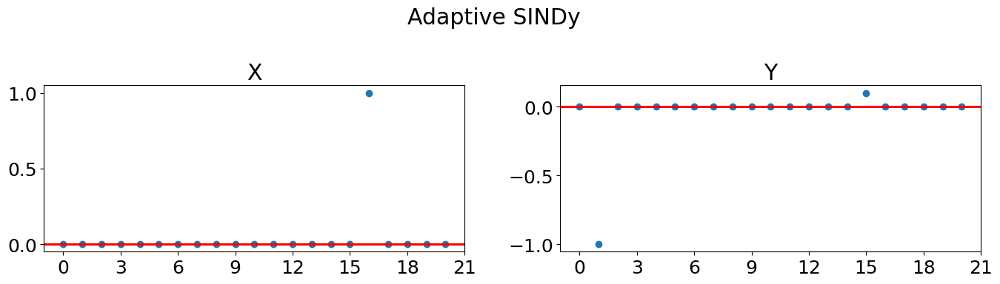

In [10]:
threshold = 0.0005
#****************************************************************************#
loc = plticker.MultipleLocator(base=3) # this locator puts ticks at regular intervals
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize =(14, 4))
fig.suptitle('Adaptive SINDy')

ax[0].plot(COEFF_ADT [:, 0].detach().cpu().numpy(), 'o') 
ax[0].set_title('X')
ax[0].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[0].axhline(y = -threshold, color = 'r', linestyle = '-')
ax[0].xaxis.set_major_locator(loc)

ax[1].plot(COEFF_ADT [:, 1].detach().cpu().numpy(), 'o') 
ax[1].set_title('Y')
ax[1].axhline(y =  threshold, color = 'r', linestyle = '-')
ax[1].axhline(y = -threshold, color = 'r', linestyle = '-')
ax[1].xaxis.set_major_locator(loc)

fig.subplots_adjust(top=0.8)
fig.tight_layout()
plt.show()


In [11]:
print(COEFF_ADT)
print(SINE_ADT )
print(XSINE_ADT)
print(COSINE_ADT)
print(XCOSINE_ADT)
print(EXP_ADT)
print(XEXP_ADT)

tensor([[ 0.0000,  0.0000],
        [ 0.0000, -1.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.1000],
        [ 1.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000],
        [ 0.0000,  0.0000]], device='cuda:0', requires_grad=True)
tensor([[4.7749, 0.0000],
        [0.0000, 5.8341]], device='cuda:0', requires_grad=True)
tensor([[3.6206, 4.3810],
        [0.0000, 3.6697]], device='cuda:0', requires_grad=True)
tensor([[5.1421, 6.7952],
        [2.7469, 5.1230]], device='cuda:0', requires_grad=True)
tensor([[4.4792, 0.7500],
        [0.0000, 9.6365]], device='cuda:0', requires_grad=True)
tensor([[-0.13

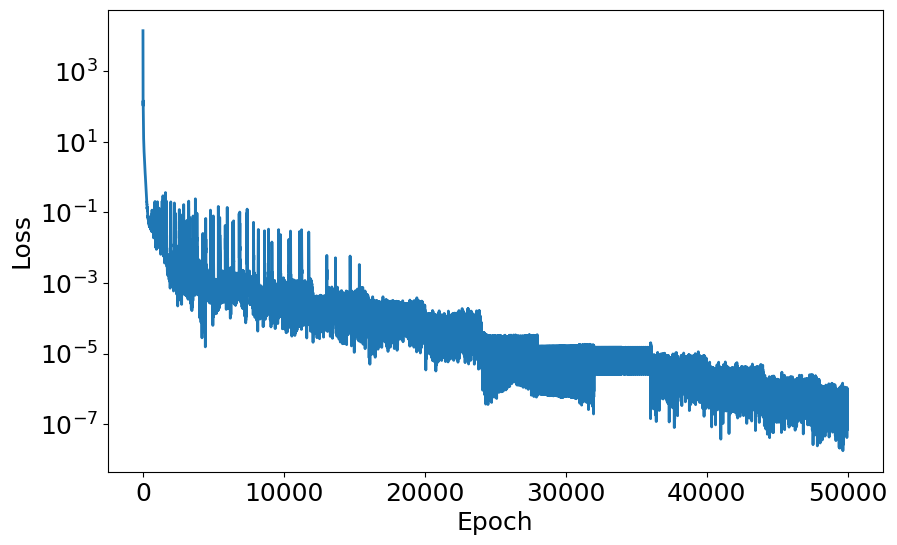

In [12]:
plt.figure(figsize=(10, 6))
plt.plot(Loss_data.numpy())
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')
plt.grid(False)
plt.savefig('Harmonic_Loss_plot.jpeg', dpi = 1200)
plt.show()

# --- Export Loss Data to Tecplot Format ---
loss_np = Loss_data.numpy()
epochs = np.arange(len(loss_np))
loss_data = np.column_stack((epochs, loss_np))

# Header for Tecplot
header = 'VARIABLES = "Epoch", "Loss"\nZONE T="Loss Plot", I={}, F=POINT\n'.format(len(epochs))

# Write to .dat with scientific notation
with open('loss_plot_joint_min.dat', 'w') as f:
    f.write(header)
    np.savetxt(f, loss_data, fmt='%.6e', delimiter='\t')

In [14]:
# Convert tensors to numpy arrays
gamma_correct_np = torch.abs(Gamma_correct).numpy()
gamma_incorrect_np = torch.abs(Gamma_incorrect).numpy()

# Stack data as columns: Epoch, Gamma_correct, Gamma_incorrect
epochs = np.arange(len(gamma_correct_np))
data = np.column_stack((epochs, gamma_correct_np, gamma_incorrect_np))

# Define header for Tecplot
header = 'VARIABLES = "Epoch", "Gamma_Correct", "Gamma_Incorrect"\nZONE T="Gamma Plot", I={}, F=POINT\n'.format(len(epochs))

# Write to .dat file
with open('gamma_plot_joint_min.dat', 'w') as f:
    f.write(header)
    np.savetxt(f, data, fmt='%.4e', delimiter='\t')